# **Our Dataset Features**


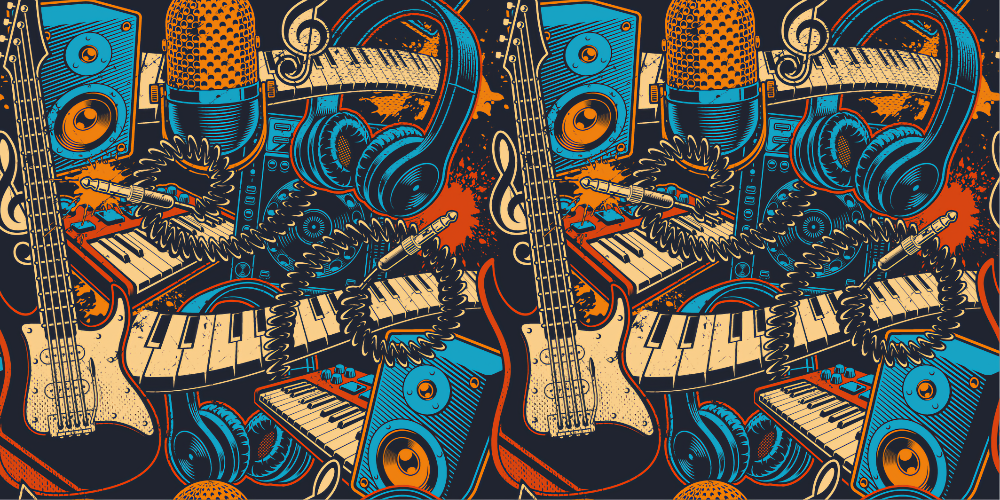

- **artist**: Name of the Artist.

- **song**: Name of the Track.

- **popularity**: The higher the value the more popular the song is.

- **danceability**: Danceability describes how suitable a track is for dancing based on a combination of musical elements including tempo, rhythm.

- **energy**: Energy is a measure from 0.0 to 1.0 and represents a perceptual measure of intensity and activity.

- **key**: The key the track is in. Integers map to pitches using standard Pitch Class notation. E.g. 0 = C, 1 = C♯/D♭, 2 = D, and so on.

- **loudness**: The overall loudness of a track in decibels (dB). Loudness values are averaged across the entire track and are useful for comparing relative loudness.

- **mode**: Mode indicates the modality (major or minor) of a track, the type of scale from which its melodic content is derived. Major is represented by 1 and minor is 0.

- **speechiness**: Speechiness detects the presence of spoken words in a track. The more exclusively speech-like the recording (e.g. talk show, audio book, poetry), the closer to 1.0 the attribute value.

- **acousticness**: A confidence measure from 0.0 to 1.0 of whether the track is acoustic. 1.0 represents high confidence the track is acoustic.

- **instrumentalness**: Predicts whether a track contains no vocals. "Ooh" and "aah" sounds are treated as instrumental in this context. Rap or spoken word tracks are clearly "vocal".

- **liveness**: Detects the presence of an audience in the recording. Higher liveness values represent an increased probability that the track was performed live.

- **valence**: A measure from 0.0 to 1.0 describing the musical positiveness conveyed by a track.

- **tempo**: The overall estimated tempo of a track in beats per minute (BPM).
- **duration in milliseconds**: Time of the song.

- **time_signature**: A notational convention used in Western musical notation to specify how many beats (pulses) are contained in each measure (bar), and which note value is equivalent to a beat.

- **Class**: Genre of the track, Such as Rock, Indie, Alt, Pop, Metal, HipHop, Alt_Music, Blues, Acoustic/Folk, Instrumental, Country, Bollywood.

# **Reading Data**

In [ ]:
import pandas as pd
pd.set_option('display.max_columns', 50)
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
plt.style.use('ggplot')
import sklearn

In [ ]:
csv_file_path = '/content/shai-music-genre-classification-2/train (1).csv'

df = pd.read_csv(csv_file_path)

df

,Id,Artist Name,Track Name,Popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_in min/ms,time_signature,Class
0,1,Marina Maximilian,Not Afraid,37.0,0.334,0.536,9.0,-6.649,0,0.0381,0.378000,NaN,0.1060,0.235,152.429,204947.000000,4,9
1,2,The Black Keys,Howlin' for You,67.0,0.725,0.747,11.0,-5.545,1,0.0876,0.027200,0.046800,0.1040,0.380,132.921,191956.000000,4,6
2,3,Royal & the Serpent,phuck u,NaN,0.584,0.804,7.0,-6.094,1,0.0619,0.000968,0.635000,0.2840,0.635,159.953,161037.000000,4,10
3,4,Detroit Blues Band,Missing You,12.0,0.515,0.308,NaN,-14.711,1,0.0312,0.907000,0.021300,0.3000,0.501,172.472,298093.000000,3,2
4,5,Coast Contra,My Lady,48.0,0.565,0.777,6.0,-5.096,0,0.2490,0.183000,NaN,0.2110,0.619,88.311,254145.000000,4,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14391,14392,NOISY,I Wish I Was A...,47.0,0.607,0.946,1.0,-2.965,1,0.1500,0.005480,0.000390,0.2780,0.653,120.011,195181.000000,4,10
14392,14393,BLOODSPOT,Deadline Story (feat. Patrick Boos),27.0,0.435,0.951,8.0,-7.475,1,0.0576,0.000005,0.550000,0.0952,0.203,135.034,282043.000000,4,8
14393,14394,Cold Years,Too Far Gone,22.0,0.415,0.941,11.0,-4.300,1,0.0524,0.001810,0.000004,0.3370,0.572,167.978,176529.000000,4,10
14394,14395,The Jaded Hearts Club,Reach Out I'll Be There,37.0,0.493,0.986,1.0,-2.279,1,0.0917,0.000967,0.006620,0.1230,0.567,122.036,186307.000000,4,10


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14396 entries, 0 to 14395
Data columns (total 18 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Id                  14396 non-null  int64  
 1   Artist Name         14396 non-null  object 
 2   Track Name          14396 non-null  object 
 3   Popularity          14063 non-null  float64
 4   danceability        14396 non-null  float64
 5   energy              14396 non-null  float64
 6   key                 12787 non-null  float64
 7   loudness            14396 non-null  float64
 8   mode                14396 non-null  int64  
 9   speechiness         14396 non-null  float64
 10  acousticness        14396 non-null  float64
 11  instrumentalness    10855 non-null  float64
 12  liveness            14396 non-null  float64
 13  valence             14396 non-null  float64
 14  tempo               14396 non-null  float64
 15  duration_in min/ms  14396 non-null  float64
 16  time

In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Id,14396.0,7198.500000,4155.911573,1.000000,3599.750000,7198.50000,10797.25000,14396.000
Popularity,14063.0,44.525208,17.418940,1.000000,33.000000,44.00000,56.00000,100.000
danceability,14396.0,0.543105,0.165517,0.059600,0.432000,0.54500,0.65800,0.989
energy,14396.0,0.662422,0.235967,0.001210,0.508000,0.69900,0.86100,1.000
key,12787.0,5.953781,3.200013,1.000000,3.000000,6.00000,9.00000,11.000
loudness,14396.0,-7.900852,4.057362,-39.952000,-9.538000,-7.01350,-5.16200,1.342
mode,14396.0,0.640247,0.479944,0.000000,0.000000,1.00000,1.00000,1.000
speechiness,14396.0,0.080181,0.085157,0.022500,0.034800,0.04710,0.08310,0.955
acousticness,14396.0,0.246746,0.310922,0.000000,0.004280,0.08145,0.43225,0.996
instrumentalness,10855.0,0.178129,0.304266,0.000001,0.000088,0.00392,0.20100,0.996




---



# **Data Preparation**


## **Cleaning Data**

In [ ]:
dtypes = pd.DataFrame(df.dtypes,columns=["Data Type"])

dtypes["Unique Values"]=df.nunique()

dtypes["Null Values"]=df.isnull().sum()

dtypes["% null Values"]=df.isnull().sum()/len(df)

dtypes.sort_values(by="Null Values" , ascending=False).style.background_gradient(cmap='YlOrRd',axis=0)

,Data Type,Unique Values,Null Values,% null Values
instrumentalness,float64,3945,3541,0.245971
key,float64,11,1609,0.111767
Popularity,float64,100,333,0.023131
Id,int64,14396,0,0.000000
acousticness,float64,3725,0,0.000000
time_signature,int64,4,0,0.000000
duration_in min/ms,float64,11805,0,0.000000
tempo,float64,11392,0,0.000000
valence,float64,1268,0,0.000000
liveness,float64,1407,0,0.000000


-  **`['Id','Artist Name','Track Name']` are a High Cardanality Features with `'Id'` having unique id for each track.**
- **Along with `['Artist Name','Track Name']` that are also a text features, So they won't have significant role in our classification.**



In [ ]:
df.drop(columns=['Id'], inplace=True)

> **We can notice also our categorical features `['time_signature','mode','key','Class']` that needs type conversion.**

In [ ]:
catFeatures = ['time_signature','mode','key','Class']

**Checking Duplicates**

In [ ]:
df.duplicated().sum()

0

> **Dropping Duplicates**


In [ ]:
df.drop_duplicates(inplace=True)

In [ ]:
org_df = df.copy()

## **Missing Values**

- **We can see that we have only three features with null values `['instrumentalness','key','Popularity']` with `'instrumentalness'` having quarter of it's values as null values.**

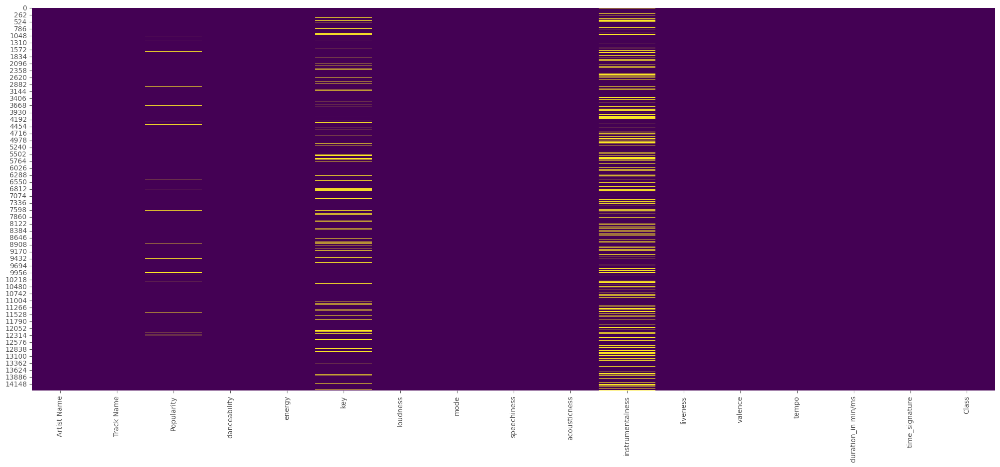

In [ ]:
plt.figure(figsize=(25,10))
sns.heatmap(df.isnull(), cbar=False, cmap='viridis')
plt.show()

**Imputing Null Values**

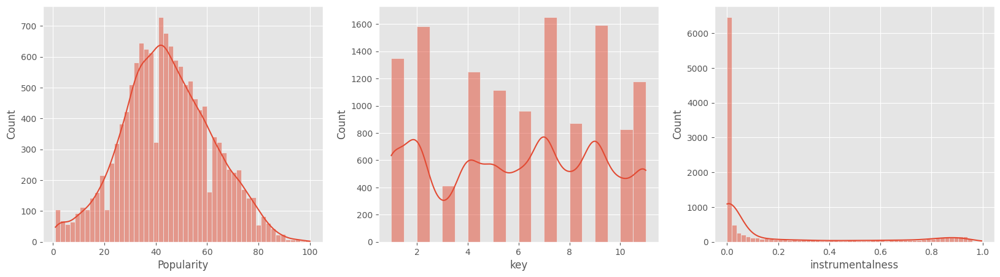

In [ ]:
nullCols = ['Popularity','key','instrumentalness']

plt.figure(figsize=(20,5))

for i, col in enumerate(nullCols):

        ax = plt.subplot(1, 3, i+1)

        sns.histplot(df[col] , ax=ax , kde=True)

        plt.xlabel(col)

plt.show()

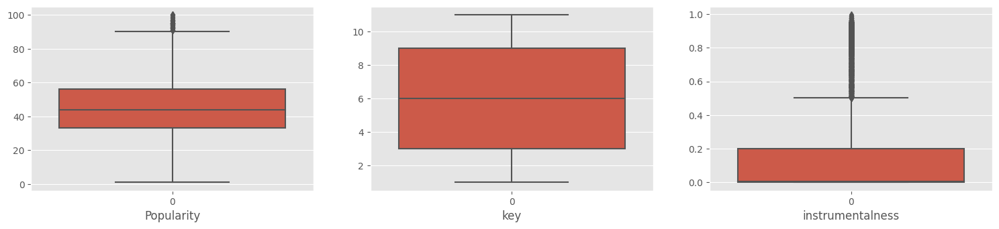

In [ ]:
plt.figure(figsize=(25,25))

for i, col in enumerate(nullCols):

        ax = plt.subplot(6, 4, i+1)

        sns.boxplot(df[col] , ax=ax)

        plt.xlabel(col)

plt.show()

- **We will impute them with the median since they seem to have outliers.**

In [ ]:
from sklearn.impute import SimpleImputer

nullImputer = SimpleImputer(strategy='median')

df[nullCols] = pd.DataFrame(nullImputer.fit_transform(df[nullCols]))

df.isna().sum()

Artist Name           0
Track Name            0
Popularity            0
danceability          0
energy                0
key                   0
loudness              0
mode                  0
speechiness           0
acousticness          0
instrumentalness      0
liveness              0
valence               0
tempo                 0
duration_in min/ms    0
time_signature        0
Class                 0
dtype: int64

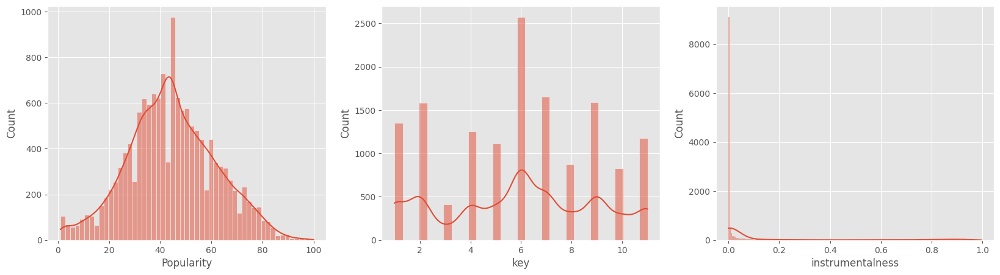

In [ ]:
plt.figure(figsize=(20,5))

for i, col in enumerate(nullCols):

        ax = plt.subplot(1, 3, i+1)

        sns.histplot(df[col] , ax=ax , kde=True)

        plt.xlabel(col)

plt.show()

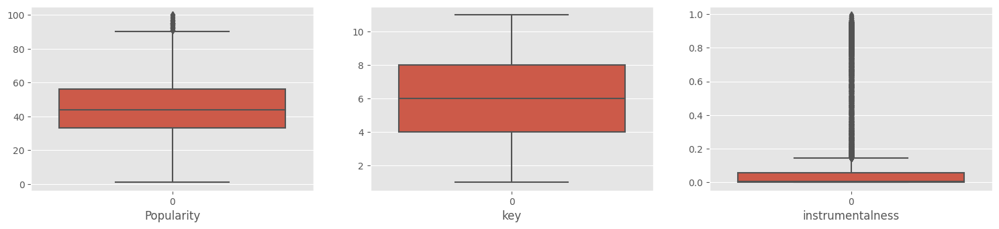

In [ ]:
plt.figure(figsize=(25,25))

for i, col in enumerate(nullCols):

        ax = plt.subplot(6, 4, i+1)

        sns.boxplot(df[col] , ax=ax)

        plt.xlabel(col)

plt.show()

## **Making New Features**

> **Since we have only 16 features to predict our track genre, let's try to introduce new ones.**

In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Popularity,14396.0,44.513059,17.216466,1.000000,33.000000,44.00000,56.00000,100.000
danceability,14396.0,0.543105,0.165517,0.059600,0.432000,0.54500,0.65800,0.989
energy,14396.0,0.662422,0.235967,0.001210,0.508000,0.69900,0.86100,1.000
key,14396.0,5.958947,3.015909,1.000000,4.000000,6.00000,8.00000,11.000
loudness,14396.0,-7.900852,4.057362,-39.952000,-9.538000,-7.01350,-5.16200,1.342
mode,14396.0,0.640247,0.479944,0.000000,0.000000,1.00000,1.00000,1.000
speechiness,14396.0,0.080181,0.085157,0.022500,0.034800,0.04710,0.08310,0.955
acousticness,14396.0,0.246746,0.310922,0.000000,0.004280,0.08145,0.43225,0.996
instrumentalness,14396.0,0.135278,0.274652,0.000001,0.000295,0.00392,0.05760,0.996
liveness,14396.0,0.195782,0.159258,0.011900,0.097275,0.12900,0.25600,0.992


In [ ]:
px.histogram(df['duration_in min/ms'])

- **`'duration_in min/ms'` Feature seems to have tracks both in minutes and millsecond, let's analyze further.**

In [ ]:
df[df['duration_in min/ms'] < 1000]

,Artist Name,Track Name,Popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_in min/ms,time_signature,Class
6,Shadow and Light,Blue,11.0,0.658,0.4310,1.0,-12.718,0,0.0300,0.615,0.292000,0.0902,0.528,132.045,3.893933,5,0
10,Dierks Bentley,What Was I Thinkin',68.0,0.551,0.8250,5.0,-6.240,0,0.0440,0.152,0.000006,0.0999,0.933,164.857,4.347117,4,4
14,"Kelsea Ballerini, Kenny Chesney",half of my hometown (feat. Kenny Chesney),70.0,0.571,0.6180,10.0,-4.966,1,0.0445,0.147,0.003920,0.1590,0.288,138.030,3.863867,4,4
18,The Collective Projekt,Dama Dam Mast Kalandar,10.0,0.232,0.8950,2.0,-2.834,1,0.0517,0.660,0.003920,0.1240,0.343,175.443,5.227267,4,0
19,Mohammed Rafi,All Line Clear,4.0,0.525,0.3950,6.0,-9.291,1,0.0771,0.679,0.001250,0.2270,0.889,124.537,3.398883,4,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14370,Vijay Prakash,Krishna Nee Begane,24.0,0.262,0.4710,7.0,-7.795,1,0.0331,0.824,0.003920,0.1090,0.270,170.356,6.357333,4,0
14371,The Roving,"Bonny Light Horseman, Eric D. Johnson, Josh Ka...",43.0,0.540,0.4530,5.0,-7.336,1,0.0256,0.579,0.019700,0.1130,0.571,137.897,4.347200,4,0
14375,Masked Wolf,Astronaut In The Ocean,90.0,0.778,0.6950,4.0,-6.865,0,0.0913,0.175,0.003920,0.1500,0.472,149.996,2.213000,4,9
14380,Lavinia Meijer,La Valse d'Amélie,39.0,0.246,0.0833,9.0,-25.533,0,0.0488,0.992,0.915000,0.0883,0.161,92.413,2.642450,3,7


- **Those values are surely in minutes, there is technically no tracks that are less than one second(1000ms) or higher than 1000 minutes.**

> **So let's transform the all tracks duration to milleseconds.**

In [ ]:
minutesDurations = df[df['duration_in min/ms'] < 1000]

df['duration_in min/ms'].loc[minutesDurations.index] = minutesDurations['duration_in min/ms'] * (1000 * 60)

df.rename(columns={'duration_in min/ms': 'duration_ms'}, inplace=True)

df

<ipython-input-22-ca0bd4a5c084>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Artist Name,Track Name,Popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,Class
0,Marina Maximilian,Not Afraid,37.0,0.334,0.536,9.0,-6.649,0,0.0381,0.378000,0.003920,0.1060,0.235,152.429,204947.00000,4,9
1,The Black Keys,Howlin' for You,67.0,0.725,0.747,11.0,-5.545,1,0.0876,0.027200,0.046800,0.1040,0.380,132.921,191956.00000,4,6
2,Royal & the Serpent,phuck u,44.0,0.584,0.804,7.0,-6.094,1,0.0619,0.000968,0.635000,0.2840,0.635,159.953,161037.00000,4,10
3,Detroit Blues Band,Missing You,12.0,0.515,0.308,6.0,-14.711,1,0.0312,0.907000,0.021300,0.3000,0.501,172.472,298093.00000,3,2
4,Coast Contra,My Lady,48.0,0.565,0.777,6.0,-5.096,0,0.2490,0.183000,0.003920,0.2110,0.619,88.311,254145.00000,4,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14391,NOISY,I Wish I Was A...,47.0,0.607,0.946,1.0,-2.965,1,0.1500,0.005480,0.000390,0.2780,0.653,120.011,195181.00000,4,10
14392,BLOODSPOT,Deadline Story (feat. Patrick Boos),27.0,0.435,0.951,8.0,-7.475,1,0.0576,0.000005,0.550000,0.0952,0.203,135.034,282043.00000,4,8
14393,Cold Years,Too Far Gone,22.0,0.415,0.941,11.0,-4.300,1,0.0524,0.001810,0.000004,0.3370,0.572,167.978,176529.00000,4,10
14394,The Jaded Hearts Club,Reach Out I'll Be There,37.0,0.493,0.986,1.0,-2.279,1,0.0917,0.000967,0.006620,0.1230,0.567,122.036,186307.00000,4,10


In [ ]:
px.histogram(df['duration_ms'])

- **We can see the now the true duration range of our trakcs, seems to have intersting outliers.**

- **Binning numerical features could help make the data more linear.**

In [ ]:
popularity_labels = ['Uncomman', 'Comman', 'Popular', 'Trendy']

colToBin = df['Popularity']

popularity_bins = [colToBin.min(), 25.0, 50.0, 75.0, colToBin.max()]

df['Relevancy'] = pd.cut(df['Popularity'], bins=popularity_bins, labels=popularity_labels, right=True, include_lowest=True)

df

,Artist Name,Track Name,Popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,Class,Relevancy
0,Marina Maximilian,Not Afraid,37.0,0.334,0.536,9.0,-6.649,0,0.0381,0.378000,0.003920,0.1060,0.235,152.429,204947.00000,4,9,Comman
1,The Black Keys,Howlin' for You,67.0,0.725,0.747,11.0,-5.545,1,0.0876,0.027200,0.046800,0.1040,0.380,132.921,191956.00000,4,6,Popular
2,Royal & the Serpent,phuck u,44.0,0.584,0.804,7.0,-6.094,1,0.0619,0.000968,0.635000,0.2840,0.635,159.953,161037.00000,4,10,Comman
3,Detroit Blues Band,Missing You,12.0,0.515,0.308,6.0,-14.711,1,0.0312,0.907000,0.021300,0.3000,0.501,172.472,298093.00000,3,2,Uncomman
4,Coast Contra,My Lady,48.0,0.565,0.777,6.0,-5.096,0,0.2490,0.183000,0.003920,0.2110,0.619,88.311,254145.00000,4,5,Comman
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14391,NOISY,I Wish I Was A...,47.0,0.607,0.946,1.0,-2.965,1,0.1500,0.005480,0.000390,0.2780,0.653,120.011,195181.00000,4,10,Comman
14392,BLOODSPOT,Deadline Story (feat. Patrick Boos),27.0,0.435,0.951,8.0,-7.475,1,0.0576,0.000005,0.550000,0.0952,0.203,135.034,282043.00000,4,8,Comman
14393,Cold Years,Too Far Gone,22.0,0.415,0.941,11.0,-4.300,1,0.0524,0.001810,0.000004,0.3370,0.572,167.978,176529.00000,4,10,Uncomman
14394,The Jaded Hearts Club,Reach Out I'll Be There,37.0,0.493,0.986,1.0,-2.279,1,0.0917,0.000967,0.006620,0.1230,0.567,122.036,186307.00000,4,10,Comman


In [ ]:
df['Relevancy'].value_counts()

Comman      7633
Popular     4345
Uncomman    1805
Trendy       613
Name: Relevancy, dtype: int64

- **Values above 0.66 describe tracks that are probably made entirely of spoken words. Values between 0.33 and 0.66 describe tracks that may contain both music and speech, either in sections or layered, including such cases as rap music. Values below 0.33 most likely represent music and other non-speech-like tracks.**

In [ ]:
speech_labels = ['Music', 'Mix', 'Speech']

colToBin = df['speechiness']

speech_bins = [colToBin.min(), 0.33, 0.66, colToBin.max()]

df['type'] = pd.cut(df['speechiness'], bins=speech_bins, labels=speech_labels, right=True, include_lowest=True)

df

,Artist Name,Track Name,Popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,Class,Relevancy,type
0,Marina Maximilian,Not Afraid,37.0,0.334,0.536,9.0,-6.649,0,0.0381,0.378000,0.003920,0.1060,0.235,152.429,204947.00000,4,9,Comman,Music
1,The Black Keys,Howlin' for You,67.0,0.725,0.747,11.0,-5.545,1,0.0876,0.027200,0.046800,0.1040,0.380,132.921,191956.00000,4,6,Popular,Music
2,Royal & the Serpent,phuck u,44.0,0.584,0.804,7.0,-6.094,1,0.0619,0.000968,0.635000,0.2840,0.635,159.953,161037.00000,4,10,Comman,Music
3,Detroit Blues Band,Missing You,12.0,0.515,0.308,6.0,-14.711,1,0.0312,0.907000,0.021300,0.3000,0.501,172.472,298093.00000,3,2,Uncomman,Music
4,Coast Contra,My Lady,48.0,0.565,0.777,6.0,-5.096,0,0.2490,0.183000,0.003920,0.2110,0.619,88.311,254145.00000,4,5,Comman,Music
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14391,NOISY,I Wish I Was A...,47.0,0.607,0.946,1.0,-2.965,1,0.1500,0.005480,0.000390,0.2780,0.653,120.011,195181.00000,4,10,Comman,Music
14392,BLOODSPOT,Deadline Story (feat. Patrick Boos),27.0,0.435,0.951,8.0,-7.475,1,0.0576,0.000005,0.550000,0.0952,0.203,135.034,282043.00000,4,8,Comman,Music
14393,Cold Years,Too Far Gone,22.0,0.415,0.941,11.0,-4.300,1,0.0524,0.001810,0.000004,0.3370,0.572,167.978,176529.00000,4,10,Uncomman,Music
14394,The Jaded Hearts Club,Reach Out I'll Be There,37.0,0.493,0.986,1.0,-2.279,1,0.0917,0.000967,0.006620,0.1230,0.567,122.036,186307.00000,4,10,Comman,Music


In [ ]:
df['type'].value_counts()

Music     13953
Mix         430
Speech       13
Name: type, dtype: int64

- **Tracks with high valence sound more positive (e.g. happy, cheerful, euphoric), while tracks with low valence sound more negative (e.g. sad, depressed, angry).**

In [ ]:
mood_labels = ['Sad', 'Normal', 'Happy']

colToBin = df['valence']

mood_bins = [colToBin.min(), colToBin.quantile(0.25), colToBin.quantile(0.75), colToBin.max()]

df.rename(columns={'mode': 'modality'}, inplace=True)

df['mood'] = pd.cut(df['valence'], bins=mood_bins, labels=mood_labels, right=True, include_lowest=True)

df

,Artist Name,Track Name,Popularity,danceability,energy,key,loudness,modality,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,Class,Relevancy,type,mood
0,Marina Maximilian,Not Afraid,37.0,0.334,0.536,9.0,-6.649,0,0.0381,0.378000,0.003920,0.1060,0.235,152.429,204947.00000,4,9,Comman,Music,Sad
1,The Black Keys,Howlin' for You,67.0,0.725,0.747,11.0,-5.545,1,0.0876,0.027200,0.046800,0.1040,0.380,132.921,191956.00000,4,6,Popular,Music,Normal
2,Royal & the Serpent,phuck u,44.0,0.584,0.804,7.0,-6.094,1,0.0619,0.000968,0.635000,0.2840,0.635,159.953,161037.00000,4,10,Comman,Music,Normal
3,Detroit Blues Band,Missing You,12.0,0.515,0.308,6.0,-14.711,1,0.0312,0.907000,0.021300,0.3000,0.501,172.472,298093.00000,3,2,Uncomman,Music,Normal
4,Coast Contra,My Lady,48.0,0.565,0.777,6.0,-5.096,0,0.2490,0.183000,0.003920,0.2110,0.619,88.311,254145.00000,4,5,Comman,Music,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14391,NOISY,I Wish I Was A...,47.0,0.607,0.946,1.0,-2.965,1,0.1500,0.005480,0.000390,0.2780,0.653,120.011,195181.00000,4,10,Comman,Music,Normal
14392,BLOODSPOT,Deadline Story (feat. Patrick Boos),27.0,0.435,0.951,8.0,-7.475,1,0.0576,0.000005,0.550000,0.0952,0.203,135.034,282043.00000,4,8,Comman,Music,Sad
14393,Cold Years,Too Far Gone,22.0,0.415,0.941,11.0,-4.300,1,0.0524,0.001810,0.000004,0.3370,0.572,167.978,176529.00000,4,10,Uncomman,Music,Normal
14394,The Jaded Hearts Club,Reach Out I'll Be There,37.0,0.493,0.986,1.0,-2.279,1,0.0917,0.000967,0.006620,0.1230,0.567,122.036,186307.00000,4,10,Comman,Music,Normal


In [ ]:
df['mood'].value_counts()

Normal    7191
Sad       3619
Happy     3586
Name: mood, dtype: int64

- **The closer the instrumentalness value is to 1.0, the greater likelihood the track contains no vocal content. Values above 0.5 are intended to represent instrumental tracks, but confidence is higher as the value approaches 1.0.**

In [ ]:
df['instrumental'] = np.where(df['instrumentalness'] > 0.5, 1, 0)

df

,Artist Name,Track Name,Popularity,danceability,energy,key,loudness,modality,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,Class,Relevancy,type,mood,instrumental
0,Marina Maximilian,Not Afraid,37.0,0.334,0.536,9.0,-6.649,0,0.0381,0.378000,0.003920,0.1060,0.235,152.429,204947.00000,4,9,Comman,Music,Sad,0
1,The Black Keys,Howlin' for You,67.0,0.725,0.747,11.0,-5.545,1,0.0876,0.027200,0.046800,0.1040,0.380,132.921,191956.00000,4,6,Popular,Music,Normal,0
2,Royal & the Serpent,phuck u,44.0,0.584,0.804,7.0,-6.094,1,0.0619,0.000968,0.635000,0.2840,0.635,159.953,161037.00000,4,10,Comman,Music,Normal,1
3,Detroit Blues Band,Missing You,12.0,0.515,0.308,6.0,-14.711,1,0.0312,0.907000,0.021300,0.3000,0.501,172.472,298093.00000,3,2,Uncomman,Music,Normal,0
4,Coast Contra,My Lady,48.0,0.565,0.777,6.0,-5.096,0,0.2490,0.183000,0.003920,0.2110,0.619,88.311,254145.00000,4,5,Comman,Music,Normal,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14391,NOISY,I Wish I Was A...,47.0,0.607,0.946,1.0,-2.965,1,0.1500,0.005480,0.000390,0.2780,0.653,120.011,195181.00000,4,10,Comman,Music,Normal,0
14392,BLOODSPOT,Deadline Story (feat. Patrick Boos),27.0,0.435,0.951,8.0,-7.475,1,0.0576,0.000005,0.550000,0.0952,0.203,135.034,282043.00000,4,8,Comman,Music,Sad,1
14393,Cold Years,Too Far Gone,22.0,0.415,0.941,11.0,-4.300,1,0.0524,0.001810,0.000004,0.3370,0.572,167.978,176529.00000,4,10,Uncomman,Music,Normal,0
14394,The Jaded Hearts Club,Reach Out I'll Be There,37.0,0.493,0.986,1.0,-2.279,1,0.0917,0.000967,0.006620,0.1230,0.567,122.036,186307.00000,4,10,Comman,Music,Normal,0


In [ ]:
df['instrumental'].value_counts()

0    12455
1     1941
Name: instrumental, dtype: int64

- **Higher liveness values represent an increased probability that the track was performed live. A value above 0.8 provides strong likelihood that the track is live.**

In [ ]:
df['live'] = np.where(df['liveness'] > 0.5, 1, 0)

df

,Artist Name,Track Name,Popularity,danceability,energy,key,loudness,modality,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,Class,Relevancy,type,mood,instrumental,live
0,Marina Maximilian,Not Afraid,37.0,0.334,0.536,9.0,-6.649,0,0.0381,0.378000,0.003920,0.1060,0.235,152.429,204947.00000,4,9,Comman,Music,Sad,0,0
1,The Black Keys,Howlin' for You,67.0,0.725,0.747,11.0,-5.545,1,0.0876,0.027200,0.046800,0.1040,0.380,132.921,191956.00000,4,6,Popular,Music,Normal,0,0
2,Royal & the Serpent,phuck u,44.0,0.584,0.804,7.0,-6.094,1,0.0619,0.000968,0.635000,0.2840,0.635,159.953,161037.00000,4,10,Comman,Music,Normal,1,0
3,Detroit Blues Band,Missing You,12.0,0.515,0.308,6.0,-14.711,1,0.0312,0.907000,0.021300,0.3000,0.501,172.472,298093.00000,3,2,Uncomman,Music,Normal,0,0
4,Coast Contra,My Lady,48.0,0.565,0.777,6.0,-5.096,0,0.2490,0.183000,0.003920,0.2110,0.619,88.311,254145.00000,4,5,Comman,Music,Normal,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14391,NOISY,I Wish I Was A...,47.0,0.607,0.946,1.0,-2.965,1,0.1500,0.005480,0.000390,0.2780,0.653,120.011,195181.00000,4,10,Comman,Music,Normal,0,0
14392,BLOODSPOT,Deadline Story (feat. Patrick Boos),27.0,0.435,0.951,8.0,-7.475,1,0.0576,0.000005,0.550000,0.0952,0.203,135.034,282043.00000,4,8,Comman,Music,Sad,1,0
14393,Cold Years,Too Far Gone,22.0,0.415,0.941,11.0,-4.300,1,0.0524,0.001810,0.000004,0.3370,0.572,167.978,176529.00000,4,10,Uncomman,Music,Normal,0,0
14394,The Jaded Hearts Club,Reach Out I'll Be There,37.0,0.493,0.986,1.0,-2.279,1,0.0917,0.000967,0.006620,0.1230,0.567,122.036,186307.00000,4,10,Comman,Music,Normal,0,0


In [ ]:
df['live'].value_counts()

0    13645
1      751
Name: live, dtype: int64

> **Let's dervice some features from artist and track names.**

In [ ]:
df['ArtistName_Lenght'] = df['Artist Name'].apply(len)              # Lenght of Artist Name
df['TracktName_Lenght'] = df['Track Name'].apply(len)               # Lenght of Track Name
df['ArtistName_Words'] = df['Artist Name'].str.split().str.len()    # Words in Artist Name
df['TracktName_Words'] = df['Track Name'].str.split().str.len()     # Words in Song_Name

df

,Artist Name,Track Name,Popularity,danceability,energy,key,loudness,modality,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,Class,Relevancy,type,mood,instrumental,live,ArtistName_Lenght,TracktName_Lenght,ArtistName_Words,TracktName_Words
0,Marina Maximilian,Not Afraid,37.0,0.334,0.536,9.0,-6.649,0,0.0381,0.378000,0.003920,0.1060,0.235,152.429,204947.00000,4,9,Comman,Music,Sad,0,0,17,10,2,2
1,The Black Keys,Howlin' for You,67.0,0.725,0.747,11.0,-5.545,1,0.0876,0.027200,0.046800,0.1040,0.380,132.921,191956.00000,4,6,Popular,Music,Normal,0,0,14,15,3,3
2,Royal & the Serpent,phuck u,44.0,0.584,0.804,7.0,-6.094,1,0.0619,0.000968,0.635000,0.2840,0.635,159.953,161037.00000,4,10,Comman,Music,Normal,1,0,19,7,4,2
3,Detroit Blues Band,Missing You,12.0,0.515,0.308,6.0,-14.711,1,0.0312,0.907000,0.021300,0.3000,0.501,172.472,298093.00000,3,2,Uncomman,Music,Normal,0,0,18,11,3,2
4,Coast Contra,My Lady,48.0,0.565,0.777,6.0,-5.096,0,0.2490,0.183000,0.003920,0.2110,0.619,88.311,254145.00000,4,5,Comman,Music,Normal,0,0,12,7,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14391,NOISY,I Wish I Was A...,47.0,0.607,0.946,1.0,-2.965,1,0.1500,0.005480,0.000390,0.2780,0.653,120.011,195181.00000,4,10,Comman,Music,Normal,0,0,5,17,1,5
14392,BLOODSPOT,Deadline Story (feat. Patrick Boos),27.0,0.435,0.951,8.0,-7.475,1,0.0576,0.000005,0.550000,0.0952,0.203,135.034,282043.00000,4,8,Comman,Music,Sad,1,0,9,35,1,5
14393,Cold Years,Too Far Gone,22.0,0.415,0.941,11.0,-4.300,1,0.0524,0.001810,0.000004,0.3370,0.572,167.978,176529.00000,4,10,Uncomman,Music,Normal,0,0,10,12,2,3
14394,The Jaded Hearts Club,Reach Out I'll Be There,37.0,0.493,0.986,1.0,-2.279,1,0.0917,0.000967,0.006620,0.1230,0.567,122.036,186307.00000,4,10,Comman,Music,Normal,0,0,21,23,4,5


- **Frequency Encoding**

In [ ]:
from category_encoders import CountEncoder

encoder = CountEncoder(cols=['Artist Name','Track Name'])

df[['ArtistName_Counts','TrackName_Counts']] = encoder.fit_transform(df[['Artist Name','Track Name']], df['Class'])

df

,Artist Name,Track Name,Popularity,danceability,energy,key,loudness,modality,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,Class,Relevancy,type,mood,instrumental,live,ArtistName_Lenght,TracktName_Lenght,ArtistName_Words,TracktName_Words,ArtistName_Counts,TrackName_Counts
0,Marina Maximilian,Not Afraid,37.0,0.334,0.536,9.0,-6.649,0,0.0381,0.378000,0.003920,0.1060,0.235,152.429,204947.00000,4,9,Comman,Music,Sad,0,0,17,10,2,2,6,1
1,The Black Keys,Howlin' for You,67.0,0.725,0.747,11.0,-5.545,1,0.0876,0.027200,0.046800,0.1040,0.380,132.921,191956.00000,4,6,Popular,Music,Normal,0,0,14,15,3,3,18,2
2,Royal & the Serpent,phuck u,44.0,0.584,0.804,7.0,-6.094,1,0.0619,0.000968,0.635000,0.2840,0.635,159.953,161037.00000,4,10,Comman,Music,Normal,1,0,19,7,4,2,2,1
3,Detroit Blues Band,Missing You,12.0,0.515,0.308,6.0,-14.711,1,0.0312,0.907000,0.021300,0.3000,0.501,172.472,298093.00000,3,2,Uncomman,Music,Normal,0,0,18,11,3,2,1,1
4,Coast Contra,My Lady,48.0,0.565,0.777,6.0,-5.096,0,0.2490,0.183000,0.003920,0.2110,0.619,88.311,254145.00000,4,5,Comman,Music,Normal,0,0,12,7,2,2,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14391,NOISY,I Wish I Was A...,47.0,0.607,0.946,1.0,-2.965,1,0.1500,0.005480,0.000390,0.2780,0.653,120.011,195181.00000,4,10,Comman,Music,Normal,0,0,5,17,1,5,2,1
14392,BLOODSPOT,Deadline Story (feat. Patrick Boos),27.0,0.435,0.951,8.0,-7.475,1,0.0576,0.000005,0.550000,0.0952,0.203,135.034,282043.00000,4,8,Comman,Music,Sad,1,0,9,35,1,5,1,1
14393,Cold Years,Too Far Gone,22.0,0.415,0.941,11.0,-4.300,1,0.0524,0.001810,0.000004,0.3370,0.572,167.978,176529.00000,4,10,Uncomman,Music,Normal,0,0,10,12,2,3,1,1
14394,The Jaded Hearts Club,Reach Out I'll Be There,37.0,0.493,0.986,1.0,-2.279,1,0.0917,0.000967,0.006620,0.1230,0.567,122.036,186307.00000,4,10,Comman,Music,Normal,0,0,21,23,4,5,1,1


- **Deriving Artists Specific Insights**

In [ ]:
df['ArtistPopularity']= df.groupby(['Artist Name'])['Popularity'].transform('mean')
df['ArtistTracksDuration']= df.groupby(['Artist Name'])['duration_ms'].transform('mean')
df['ArtistTracksAcousticness']= df.groupby(['Artist Name'])['acousticness'].transform('mean')
df['ArtistTracksSpeechiness']= df.groupby(['Artist Name'])['speechiness'].transform('mean')
df['ArtistTracksMood']= df.groupby(['Artist Name'])['valence'].transform('mean')

df

,Artist Name,Track Name,Popularity,danceability,energy,key,loudness,modality,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,Class,Relevancy,type,mood,instrumental,live,ArtistName_Lenght,TracktName_Lenght,ArtistName_Words,TracktName_Words,ArtistName_Counts,TrackName_Counts,ArtistPopularity,ArtistTracksDuration,ArtistTracksAcousticness,ArtistTracksSpeechiness,ArtistTracksMood
0,Marina Maximilian,Not Afraid,37.0,0.334,0.536,9.0,-6.649,0,0.0381,0.378000,0.003920,0.1060,0.235,152.429,204947.00000,4,9,Comman,Music,Sad,0,0,17,10,2,2,6,1,28.5,218387.666667,0.257300,0.037917,0.243333
1,The Black Keys,Howlin' for You,67.0,0.725,0.747,11.0,-5.545,1,0.0876,0.027200,0.046800,0.1040,0.380,132.921,191956.00000,4,6,Popular,Music,Normal,0,0,14,15,3,3,18,2,60.0,221153.555556,0.126128,0.048917,0.541167
2,Royal & the Serpent,phuck u,44.0,0.584,0.804,7.0,-6.094,1,0.0619,0.000968,0.635000,0.2840,0.635,159.953,161037.00000,4,10,Comman,Music,Normal,1,0,19,7,4,2,2,1,59.5,160165.000000,0.154484,0.183450,0.545500
3,Detroit Blues Band,Missing You,12.0,0.515,0.308,6.0,-14.711,1,0.0312,0.907000,0.021300,0.3000,0.501,172.472,298093.00000,3,2,Uncomman,Music,Normal,0,0,18,11,3,2,1,1,12.0,298093.000000,0.907000,0.031200,0.501000
4,Coast Contra,My Lady,48.0,0.565,0.777,6.0,-5.096,0,0.2490,0.183000,0.003920,0.2110,0.619,88.311,254145.00000,4,5,Comman,Music,Normal,0,0,12,7,2,2,2,1,37.5,194042.500000,0.153000,0.324500,0.678500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14391,NOISY,I Wish I Was A...,47.0,0.607,0.946,1.0,-2.965,1,0.1500,0.005480,0.000390,0.2780,0.653,120.011,195181.00000,4,10,Comman,Music,Normal,0,0,5,17,1,5,2,1,47.0,194191.500000,0.002877,0.192000,0.605000
14392,BLOODSPOT,Deadline Story (feat. Patrick Boos),27.0,0.435,0.951,8.0,-7.475,1,0.0576,0.000005,0.550000,0.0952,0.203,135.034,282043.00000,4,8,Comman,Music,Sad,1,0,9,35,1,5,1,1,27.0,282043.000000,0.000005,0.057600,0.203000
14393,Cold Years,Too Far Gone,22.0,0.415,0.941,11.0,-4.300,1,0.0524,0.001810,0.000004,0.3370,0.572,167.978,176529.00000,4,10,Uncomman,Music,Normal,0,0,10,12,2,3,1,1,22.0,176529.000000,0.001810,0.052400,0.572000
14394,The Jaded Hearts Club,Reach Out I'll Be There,37.0,0.493,0.986,1.0,-2.279,1,0.0917,0.000967,0.006620,0.1230,0.567,122.036,186307.00000,4,10,Comman,Music,Normal,0,0,21,23,4,5,1,1,37.0,186307.000000,0.000967,0.091700,0.567000


In [ ]:
df.isna().sum()

Artist Name                 0
Track Name                  0
Popularity                  0
danceability                0
energy                      0
key                         0
loudness                    0
modality                    0
speechiness                 0
acousticness                0
instrumentalness            0
liveness                    0
valence                     0
tempo                       0
duration_ms                 0
time_signature              0
Class                       0
Relevancy                   0
type                        0
mood                        0
instrumental                0
live                        0
ArtistName_Lenght           0
TracktName_Lenght           0
ArtistName_Words            0
TracktName_Words            0
ArtistName_Counts           0
TrackName_Counts            0
ArtistPopularity            0
ArtistTracksDuration        0
ArtistTracksAcousticness    0
ArtistTracksSpeechiness     0
ArtistTracksMood            0
dtype: int

In [ ]:
df[df.isna().any(axis=1)]

,Artist Name,Track Name,Popularity,danceability,energy,key,loudness,modality,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,Class,Relevancy,type,mood,instrumental,live,ArtistName_Lenght,TracktName_Lenght,ArtistName_Words,TracktName_Words,ArtistName_Counts,TrackName_Counts,ArtistPopularity,ArtistTracksDuration,ArtistTracksAcousticness,ArtistTracksSpeechiness,ArtistTracksMood


- **Let's combine all our steps for making new features in one function, this will help us building our pipline.**

In [ ]:
def convertDuration(df):

  df['duration_ms'] = df['duration_in min/ms']

  msDurations = df[df['duration_ms'] < 1000]

  if len(msDurations) > 0:

    df['duration_ms'].loc[msDurations.index] = msDurations['duration_ms'] * (1000 * 60)

  # df.rename(columns={'duration_in min/ms': 'duration_ms'}, inplace=True)

  return df


def binningFeatures(df):

  popularity_labels = ['Uncomman', 'Comman', 'Popular', 'Trendy']
  popularity_bins = [df['Popularity'].min(), 25.0, 50.0, 75.0, df['Popularity'].max()]
  df['Relevancy'] = pd.cut(df['Popularity'], bins=popularity_bins, labels=popularity_labels, right=True, include_lowest=True)

  speech_labels = ['Music', 'Mix', 'Speech']
  speech_bins = [df['speechiness'].min(), 0.33, 0.66, df['speechiness'].max()]
  df['type'] = pd.cut(df['speechiness'], bins=speech_bins, labels=speech_labels, right=True, include_lowest=True)

  mood_labels = ['Sad', 'Normal', 'Happy']
  mood_bins = [df['valence'].min(), 0.30, .67, df['valence'].max()]
  df['mood'] = pd.cut(df['valence'], bins=mood_bins, labels=mood_labels, right=True, include_lowest=True)

  return df

def makeNewFeatures(df):

  df = convertDuration(df)

  df.rename(columns={'mode': 'modality'}, inplace=True)

  df = binningFeatures(df)

  df['instrumental'] = np.where(df['instrumentalness'] > 0.5, 1, 0)
  df['live'] = np.where(df['liveness'] > 0.5, 1, 0)

  df['ArtistName_Lenght'] = df['Artist Name'].apply(len)
  df['TracktName_Lenght'] = df['Track Name'].apply(len)
  df['ArtistName_Words'] = df['Artist Name'].str.split().str.len()
  df['TracktName_Words'] = df['Track Name'].str.split().str.len()

  # # Will be handled by preprocssing pipeline
  # df['ArtistName_Counts'] = df['Artist Name']
  # df['TrackName_Counts'] = df['Track Name']

  df['ArtistPopularity']= df.groupby(['Artist Name'])['Popularity'].transform('mean')
  df['ArtistTracksDuration']= df.groupby(['Artist Name'])['duration_ms'].transform('mean')
  df['ArtistTracksAcousticness']= df.groupby(['Artist Name'])['acousticness'].transform('mean')
  df['ArtistTracksSpeechiness']= df.groupby(['Artist Name'])['speechiness'].transform('mean')
  df['ArtistTracksMood']= df.groupby(['Artist Name'])['valence'].transform('mean')

  return df

## **Target Encoding**

> **Target encoding is any kind of encoding that replaces a feature's categories with some number derived from the target.**

> **Target encoding is great for High-cardinality features which is the case with artist and track names features.**

In [ ]:
df['ArtistName_Encoded'] = df.groupby("Artist Name")["Class"].transform("mean")

df['TrackName_Encoded'] = df.groupby("Track Name")["Class"].transform("mean")

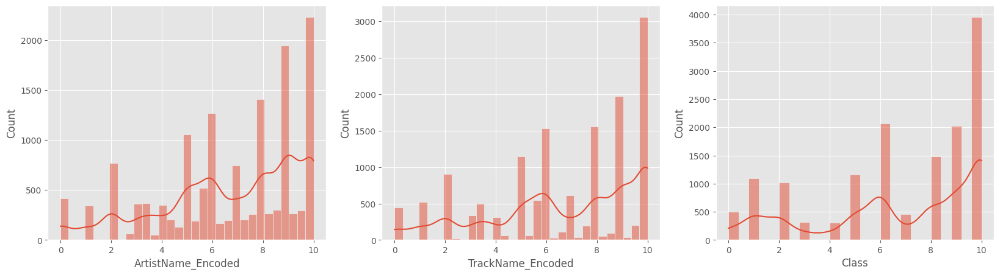

In [ ]:
plt.figure(figsize=(20,5))

for i, col in enumerate(['ArtistName_Encoded','TrackName_Encoded','Class']):

        ax = plt.subplot(1, 3, i+1)

        sns.histplot(df[col] , ax=ax , kde=True)

        plt.xlabel(col)

plt.show()

- **A target encoding derives numbers for the categories using the feature's most important property: its relationship with the target.**

- **The distribution of the encoded features roughly follows the distribution of the genres Classes, meaning that our target encoding was able to capture useful information.**

In [ ]:
!pip install category_encoders
from category_encoders import TargetEncoder, MEstimateEncoder, CatBoostEncoder, LeaveOneOutEncoder

In [ ]:
encoder = MEstimateEncoder(cols=['Artist Name','Track Name'], m=10)

df[['ArtistName_Encoded','TrackName_Encoded']] = encoder.fit_transform(df[['Artist Name','Track Name']], df['Class'])

- **Target encodings create a special risk of overfitting, which means they need to be trained on an independent "encoding" split.**

- **A solution to this is to add smoothing. Rare categories get less weight on their category average, while missing categories just get the overall average.**

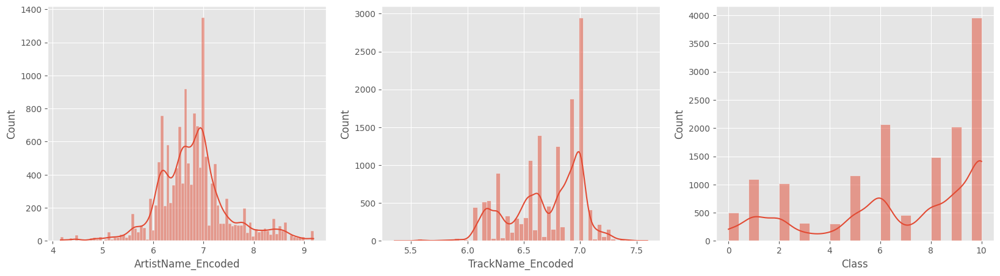

In [ ]:
plt.figure(figsize=(20,5))

for i, col in enumerate(['ArtistName_Encoded','TrackName_Encoded','Class']):

        ax = plt.subplot(1, 3, i+1)

        sns.histplot(df[col] , ax=ax , kde=True)

        plt.xlabel(col)

plt.show()

- **When choosing a value for m, we should consider how noisy we expect the categories to be. Would it need a lot of data to get good estimates?**
 - **If so, it could be better to choose a larger value for m like the case here.**

In [ ]:
encoder = TargetEncoder(cols=['Artist Name','Track Name'])

df[['ArtistName_Encoded','TrackName_Encoded']] = encoder.fit_transform(df[['Artist Name','Track Name']], df['Class'])

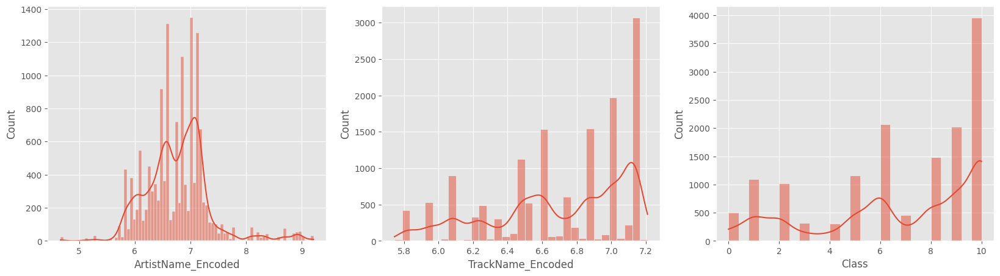

In [ ]:
plt.figure(figsize=(20,5))

for i, col in enumerate(['ArtistName_Encoded','TrackName_Encoded','Class']):

        ax = plt.subplot(1, 3, i+1)

        sns.histplot(df[col] , ax=ax , kde=True)

        plt.xlabel(col)

plt.show()

- **This Target Encoder is simliar to our first approch but it smoothes the `Artist Name` only.**

In [ ]:
encoder = CatBoostEncoder(cols=['Artist Name','Track Name'])

df[['ArtistName_Encoded','TrackName_Encoded']] = encoder.fit_transform(df[['Artist Name','Track Name']], df['Class'])

- **CatBoost encoder is similar to target encoding, but also involves an ordering principle in order to overcome the problem of target leakage.**

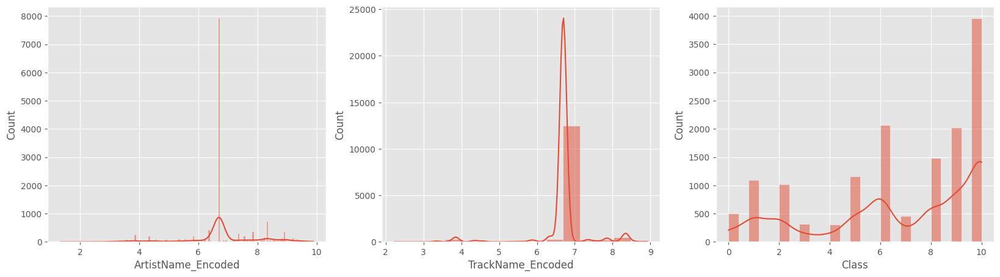

In [ ]:
plt.figure(figsize=(20,5))

for i, col in enumerate(['ArtistName_Encoded','TrackName_Encoded','Class']):

        ax = plt.subplot(1, 3, i+1)

        sns.histplot(df[col] , ax=ax , kde=True)

        plt.xlabel(col)

plt.show()

- **It uses the principle similar to the time series data validation. The values of encoded category rely on the observed history, Target probability for the current feature is calculated only from the rows (observations) before it.**

In [ ]:
encoder = LeaveOneOutEncoder(cols=['Artist Name','Track Name'])

df[['ArtistName_Encoded','TrackName_Encoded']] = encoder.fit_transform(df[['Artist Name','Track Name']], df['Class'])

- **This is very similar to target encoding but excludes the current row’s target when calculating the mean target for a level to reduce the effect of outliers.**

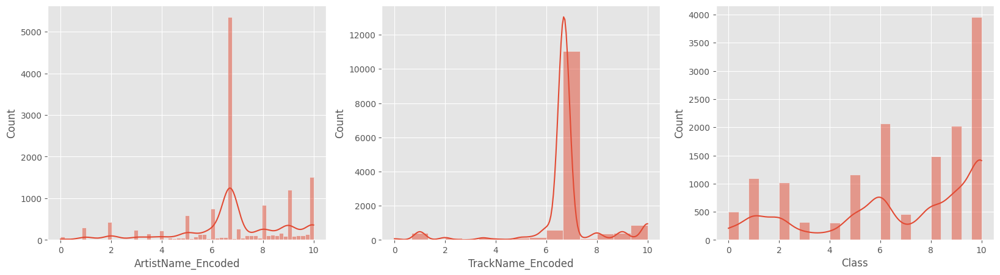

In [ ]:
plt.figure(figsize=(20,5))

for i, col in enumerate(['ArtistName_Encoded','TrackName_Encoded','Class']):

        ax = plt.subplot(1, 3, i+1)

        sns.histplot(df[col] , ax=ax , kde=True)

        plt.xlabel(col)

plt.show()

- **This encoder calculate mean target of category k for observation j if observation j is removed from the dataset.**

In [ ]:
train_df = df.drop(columns = ['Artist Name','Track Name']).copy()

train_df

,Popularity,danceability,energy,key,loudness,modality,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,Class,Relevancy,type,mood,instrumental,live,ArtistName_Lenght,TracktName_Lenght,ArtistName_Words,TracktName_Words,ArtistName_Counts,TrackName_Counts,ArtistPopularity,ArtistTracksDuration,ArtistTracksAcousticness,ArtistTracksSpeechiness,ArtistTracksMood,ArtistName_Encoded,TrackName_Encoded
0,37.0,0.334,0.536,9.0,-6.649,0,0.0381,0.378000,0.003920,0.1060,0.235,152.429,204947.00000,4,9,Comman,Music,Sad,0,0,17,10,2,2,6,1,28.5,218387.666667,0.257300,0.037917,0.243333,9.000000,6.695679
1,67.0,0.725,0.747,11.0,-5.545,1,0.0876,0.027200,0.046800,0.1040,0.380,132.921,191956.00000,4,6,Popular,Music,Normal,0,0,14,15,3,3,18,2,60.0,221153.555556,0.126128,0.048917,0.541167,5.823529,1.000000
2,44.0,0.584,0.804,7.0,-6.094,1,0.0619,0.000968,0.635000,0.2840,0.635,159.953,161037.00000,4,10,Comman,Music,Normal,1,0,19,7,4,2,2,1,59.5,160165.000000,0.154484,0.183450,0.545500,9.000000,6.695679
3,12.0,0.515,0.308,6.0,-14.711,1,0.0312,0.907000,0.021300,0.3000,0.501,172.472,298093.00000,3,2,Uncomman,Music,Normal,0,0,18,11,3,2,1,1,12.0,298093.000000,0.907000,0.031200,0.501000,6.695679,6.695679
4,48.0,0.565,0.777,6.0,-5.096,0,0.2490,0.183000,0.003920,0.2110,0.619,88.311,254145.00000,4,5,Comman,Music,Normal,0,0,12,7,2,2,2,1,37.5,194042.500000,0.153000,0.324500,0.678500,5.000000,6.695679
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14391,47.0,0.607,0.946,1.0,-2.965,1,0.1500,0.005480,0.000390,0.2780,0.653,120.011,195181.00000,4,10,Comman,Music,Normal,0,0,5,17,1,5,2,1,47.0,194191.500000,0.002877,0.192000,0.605000,10.000000,6.695679
14392,27.0,0.435,0.951,8.0,-7.475,1,0.0576,0.000005,0.550000,0.0952,0.203,135.034,282043.00000,4,8,Comman,Music,Sad,1,0,9,35,1,5,1,1,27.0,282043.000000,0.000005,0.057600,0.203000,6.695679,6.695679
14393,22.0,0.415,0.941,11.0,-4.300,1,0.0524,0.001810,0.000004,0.3370,0.572,167.978,176529.00000,4,10,Uncomman,Music,Normal,0,0,10,12,2,3,1,1,22.0,176529.000000,0.001810,0.052400,0.572000,6.695679,6.695679
14394,37.0,0.493,0.986,1.0,-2.279,1,0.0917,0.000967,0.006620,0.1230,0.567,122.036,186307.00000,4,10,Comman,Music,Normal,0,0,21,23,4,5,1,1,37.0,186307.000000,0.000967,0.091700,0.567000,6.695679,6.695679


# **Exploratory Data Analysis**


In [ ]:
catFeatures = ['key','modality','time_signature','Class','Relevancy','mood','type','instrumental','live']

numFeatures = train_df.drop(columns = catFeatures).columns.tolist()

numFeatures, catFeatures

(['Popularity',
  'danceability',
  'energy',
  'loudness',
  'speechiness',
  'acousticness',
  'instrumentalness',
  'liveness',
  'valence',
  'tempo',
  'duration_min',
  'ArtistName_Lenght',
  'TracktName_Lenght',
  'ArtistName_Words',
  'TracktName_Words',
  'ArtistName_Counts',
  'TrackName_Counts',
  'ArtistPopularity',
  'ArtistTracksDuration',
  'ArtistTracksAcousticness',
  'ArtistTracksSpeechiness',
  'ArtistTracksMood',
  'ArtistName_Encoded',
  'TrackName_Encoded'],
 ['key',
  'modality',
  'time_signature',
  'Class',
  'Relevancy',
  'mood',
  'type',
  'instrumental',
  'live'])

## **Text Features**

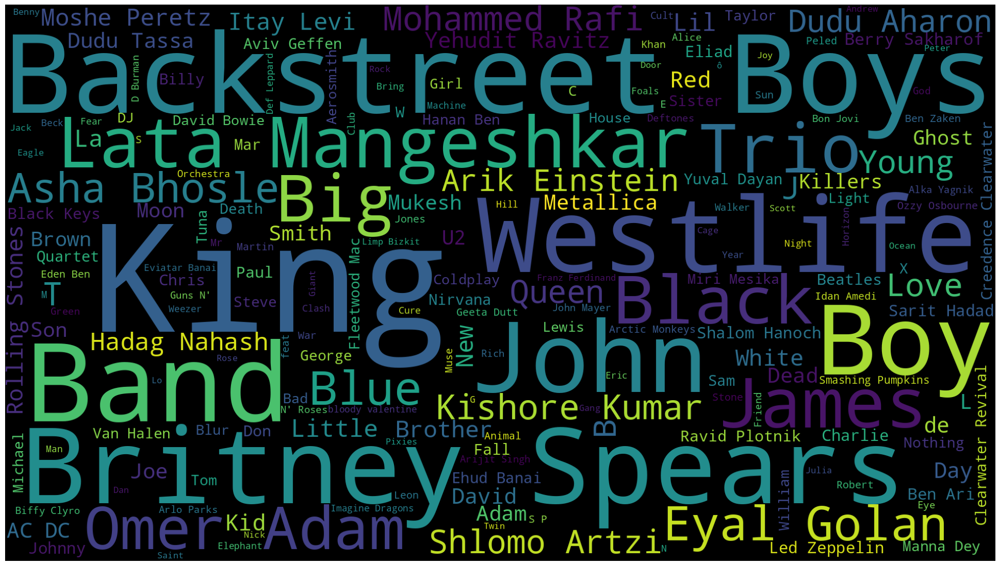

In [ ]:
from wordcloud import WordCloud

plt.subplots(figsize=(25,15))
wordcloud = WordCloud(
                          background_color='Black',
                          width=1920,
                          height=1080
                         ).generate(" ".join(df['Artist Name']))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

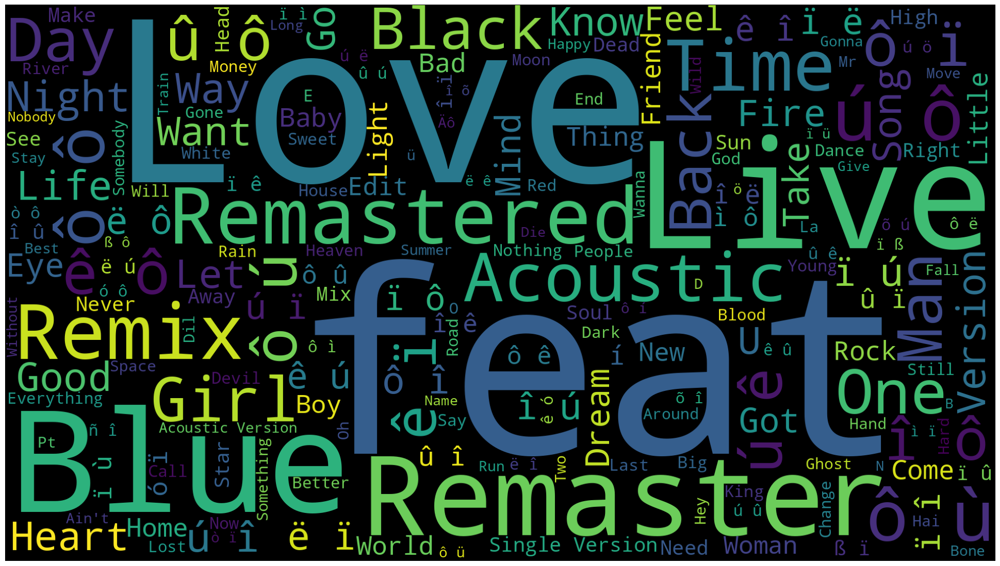

In [ ]:
plt.subplots(figsize=(25,15))
wordcloud = WordCloud(
                          background_color='Black',
                          width=1920,
                          height=1080
                         ).generate(" ".join(df['Track Name']))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

In [ ]:
px.bar(df['Artist Name'].value_counts()[:30], title='Top 30 Common Artists')

In [ ]:
px.bar(df['Track Name'].value_counts()[:30], title='Top 30 Common Tracks')

## **Univariate Analysis**


**Let's Check the Distributions of Our Features**


In [ ]:
len(numFeatures)

24

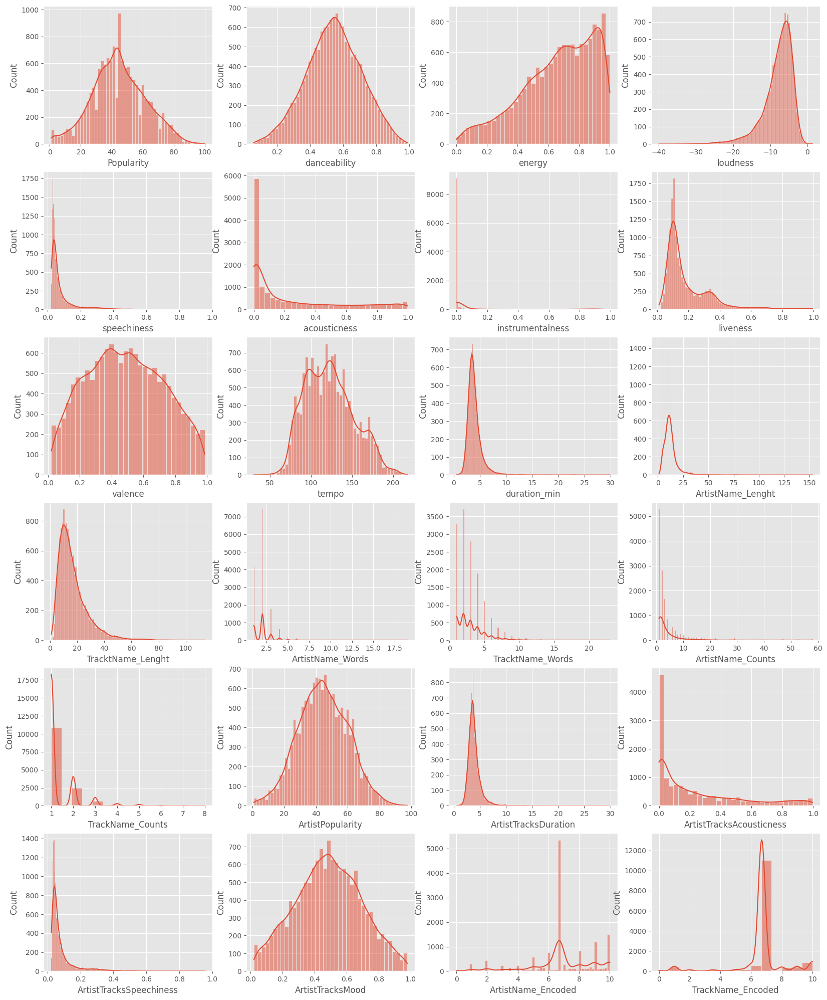

In [ ]:
plt.figure(figsize=(20,25))

for i, col in enumerate(numFeatures):

        ax = plt.subplot(6, 4, i+1)

        sns.histplot(df[col] , ax=ax , kde=True)

        plt.xlabel(col)

plt.show()

In [ ]:
skewnessDF = pd.DataFrame(df[numFeatures].skew(numeric_only=True).T , columns=["Skewness"]).sort_values(by = 'Skewness', ascending=False)
skewnessDF.style.background_gradient(cmap='YlOrRd',axis=0)

,Skewness
ArtistName_Lenght,4.283387
ArtistName_Counts,4.117574
duration_min,3.804277
ArtistTracksDuration,3.593977
ArtistTracksSpeechiness,3.259279
speechiness,3.113395
TrackName_Counts,3.057660
ArtistName_Words,2.981902
liveness,2.178265
TracktName_Lenght,2.080190


- **We could divide our Numerical features to two groups:**
  - **Features that are normally(or almost) distributed: `['Popularity','danceability','valence','tempo']`**

  - **Positvely Right Skewed Features (near zero values) that can be transformed: `['speechiness','acousticness','instrumentalness','liveness','ArtistName_Lenght','TracktName_Lenght','ArtistName_Words','TracktName_Words','ArtistName_Counts','TrackName_Counts']`**


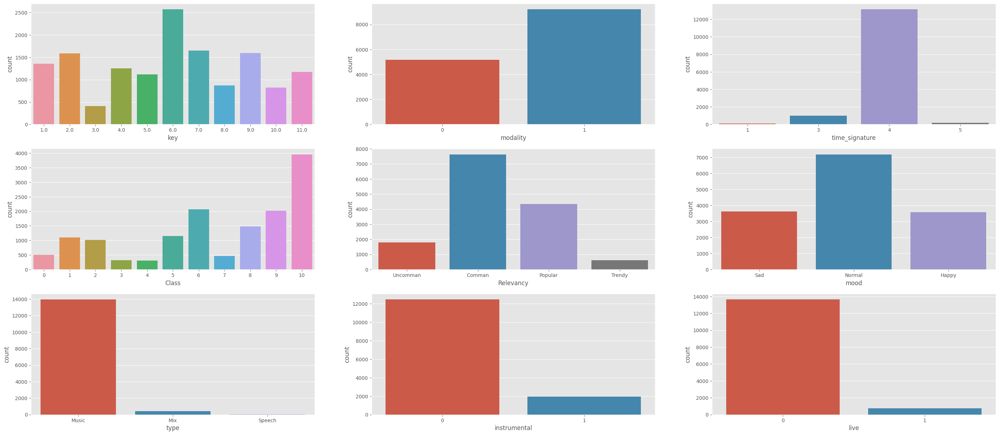

In [ ]:
plt.figure(figsize=(35,15))

for i, col in enumerate(catFeatures):

        ax = plt.subplot(3, 3, i+1)

        sns.countplot(x = df[col] , ax=ax)

        plt.xlabel(col)

plt.show()

- **We can notice that most of our tracks are type 4 Signatures with Minor Mode along with differnt key notes representations.**

- **Our new features seem to have revealed an interesting finding: most of our tracks are instrumental music which are not very popular ones, and without a live audience.**

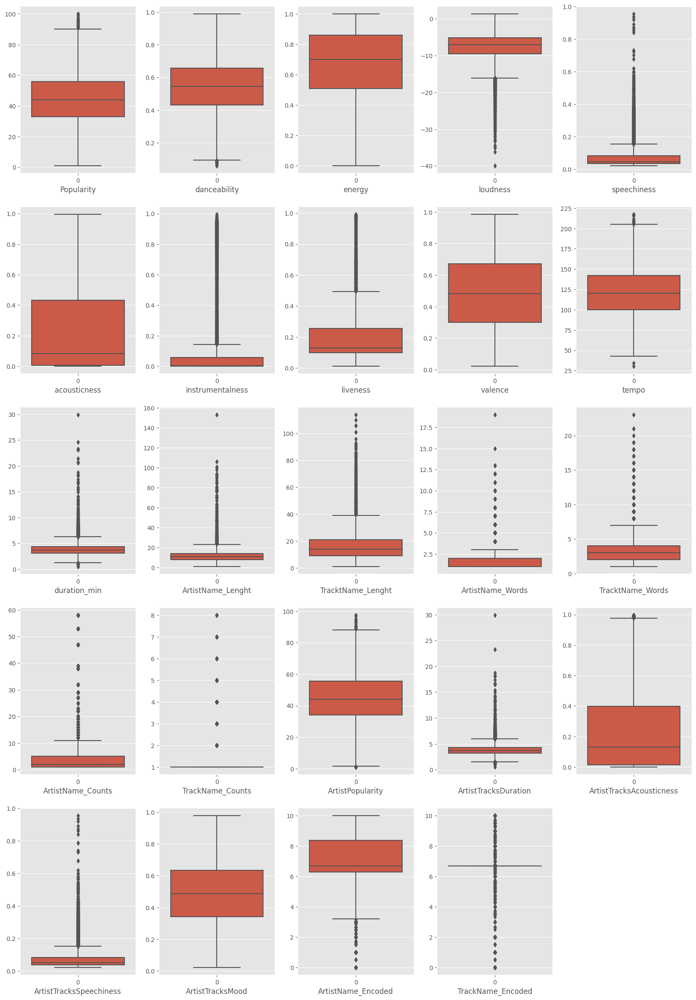

In [ ]:
plt.figure(figsize=(20,35))

for i, col in enumerate(numFeatures):

        ax = plt.subplot(6, 5, i+1)

        sns.boxplot(df[col] , ax=ax)

        plt.xlabel(col)

plt.show()

In [ ]:
kurtosisDF = pd.DataFrame(df[numFeatures].kurt().T , columns=["Kurtosis"]).sort_values(by = 'Kurtosis', ascending=False)
kurtosisDF.style.background_gradient(cmap='YlOrRd',axis=0)

,Kurtosis
ArtistName_Lenght,36.914306
duration_min,35.828294
ArtistTracksDuration,35.313575
ArtistName_Counts,20.560086
ArtistName_Words,18.815954
ArtistTracksSpeechiness,15.006160
speechiness,12.870291
TrackName_Counts,12.788489
TracktName_Words,7.265428
TracktName_Lenght,6.866312


- **We may want to look at outliers in the `['loudness','speechiness','liveness','duration_in min/ms','ArtistName_Lenght','TracktName_Lenght'	'ArtistName_Words','TracktName_Words']` features by removing or imputing them.**


## **Multivariate Analysis**


In [ ]:
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder

encoder = OrdinalEncoder(unknown_value=-1, handle_unknown='use_encoded_value')

df_encoded = train_df.copy()

df_encoded[['Relevancy','mood','type']] = encoder.fit_transform(df[['Relevancy','mood','type']])

df_encoded

,Popularity,danceability,energy,key,loudness,modality,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_min,time_signature,Class,Relevancy,type,mood,instrumental,live,ArtistName_Lenght,TracktName_Lenght,ArtistName_Words,TracktName_Words,ArtistName_Counts,TrackName_Counts,ArtistPopularity,ArtistTracksDuration,ArtistTracksAcousticness,ArtistTracksSpeechiness,ArtistTracksMood,ArtistName_Encoded,TrackName_Encoded
0,37.0,0.334,0.536,9.0,-6.649,0,0.0381,0.378000,0.003920,0.1060,0.235,152.429,3.415783,4,9,0.0,1.0,2.0,0,0,17,10,2,2,6,1,28.5,3.639794,0.257300,0.037917,0.243333,9.000000,6.695679
1,67.0,0.725,0.747,11.0,-5.545,1,0.0876,0.027200,0.046800,0.1040,0.380,132.921,3.199267,4,6,1.0,1.0,1.0,0,0,14,15,3,3,18,2,60.0,3.685893,0.126128,0.048917,0.541167,5.823529,1.000000
2,44.0,0.584,0.804,7.0,-6.094,1,0.0619,0.000968,0.635000,0.2840,0.635,159.953,2.683950,4,10,0.0,1.0,1.0,1,0,19,7,4,2,2,1,59.5,2.669417,0.154484,0.183450,0.545500,9.000000,6.695679
3,12.0,0.515,0.308,6.0,-14.711,1,0.0312,0.907000,0.021300,0.3000,0.501,172.472,4.968217,3,2,3.0,1.0,1.0,0,0,18,11,3,2,1,1,12.0,4.968217,0.907000,0.031200,0.501000,6.695679,6.695679
4,48.0,0.565,0.777,6.0,-5.096,0,0.2490,0.183000,0.003920,0.2110,0.619,88.311,4.235750,4,5,0.0,1.0,1.0,0,0,12,7,2,2,2,1,37.5,3.234042,0.153000,0.324500,0.678500,5.000000,6.695679
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14391,47.0,0.607,0.946,1.0,-2.965,1,0.1500,0.005480,0.000390,0.2780,0.653,120.011,3.253017,4,10,0.0,1.0,1.0,0,0,5,17,1,5,2,1,47.0,3.236525,0.002877,0.192000,0.605000,10.000000,6.695679
14392,27.0,0.435,0.951,8.0,-7.475,1,0.0576,0.000005,0.550000,0.0952,0.203,135.034,4.700717,4,8,0.0,1.0,2.0,1,0,9,35,1,5,1,1,27.0,4.700717,0.000005,0.057600,0.203000,6.695679,6.695679
14393,22.0,0.415,0.941,11.0,-4.300,1,0.0524,0.001810,0.000004,0.3370,0.572,167.978,2.942150,4,10,3.0,1.0,1.0,0,0,10,12,2,3,1,1,22.0,2.942150,0.001810,0.052400,0.572000,6.695679,6.695679
14394,37.0,0.493,0.986,1.0,-2.279,1,0.0917,0.000967,0.006620,0.1230,0.567,122.036,3.105117,4,10,0.0,1.0,1.0,0,0,21,23,4,5,1,1,37.0,3.105117,0.000967,0.091700,0.567000,6.695679,6.695679


In [ ]:
from sklearn.preprocessing import OneHotEncoder

encoder = OneHotEncoder(sparse_output=False)

df_ohe = pd.DataFrame(encoder.fit_transform(df[['key','time_signature','Relevancy','mood','type']]), columns = encoder.get_feature_names_out())

df_ohe

,key_1.0,key_2.0,key_3.0,key_4.0,key_5.0,key_6.0,key_7.0,key_8.0,key_9.0,key_10.0,key_11.0,time_signature_1,time_signature_3,time_signature_4,time_signature_5,Relevancy_Comman,Relevancy_Popular,Relevancy_Trendy,Relevancy_Uncomman,mood_Happy,mood_Normal,mood_Sad,type_Mix,type_Music,type_Speech
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
3,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0
4,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14391,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
14392,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
14393,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0
14394,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


**Now Let's look at the Correlation of the Features**


<Axes: >

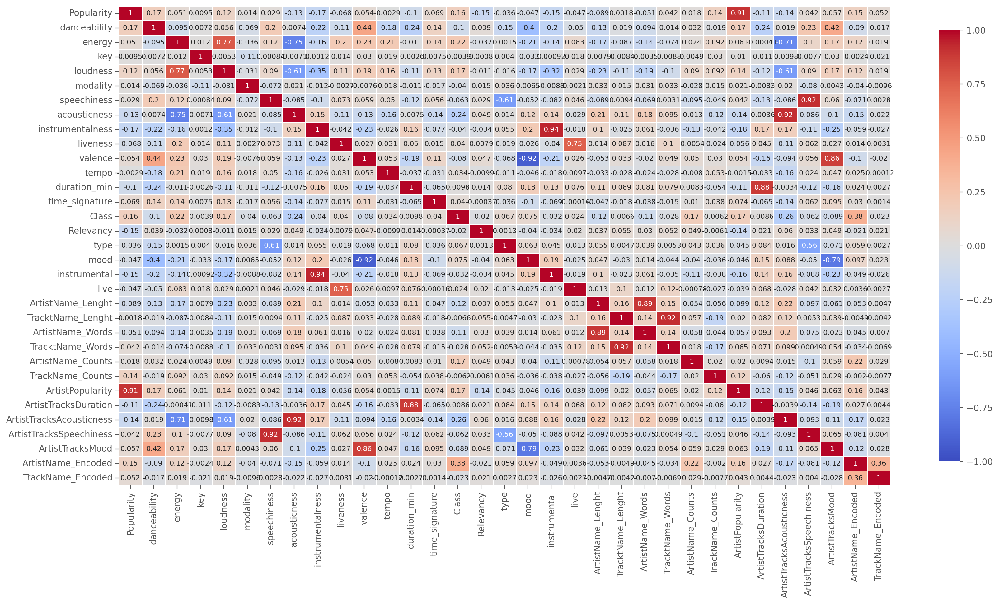

In [ ]:
plt.figure(figsize=(20, 10), dpi= 200)
sns.heatmap( df_encoded.corr(numeric_only=True), annot=True, cmap = sns.color_palette("coolwarm", as_cmap=True),
           linewidths= 1, vmin=-1, vmax=1, cbar_kws={"shrink": .9}, annot_kws={"size":8})

<Axes: >

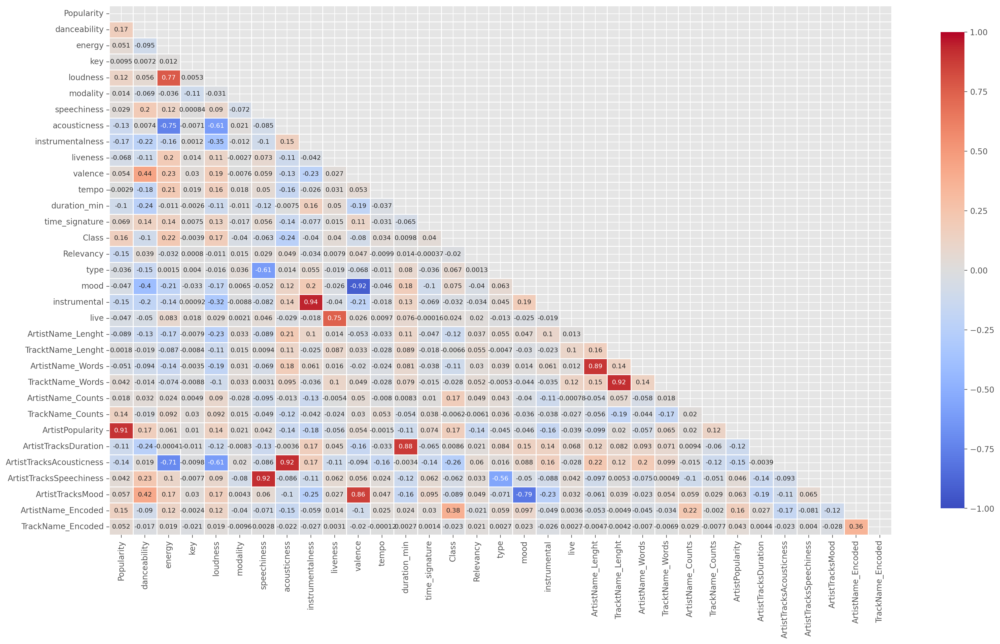

In [ ]:
plt.figure(figsize=(22, 12), dpi= 200)
mask = np.triu(np.ones_like(df_encoded.corr(numeric_only=True), dtype=bool))
sns.heatmap( df_encoded.corr(numeric_only=True), annot=True, mask=mask ,cmap = sns.color_palette("coolwarm", as_cmap=True),
           linewidths= 1, vmin=-1, vmax=1, cbar_kws={"shrink": .9}, annot_kws={"size":8})

- **We can see that our class target feature has no strong correlation to our features except for low postive correlation for `['Artist Name','energy','duration']` and low negative one to `'acousticness'`.**


- **Also `'acousticness'` feature have negative correlation to most features but a strong negative one with `['energy', 'loudness']`.**

- **This is expected as `['energy', 'loudness']` seems to be very correlated to each other and have nealry the same correlation values to most features.**

- **Our new binned features `['live','instrumental']` sure will have very strong correlation to their orginal ones. However `['mode','type']` have strong negative relation to their original features.**

- **Also our Artist Derived Insights of course will have strong correlation to their original features.**


> **We could consider removing the `'loudness'` feature since it is already captured by the "energy" feature.**

> **It may also be beneficial to exclude `'acousticness'` due to its negative correlation with most features.**

In [ ]:
full_ohe_df = pd.concat([df_encoded.drop(columns=['key','time_signature','Relevancy','mood','type']), df_ohe], axis=1)

<Axes: >

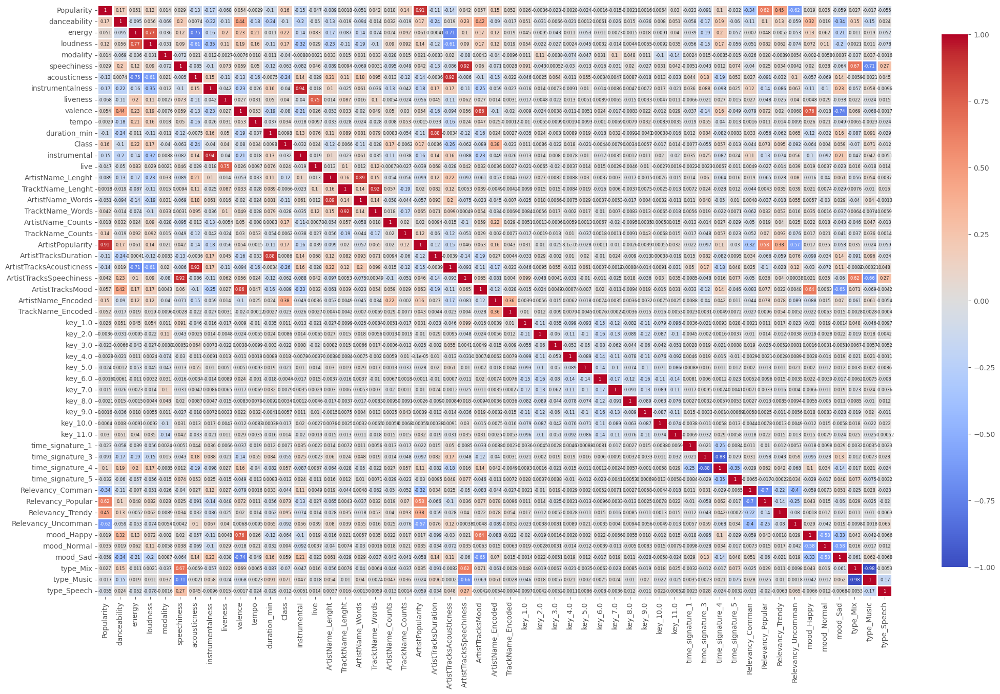

In [ ]:
plt.figure(figsize=(25, 15), dpi= 100)
sns.heatmap( full_ohe_df.corr(numeric_only=True), annot=True, cmap = sns.color_palette("coolwarm", as_cmap=True),
           linewidths= 1, vmin=-1, vmax=1, cbar_kws={"shrink": .9}, annot_kws={"size":6})

- **One Hot Encoded Categories reveal some strong negative and postive relation between categories.**

## **Genre Target Feature Analysis**


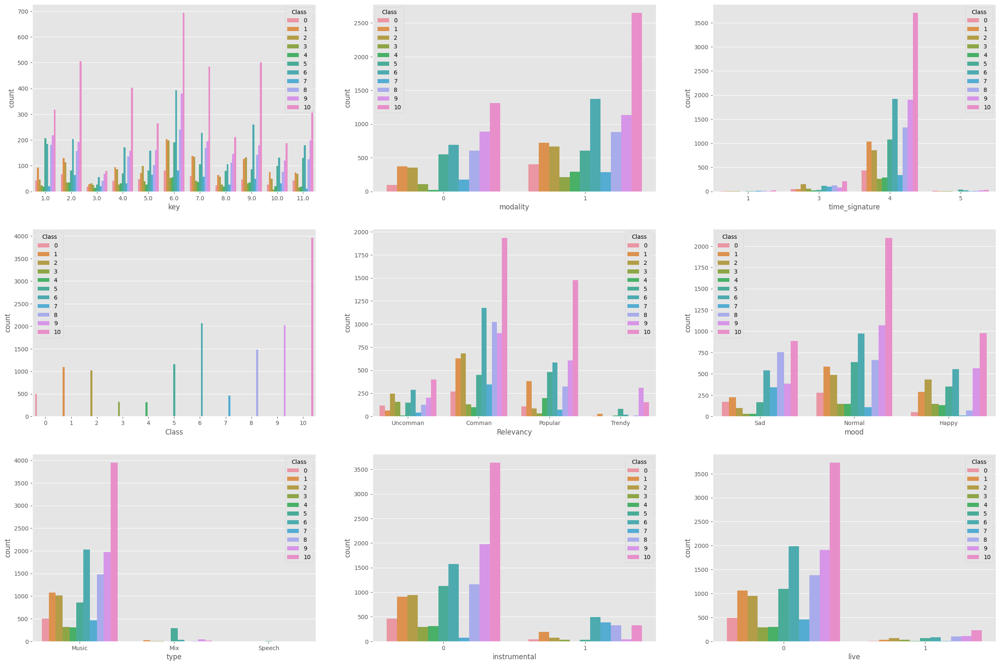

In [ ]:
plt.figure(figsize=(30,20))

for i, col in enumerate(catFeatures):

        ax = plt.subplot(3, 3, i+1)

        sns.countplot(x = df[col] , ax=ax, hue=df['Class'])

        plt.xlabel(col)

plt.show()

- **In most of our categorical features, the 10th class is the most popular genre. However, it is interesting to note that in some categories, the 10th class does not have as many instances as in other categories.**


<Axes: >

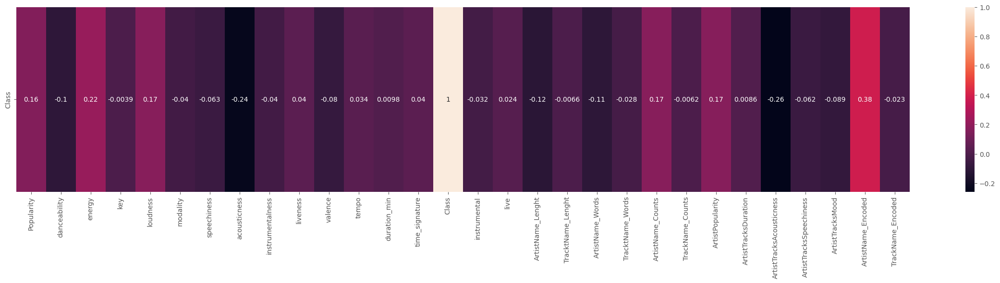

In [ ]:
plt.figure(figsize=(30,5))
sns.heatmap(pd.DataFrame(train_df.corr(numeric_only=True)["Class"]).T, annot=True)

### **MI Scores**


> **Let's calculate MI scores to detect non-linear relationships, Unlike correlation that can only detect linear relationships.**


In [ ]:
from sklearn.feature_selection import mutual_info_regression

X = df_encoded.copy()
y = X.pop("Class")

def make_mi_scores(X, y):
    mi_scores = mutual_info_regression(X, y)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index = X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores

mi_scores = make_mi_scores(X, y)

In [ ]:
MI_Score = pd.DataFrame(mi_scores)
MI_Score.style.background_gradient(cmap='YlOrRd',axis=0)

,MI Scores
ArtistTracksAcousticness,0.619745
ArtistName_Encoded,0.596575
ArtistTracksSpeechiness,0.505461
ArtistTracksMood,0.442966
ArtistTracksDuration,0.442937
ArtistPopularity,0.394125
acousticness,0.285307
energy,0.219605
instrumentalness,0.166267
speechiness,0.156151


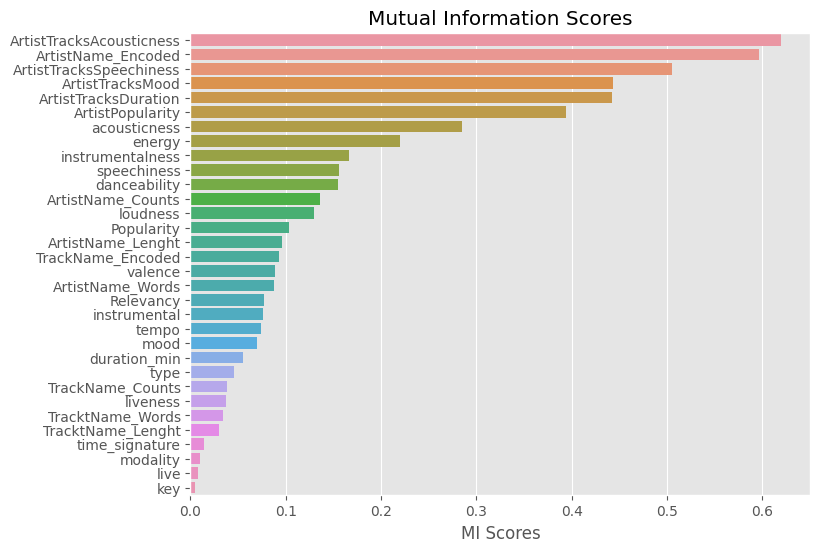

In [ ]:
def plot_mi_scores(scores):
    scores = scores.sort_values(ascending=False)
    sns.barplot(x = scores, y = scores.index)
    plt.title("Mutual Information Scores")


plt.figure(dpi=100, figsize=(8, 6))
plot_mi_scores(mi_scores)

- **Seems our Artists Derived Inisghts and `'Artist Name'` have some strong nonlinear relation to our target feature**

- **Interstengily `'acousticness'` is useful after all having also a strong non linear relation to our target feature.**

# **Data Preprocessing**


## **Removing Outliers**


In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Popularity,14396.0,44.513059,17.216466,1.000000e+00,33.000000,44.000000,56.000000,100.000
danceability,14396.0,0.543105,0.165517,5.960000e-02,0.432000,0.545000,0.658000,0.989
energy,14396.0,0.662422,0.235967,1.210000e-03,0.508000,0.699000,0.861000,1.000
key,14396.0,5.958947,3.015909,1.000000e+00,4.000000,6.000000,8.000000,11.000
loudness,14396.0,-7.900852,4.057362,-3.995200e+01,-9.538000,-7.013500,-5.162000,1.342
modality,14396.0,0.640247,0.479944,0.000000e+00,0.000000,1.000000,1.000000,1.000
speechiness,14396.0,0.080181,0.085157,2.250000e-02,0.034800,0.047100,0.083100,0.955
acousticness,14396.0,0.246746,0.310922,0.000000e+00,0.004280,0.081450,0.432250,0.996
instrumentalness,14396.0,0.135278,0.274652,1.000000e-06,0.000295,0.003920,0.057600,0.996
liveness,14396.0,0.195782,0.159258,1.190000e-02,0.097275,0.129000,0.256000,0.992


- **We will rely on kurtosis to detect our outliers.**

In [ ]:
kurtosisDF

,Kurtosis
ArtistName_Lenght,36.914306
duration_min,35.828294
ArtistTracksDuration,35.313575
ArtistName_Counts,20.560086
ArtistName_Words,18.815954
ArtistTracksSpeechiness,15.006160
speechiness,12.870291
TrackName_Counts,12.788489
TracktName_Words,7.265428
TracktName_Lenght,6.866312


- **Any Feature that has Positive Kurtosis(over 3) will try to remove it's outliers.**

In [ ]:
outliers_cols = kurtosisDF[kurtosisDF['Kurtosis'] > 3].index.to_list()
outliers_cols

['ArtistName_Lenght',
 'duration_min',
 'ArtistTracksDuration',
 'ArtistName_Counts',
 'ArtistName_Words',
 'ArtistTracksSpeechiness',
 'speechiness',
 'TrackName_Counts',
 'TracktName_Words',
 'TracktName_Lenght',
 'TrackName_Encoded',
 'liveness',
 'loudness']

- **Removing Outliers with Percentiles**

In [ ]:
clean_df = df_encoded.copy()


for col in clean_df[outliers_cols]:
  low, high = clean_df[col].quantile([0.01, 0.99])
  mask = clean_df[col].between(low, high)
  clean_df = clean_df[mask]

clean_df.describe().T

,count,mean,std,min,25%,50%,75%,max
Popularity,11990.0,44.862302,17.067547,1.000000e+00,34.000000,44.000000,56.000000,100.000000
danceability,11990.0,0.545042,0.160878,5.990000e-02,0.436000,0.545000,0.657000,0.982000
energy,11990.0,0.673576,0.226493,1.920000e-02,0.521000,0.709000,0.864000,1.000000
key,11990.0,5.952961,3.013046,1.000000e+00,4.000000,6.000000,8.000000,11.000000
loudness,11990.0,-7.626242,3.450803,-2.108200e+01,-9.327750,-6.894000,-5.116000,-2.145000
modality,11990.0,0.638449,0.480470,0.000000e+00,0.000000,1.000000,1.000000,1.000000
speechiness,11990.0,0.072774,0.064429,2.600000e-02,0.034900,0.046900,0.079475,0.365000
acousticness,11990.0,0.234776,0.303288,0.000000e+00,0.003242,0.070250,0.404000,0.996000
instrumentalness,11990.0,0.125167,0.263544,1.000000e-06,0.000239,0.003920,0.047000,0.996000
liveness,11990.0,0.187929,0.136124,3.950000e-02,0.097425,0.129000,0.252000,0.819000


In [ ]:
clean_df

,Popularity,danceability,energy,key,loudness,modality,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_min,time_signature,Class,Relevancy,type,mood,instrumental,live,ArtistName_Lenght,TracktName_Lenght,ArtistName_Words,TracktName_Words,ArtistName_Counts,TrackName_Counts,ArtistPopularity,ArtistTracksDuration,ArtistTracksAcousticness,ArtistTracksSpeechiness,ArtistTracksMood,ArtistName_Encoded,TrackName_Encoded
0,37.0,0.334,0.536,9.0,-6.649,0,0.0381,0.378000,0.003920,0.1060,0.235,152.429,3.415783,4,9,0.0,1.0,2.0,0,0,17,10,2,2,6,1,28.5,3.639794,0.257300,0.037917,0.243333,9.000000,6.695679
1,67.0,0.725,0.747,11.0,-5.545,1,0.0876,0.027200,0.046800,0.1040,0.380,132.921,3.199267,4,6,1.0,1.0,1.0,0,0,14,15,3,3,18,2,60.0,3.685893,0.126128,0.048917,0.541167,5.823529,1.000000
2,44.0,0.584,0.804,7.0,-6.094,1,0.0619,0.000968,0.635000,0.2840,0.635,159.953,2.683950,4,10,0.0,1.0,1.0,1,0,19,7,4,2,2,1,59.5,2.669417,0.154484,0.183450,0.545500,9.000000,6.695679
3,12.0,0.515,0.308,6.0,-14.711,1,0.0312,0.907000,0.021300,0.3000,0.501,172.472,4.968217,3,2,3.0,1.0,1.0,0,0,18,11,3,2,1,1,12.0,4.968217,0.907000,0.031200,0.501000,6.695679,6.695679
4,48.0,0.565,0.777,6.0,-5.096,0,0.2490,0.183000,0.003920,0.2110,0.619,88.311,4.235750,4,5,0.0,1.0,1.0,0,0,12,7,2,2,2,1,37.5,3.234042,0.153000,0.324500,0.678500,5.000000,6.695679
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14391,47.0,0.607,0.946,1.0,-2.965,1,0.1500,0.005480,0.000390,0.2780,0.653,120.011,3.253017,4,10,0.0,1.0,1.0,0,0,5,17,1,5,2,1,47.0,3.236525,0.002877,0.192000,0.605000,10.000000,6.695679
14392,27.0,0.435,0.951,8.0,-7.475,1,0.0576,0.000005,0.550000,0.0952,0.203,135.034,4.700717,4,8,0.0,1.0,2.0,1,0,9,35,1,5,1,1,27.0,4.700717,0.000005,0.057600,0.203000,6.695679,6.695679
14393,22.0,0.415,0.941,11.0,-4.300,1,0.0524,0.001810,0.000004,0.3370,0.572,167.978,2.942150,4,10,3.0,1.0,1.0,0,0,10,12,2,3,1,1,22.0,2.942150,0.001810,0.052400,0.572000,6.695679,6.695679
14394,37.0,0.493,0.986,1.0,-2.279,1,0.0917,0.000967,0.006620,0.1230,0.567,122.036,3.105117,4,10,0.0,1.0,1.0,0,0,21,23,4,5,1,1,37.0,3.105117,0.000967,0.091700,0.567000,6.695679,6.695679


- **Removing Outliers with standard deviation**

In [ ]:
clean_df = df_encoded.copy()


for col in clean_df[outliers_cols]:
  mean, std = df[col].mean(), df[col].std()
  cut_off = std * 3
  low, high = mean - cut_off, mean + cut_off
  mask = clean_df[col].between(low, high)
  clean_df = clean_df[mask]

clean_df.describe().T

,count,mean,std,min,25%,50%,75%,max
Popularity,11470.0,44.890148,17.163185,1.000000e+00,33.000000,44.000000,56.000000,100.000000
danceability,11470.0,0.544232,0.161390,5.990000e-02,0.436000,0.545000,0.654000,0.989000
energy,11470.0,0.674500,0.226387,1.710000e-02,0.518000,0.708000,0.866000,1.000000
key,11470.0,5.931648,3.005683,1.000000e+00,4.000000,6.000000,8.000000,11.000000
loudness,11470.0,-7.564389,3.417220,-2.006600e+01,-9.304000,-6.896000,-5.084000,1.342000
modality,11470.0,0.646120,0.478193,0.000000e+00,0.000000,1.000000,1.000000,1.000000
speechiness,11470.0,0.069811,0.058007,2.250000e-02,0.034500,0.046500,0.078700,0.335000
acousticness,11470.0,0.232327,0.302036,0.000000e+00,0.003120,0.067600,0.396750,0.996000
instrumentalness,11470.0,0.128102,0.265865,1.000000e-06,0.000246,0.003920,0.050850,0.996000
liveness,11470.0,0.180021,0.123120,1.190000e-02,0.096200,0.127000,0.242000,0.673000


In [ ]:
clean_df.reset_index(inplace=True, drop=True)

clean_df

,Popularity,danceability,energy,key,loudness,modality,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_min,time_signature,Class,Relevancy,type,mood,instrumental,live,ArtistName_Lenght,TracktName_Lenght,ArtistName_Words,TracktName_Words,ArtistName_Counts,TrackName_Counts,ArtistPopularity,ArtistTracksDuration,ArtistTracksAcousticness,ArtistTracksSpeechiness,ArtistTracksMood,ArtistName_Encoded,TrackName_Encoded
0,37.0,0.334,0.536,9.0,-6.649,0,0.0381,0.378000,0.003920,0.1060,0.2350,152.429,3.415783,4,9,0.0,1.0,2.0,0,0,17,10,2,2,6,1,28.500000,3.639794,0.257300,0.037917,0.243333,9.000000,6.695679
1,44.0,0.584,0.804,7.0,-6.094,1,0.0619,0.000968,0.635000,0.2840,0.6350,159.953,2.683950,4,10,0.0,1.0,1.0,1,0,19,7,4,2,2,1,59.500000,2.669417,0.154484,0.183450,0.545500,9.000000,6.695679
2,12.0,0.515,0.308,6.0,-14.711,1,0.0312,0.907000,0.021300,0.3000,0.5010,172.472,4.968217,3,2,3.0,1.0,1.0,0,0,18,11,3,2,1,1,12.000000,4.968217,0.907000,0.031200,0.501000,6.695679,6.695679
3,38.0,0.657,0.813,7.0,-7.861,1,0.2160,0.008340,0.049200,0.2080,0.5890,82.035,3.659783,4,10,0.0,1.0,1.0,0,0,4,39,1,7,12,1,50.583333,3.939354,0.102679,0.083075,0.630583,7.181818,6.695679
4,45.0,0.441,0.994,7.0,-2.934,1,0.2390,0.000073,0.000147,0.3820,0.0478,139.931,3.552083,4,8,0.0,1.0,2.0,0,0,16,11,3,3,2,1,42.500000,4.075000,0.000082,0.227500,0.070700,8.000000,6.695679
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11465,47.0,0.607,0.946,1.0,-2.965,1,0.1500,0.005480,0.000390,0.2780,0.6530,120.011,3.253017,4,10,0.0,1.0,1.0,0,0,5,17,1,5,2,1,47.000000,3.236525,0.002877,0.192000,0.605000,10.000000,6.695679
11466,27.0,0.435,0.951,8.0,-7.475,1,0.0576,0.000005,0.550000,0.0952,0.2030,135.034,4.700717,4,8,0.0,1.0,2.0,1,0,9,35,1,5,1,1,27.000000,4.700717,0.000005,0.057600,0.203000,6.695679,6.695679
11467,22.0,0.415,0.941,11.0,-4.300,1,0.0524,0.001810,0.000004,0.3370,0.5720,167.978,2.942150,4,10,3.0,1.0,1.0,0,0,10,12,2,3,1,1,22.000000,2.942150,0.001810,0.052400,0.572000,6.695679,6.695679
11468,37.0,0.493,0.986,1.0,-2.279,1,0.0917,0.000967,0.006620,0.1230,0.5670,122.036,3.105117,4,10,0.0,1.0,1.0,0,0,21,23,4,5,1,1,37.000000,3.105117,0.000967,0.091700,0.567000,6.695679,6.695679


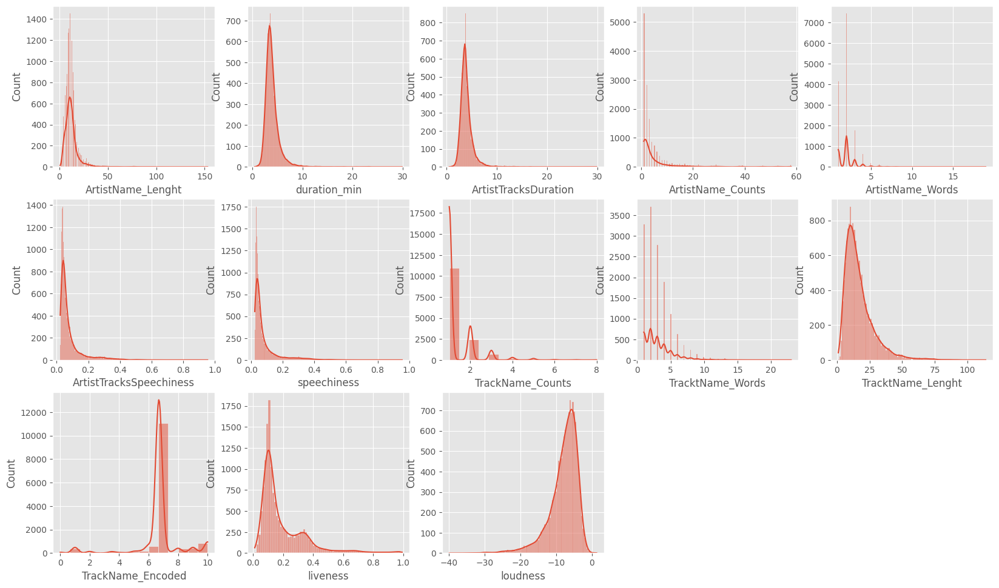

In [ ]:
plt.figure(figsize=(20,20))

for i, col in enumerate(df[outliers_cols].columns):

        ax = plt.subplot(5, 5, i+1)

        sns.histplot(df[col] , ax=ax , kde=True)

        plt.xlabel(col)

plt.show()

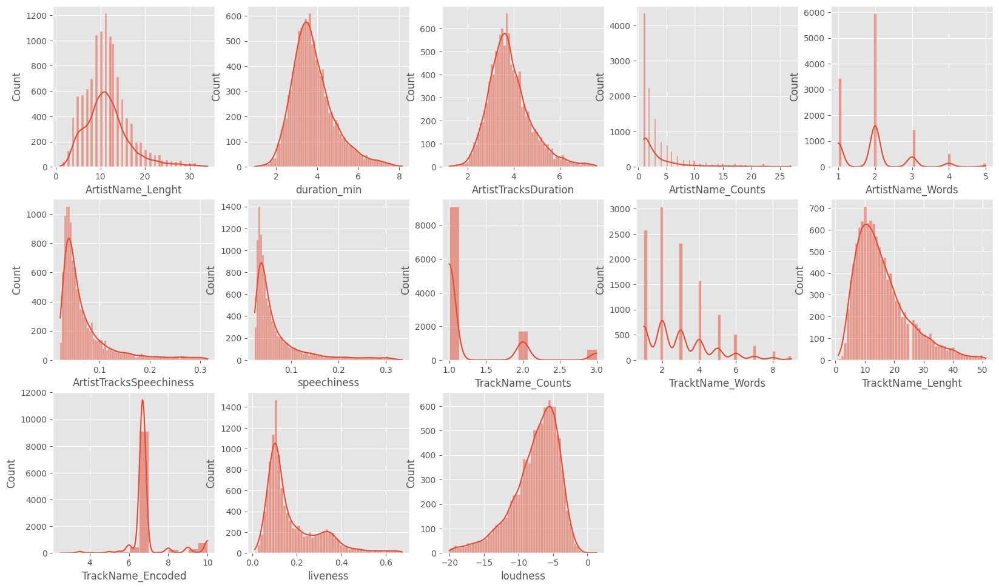

In [ ]:
plt.figure(figsize=(20,20))

for i, col in enumerate(outliers_cols):

        ax = plt.subplot(5, 5, i+1)

        sns.histplot(clean_df[col] , ax=ax, kde=True)

        plt.xlabel(col)

plt.show()

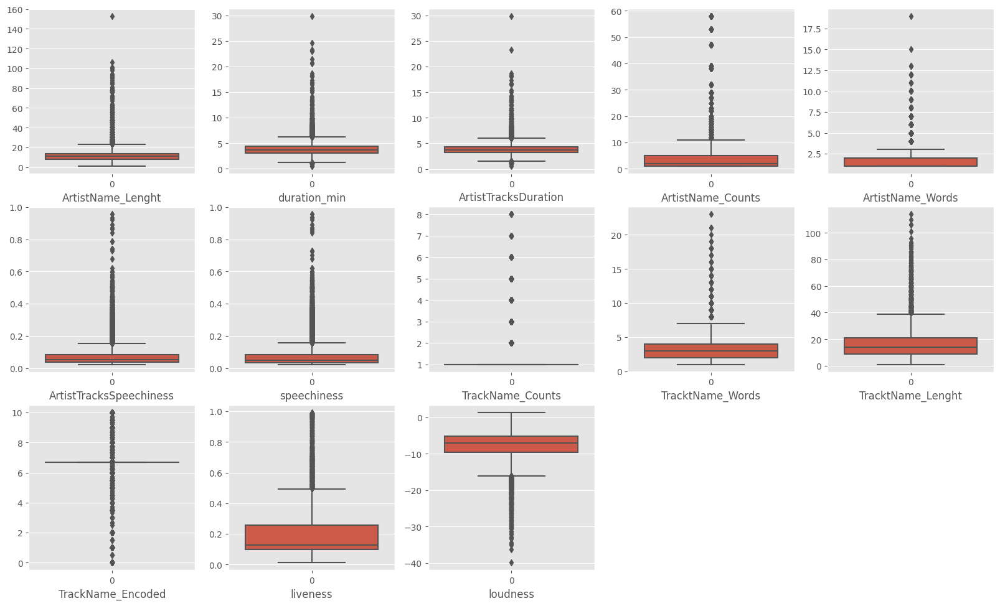

In [ ]:
fig = plt.figure(figsize=(20,20))

for i, col in enumerate(df[outliers_cols].columns):

        ax = plt.subplot(5, 5, i+1)

        sns.boxplot(df[col] , ax=ax)

        plt.xlabel(col)

plt.show()

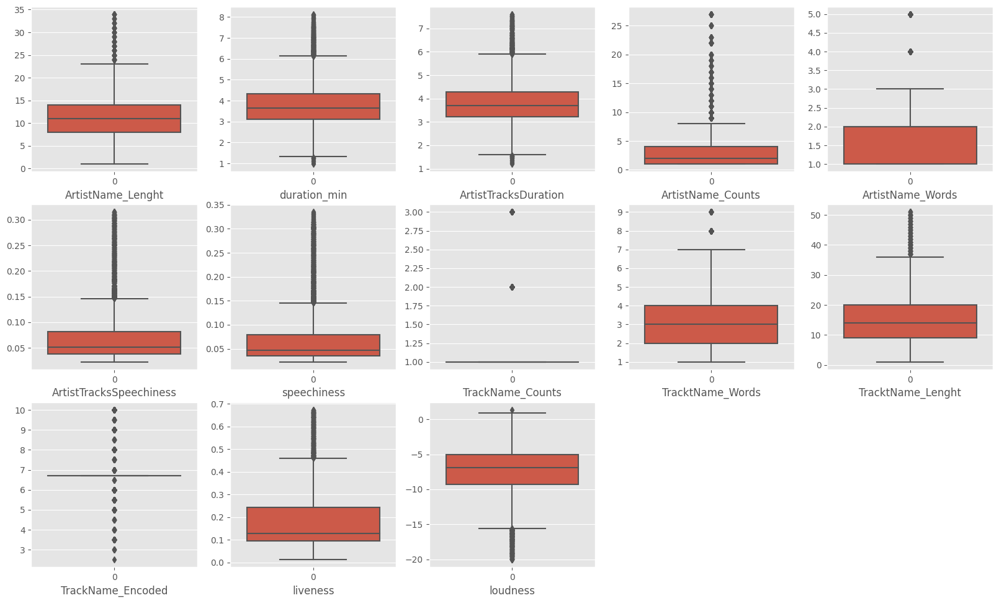

In [ ]:
plt.figure(figsize=(20,20))

for i, col in enumerate(outliers_cols):

        ax = plt.subplot(5, 5, i+1)

        sns.boxplot(clean_df[col] , ax=ax)

        plt.xlabel(col)

plt.show()

In [ ]:
outliersAnalysisDF = pd.DataFrame({"Kurtosis": df[outliers_cols].kurt().T, "Skewness": df[outliers_cols].skew(numeric_only=True).T}).sort_values(by = 'Kurtosis', ascending=False)
outliersAnalysisDF.style.background_gradient(cmap='YlOrRd',axis=0)

,Kurtosis,Skewness
ArtistName_Lenght,36.914306,4.283387
duration_min,35.828294,3.804277
ArtistTracksDuration,35.313575,3.593977
ArtistName_Counts,20.560086,4.117574
ArtistName_Words,18.815954,2.981902
ArtistTracksSpeechiness,15.006160,3.259279
speechiness,12.870291,3.113395
TrackName_Counts,12.788489,3.057660
TracktName_Words,7.265428,2.073060
TracktName_Lenght,6.866312,2.080190


In [ ]:
outliersAnalysisDF = pd.DataFrame({"Kurtosis": clean_df[outliers_cols].kurt().T, "Skewness": clean_df[outliers_cols].skew(numeric_only=True).T}).sort_values(by = 'Kurtosis', ascending=False)
outliersAnalysisDF.style.background_gradient(cmap='YlOrRd',axis=0)

,Kurtosis,Skewness
ArtistName_Counts,6.933583,2.537968
ArtistTracksSpeechiness,5.223302,2.263806
speechiness,4.999708,2.258004
TrackName_Encoded,4.270028,1.508481
TrackName_Counts,3.006811,2.015220
ArtistName_Lenght,2.062650,1.088146
liveness,1.864244,1.466381
ArtistName_Words,1.404742,1.019390
ArtistTracksDuration,1.307032,0.872747
duration_min,1.223732,0.931608


- **We can clearly notice the changes in outliers for most features, along with noticable decrease in skewness on most features**

- **But not that much of a change in Counts Features and Spechiness.**


## **Applying Log Transformation**


In [ ]:
skewnessDF.style.background_gradient(cmap='YlOrRd',axis=0)

,Skewness
ArtistName_Lenght,4.283387
ArtistName_Counts,4.117574
duration_min,3.804277
ArtistTracksDuration,3.593977
ArtistTracksSpeechiness,3.259279
speechiness,3.113395
TrackName_Counts,3.057660
ArtistName_Words,2.981902
liveness,2.178265
TracktName_Lenght,2.080190


In [ ]:
skewedFeatures = skewnessDF[(skewnessDF['Skewness'] > 1) | (skewnessDF['Skewness'] < -1) ].index.to_list()

skewedFeatures

['ArtistName_Lenght',
 'ArtistName_Counts',
 'duration_min',
 'ArtistTracksDuration',
 'ArtistTracksSpeechiness',
 'speechiness',
 'TrackName_Counts',
 'ArtistName_Words',
 'liveness',
 'TracktName_Lenght',
 'TracktName_Words',
 'instrumentalness',
 'ArtistTracksAcousticness',
 'acousticness',
 'TrackName_Encoded',
 'loudness']

In [ ]:
trans_df = df_encoded.drop(columns='Class').copy()

In [ ]:
from sklearn.preprocessing import PowerTransformer

transformer = PowerTransformer()

trans_df[skewedFeatures] = transformer.fit_transform(trans_df[skewedFeatures])

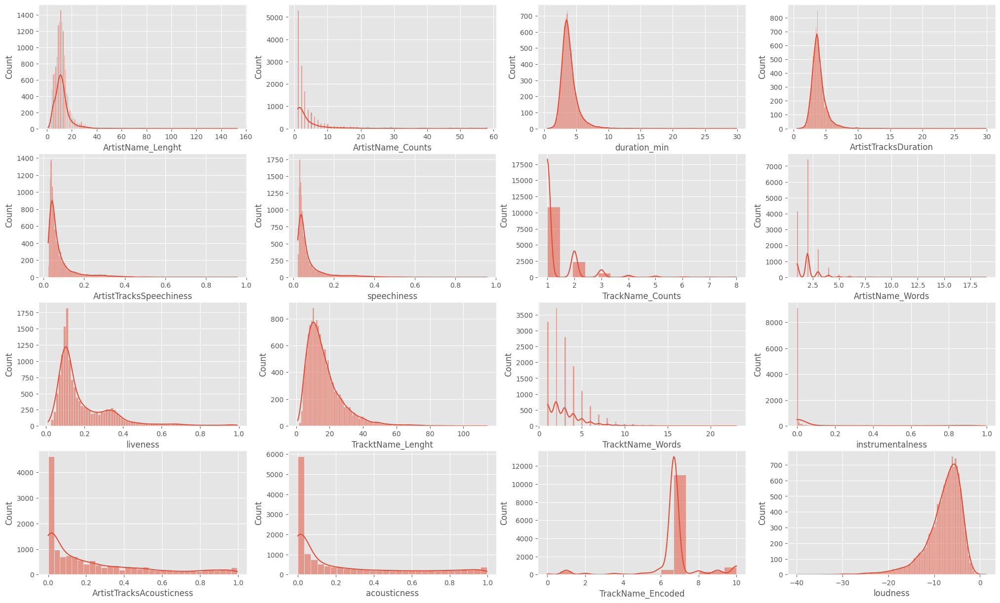

In [ ]:
plt.figure(figsize=(25,15))

for i, col in enumerate(skewedFeatures):

        ax = plt.subplot(4, 4, i+1)

        sns.histplot(df_encoded[col] , ax=ax , kde=True)

        plt.xlabel(col)

plt.show()

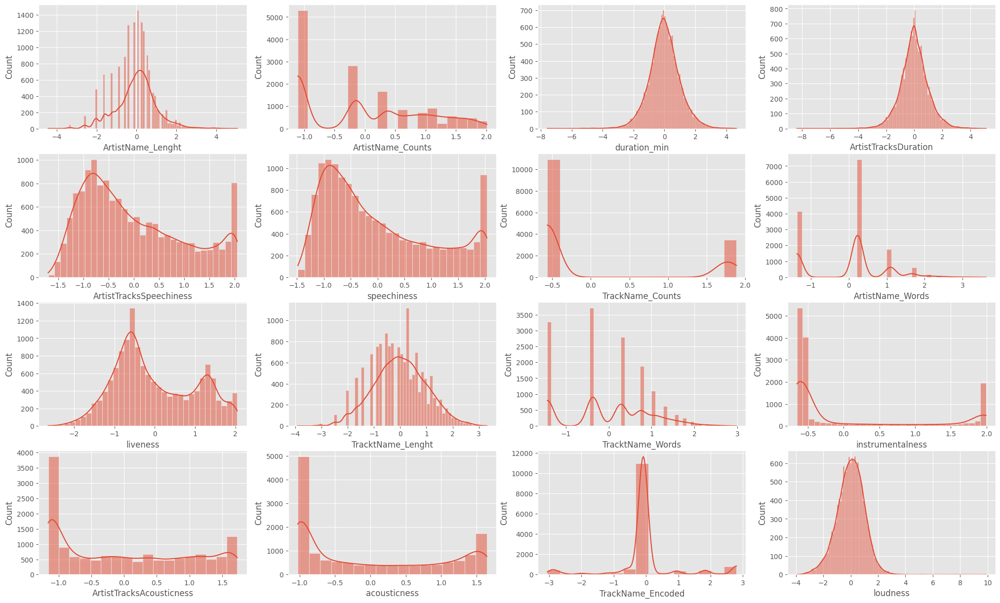

In [ ]:
plt.figure(figsize=(25,15))

for i, col in enumerate(trans_df[skewedFeatures]):

        ax = plt.subplot(4, 4, i+1)

        sns.histplot(trans_df[col] , ax=ax , kde=True)

        plt.xlabel(col)

plt.show()

In [ ]:
skewnessDF = pd.DataFrame(df[skewedFeatures].skew(numeric_only=True).T , columns=["Skewness"]).sort_values(by = 'Skewness', ascending=False)
skewnessDF.style.background_gradient(cmap='YlOrRd',axis=0)

,Skewness
ArtistName_Lenght,4.283387
ArtistName_Counts,4.117574
duration_min,3.804277
ArtistTracksDuration,3.593977
ArtistTracksSpeechiness,3.259279
speechiness,3.113395
TrackName_Counts,3.057660
ArtistName_Words,2.981902
liveness,2.178265
TracktName_Lenght,2.080190


In [ ]:
skewnessDF = pd.DataFrame(trans_df[skewedFeatures].skew(numeric_only=True).T , columns=["Skewness"]).sort_values(by = 'Skewness', ascending=False)
skewnessDF.style.background_gradient(cmap='YlOrRd',axis=0)

,Skewness
instrumentalness,1.240299
TrackName_Counts,1.215632
speechiness,0.667479
ArtistTracksSpeechiness,0.591780
acousticness,0.430075
TrackName_Encoded,0.408417
liveness,0.324864
ArtistTracksAcousticness,0.315785
ArtistName_Counts,0.289350
TracktName_Words,0.048472


- **Interestingly `PowerTrasformer` eliminates most of the skewness in our features, however it is still there but with a lower effect on `instrumentalness` and `TrackName_Counts`.**


In [ ]:
trans_df

,Popularity,danceability,energy,key,loudness,modality,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_min,time_signature,Relevancy,type,mood,instrumental,live,ArtistName_Lenght,TracktName_Lenght,ArtistName_Words,TracktName_Words,ArtistName_Counts,TrackName_Counts,ArtistPopularity,ArtistTracksDuration,ArtistTracksAcousticness,ArtistTracksSpeechiness,ArtistTracksMood,ArtistName_Encoded,TrackName_Encoded
0,37.0,0.334,0.536,9.0,0.153284,0,-0.679070,0.919296,-0.567567,-0.598627,0.235,152.429,-0.263772,4,0.0,1.0,2.0,0,0,0.932664,-0.559645,0.229332,-0.368407,1.057431,-0.562973,28.5,-0.092599,0.477200,-0.832318,0.243333,9.000000,-0.085451
1,67.0,0.725,0.747,11.0,0.523145,1,0.815997,-0.771990,0.204458,-0.629790,0.380,132.921,-0.498181,4,1.0,1.0,1.0,0,0,0.535092,0.111716,1.100419,0.284423,1.709194,1.734902,60.0,-0.043849,-0.172684,-0.346076,0.541167,5.823529,-2.878464
2,44.0,0.584,0.804,7.0,0.332191,1,0.196506,-1.015382,1.962213,1.055408,0.635,159.953,-1.147847,4,0.0,1.0,1.0,1,0,1.158785,-1.147710,1.656779,-0.368407,-0.143613,-0.562973,59.5,-1.354068,-0.006856,1.765134,0.545500,9.000000,-0.085451
3,12.0,0.515,0.308,6.0,-1.572682,1,-1.008607,1.595372,-0.217108,1.134827,0.501,172.472,0.983818,3,3.0,1.0,1.0,0,0,1.049030,-0.401783,1.100419,-0.368407,-1.105931,-0.562973,12.0,1.049895,1.667184,-1.179535,0.501000,6.695679,-0.085451
4,48.0,0.565,0.777,6.0,0.691321,0,1.921908,0.243976,-0.567567,0.583192,0.619,88.311,0.473010,4,0.0,1.0,1.0,0,0,0.217382,-1.147710,0.229332,-0.368407,-0.143613,-0.562973,37.5,-0.560184,-0.015135,2.015812,0.678500,5.000000,-0.085451
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14391,47.0,0.607,0.946,1.0,1.703079,1,1.567607,-0.971553,-0.646066,1.023713,0.653,120.011,-0.438116,4,0.0,1.0,1.0,0,0,-1.588984,0.318270,-1.370148,1.081245,-0.143613,-0.562973,47.0,-0.557092,-1.130247,1.799589,0.605000,10.000000,-0.085451
14392,27.0,0.435,0.951,8.0,-0.090795,1,0.063749,-1.024845,1.939189,-0.771934,0.203,135.034,0.810110,4,0.0,1.0,2.0,1,0,-0.378336,1.491837,-1.370148,1.081245,-1.105931,-0.562973,27.0,0.856482,-1.158377,-0.023590,0.203000,6.695679,-0.085451
14393,22.0,0.415,0.941,11.0,1.021605,1,-0.110480,-1.007138,-0.654821,1.293376,0.572,167.978,-0.804446,4,3.0,1.0,1.0,0,0,-0.159925,-0.257617,0.229332,0.284423,-1.105931,-0.562973,22.0,-0.946487,-1.140661,-0.210779,0.572000,6.695679,-0.085451
14394,37.0,0.493,0.986,1.0,2.146617,1,0.892317,-1.015392,-0.509279,-0.349684,0.567,122.036,-0.606575,4,0.0,1.0,1.0,0,0,1.361080,0.813956,1.656779,1.081245,-1.105931,-0.562973,37.0,-0.725056,-1.148921,0.862121,0.567000,6.695679,-0.085451


## **Scaling Features**


> **Since we have noticable percent of outliers in our features,`RobustScaler` Scale features using statistics that are robust to outliers.**


In [ ]:
from sklearn.preprocessing import RobustScaler

df_scaled = trans_df.copy()

Scaler = RobustScaler()

scaled_data = Scaler.fit_transform(df_scaled)

df_scaled = pd.DataFrame(scaled_data, columns=df_scaled.columns)

df_scaled

,Popularity,danceability,energy,key,loudness,modality,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_min,time_signature,Relevancy,type,mood,instrumental,live,ArtistName_Lenght,TracktName_Lenght,ArtistName_Words,TracktName_Words,ArtistName_Counts,TrackName_Counts,ArtistPopularity,ArtistTracksDuration,ArtistTracksAcousticness,ArtistTracksSpeechiness,ArtistTracksMood,ArtistName_Encoded,TrackName_Encoded
0,-0.304348,-0.933628,-0.461756,0.75,0.086697,-1.0,-0.240195,0.624478,0.000000,-0.202039,-0.658177,0.767233,-0.210593,0.0,0.0,0.0,1.0,0.0,0.0,0.773345,-0.398261,0.000000,-0.589219,0.599349,0.000000,-0.715385,-0.080293,0.319503,-0.376003,-0.836696,1.102923,0.000000
1,1.000000,0.796460,0.135977,1.25,0.376282,0.0,0.719610,-0.210459,0.769268,-0.221095,-0.269437,0.304841,-0.411780,0.0,1.0,0.0,0.0,0.0,0.0,0.429889,0.081529,0.544607,0.000000,0.924595,2.297875,0.738462,-0.037163,-0.011093,-0.056379,0.185615,-0.417439,-2.793013
2,0.000000,0.172566,0.297450,0.25,0.226773,0.0,0.321909,-0.330614,2.520744,0.809393,0.414209,0.945573,-0.969371,0.0,0.0,0.0,0.0,1.0,0.0,0.968688,-0.818524,0.892445,-0.589219,0.000000,0.000000,0.715385,-1.196320,0.073264,1.331389,0.200489,1.102923,0.000000
3,-1.391304,-0.132743,-1.107649,0.00,-1.264658,0.0,-0.451752,0.958237,0.349208,0.857957,0.054960,1.242307,0.860182,-1.0,3.0,0.0,0.0,0.0,0.0,0.873872,-0.285445,0.544607,-0.589219,-0.480220,0.000000,-1.476923,0.930478,0.924848,-0.604240,0.047743,0.000000,0.000000
4,0.173913,0.088496,0.220963,0.00,0.507956,-1.0,1.429585,0.291093,0.000000,0.520636,0.371314,-0.752538,0.421769,0.0,0.0,0.0,0.0,0.0,0.0,0.155425,-0.818524,0.000000,-0.589219,0.000000,0.000000,-0.300000,-0.493967,0.069052,1.496168,0.657011,-0.811607,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14391,0.130435,0.274336,0.699717,-1.25,1.300117,0.0,1.202131,-0.308977,-0.078218,0.790012,0.462466,-0.001161,-0.360227,0.0,0.0,0.0,0.0,0.0,0.0,-1.405064,0.229143,-1.000000,0.719181,0.000000,0.000000,0.138462,-0.491232,-0.498205,1.354038,0.404722,1.581555,0.000000
14392,-0.739130,-0.486726,0.713881,0.50,-0.104406,0.0,0.236681,-0.335286,2.497802,-0.308016,-0.743968,0.354925,0.711093,0.0,0.0,0.0,1.0,1.0,0.0,-0.359206,1.067837,-1.000000,0.719181,-0.480220,0.000000,-0.784615,0.759364,-0.512514,0.155601,-0.975140,0.000000,0.000000
14393,-0.956522,-0.575221,0.685552,1.25,0.766553,0.0,0.124829,-0.326544,-0.086942,0.954910,0.245308,1.135787,-0.674638,0.0,3.0,0.0,0.0,0.0,0.0,-0.170525,-0.182416,0.000000,0.000000,-0.480220,0.000000,-1.015385,-0.835731,-0.503502,0.032555,0.291450,0.000000,0.000000
14394,-0.304348,-0.230088,0.813031,-1.25,1.647388,0.0,0.768607,-0.330619,0.058080,-0.049812,0.231903,0.046837,-0.504811,0.0,0.0,0.0,0.0,0.0,0.0,1.143447,0.583387,0.892445,0.719181,-0.480220,0.000000,-0.323077,-0.639830,-0.507704,0.737809,0.274287,0.000000,0.000000


In [ ]:
df_scaled.describe().T

,count,mean,std,min,25%,50%,75%,max
Popularity,14396.0,0.022307,0.748542,-1.869565,-0.478261,0.000000e+00,0.521739,2.434783
danceability,14396.0,-0.008383,0.732376,-2.147788,-0.500000,0.000000e+00,0.500000,1.964602
energy,14396.0,-0.103621,0.668463,-1.976742,-0.541076,0.000000e+00,0.458924,0.852691
key,14396.0,-0.010263,0.753977,-1.250000,-0.500000,0.000000e+00,0.500000,1.250000
loudness,14396.0,-0.033318,0.782983,-3.099859,-0.511981,0.000000e+00,0.488019,7.706991
modality,14396.0,-0.359753,0.479944,-1.000000,-1.000000,0.000000e+00,0.000000,0.000000
speechiness,14396.0,0.195755,0.642004,-0.757968,-0.338177,0.000000e+00,0.661823,1.502150
acousticness,14396.0,0.170649,0.493687,-0.335311,-0.314691,0.000000e+00,0.685309,0.982417
instrumentalness,14396.0,0.565540,0.996462,-0.087000,-0.080360,0.000000e+00,0.919640,2.553222
liveness,14396.0,0.164018,0.611515,-1.451118,-0.287059,0.000000e+00,0.712941,1.414346


In [ ]:
df_scaled['Class'] = df_encoded['Class']

## **Preproessing Pipeline**


- **We will make a pipelines to make our preprocssing steps and transformations to the training and testing data.**


In [ ]:
org_df

,Artist Name,Track Name,Popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_in min/ms,time_signature,Class
0,Marina Maximilian,Not Afraid,37.0,0.334,0.536,9.0,-6.649,0,0.0381,0.378000,NaN,0.1060,0.235,152.429,204947.000000,4,9
1,The Black Keys,Howlin' for You,67.0,0.725,0.747,11.0,-5.545,1,0.0876,0.027200,0.046800,0.1040,0.380,132.921,191956.000000,4,6
2,Royal & the Serpent,phuck u,NaN,0.584,0.804,7.0,-6.094,1,0.0619,0.000968,0.635000,0.2840,0.635,159.953,161037.000000,4,10
3,Detroit Blues Band,Missing You,12.0,0.515,0.308,NaN,-14.711,1,0.0312,0.907000,0.021300,0.3000,0.501,172.472,298093.000000,3,2
4,Coast Contra,My Lady,48.0,0.565,0.777,6.0,-5.096,0,0.2490,0.183000,NaN,0.2110,0.619,88.311,254145.000000,4,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14391,NOISY,I Wish I Was A...,47.0,0.607,0.946,1.0,-2.965,1,0.1500,0.005480,0.000390,0.2780,0.653,120.011,195181.000000,4,10
14392,BLOODSPOT,Deadline Story (feat. Patrick Boos),27.0,0.435,0.951,8.0,-7.475,1,0.0576,0.000005,0.550000,0.0952,0.203,135.034,282043.000000,4,8
14393,Cold Years,Too Far Gone,22.0,0.415,0.941,11.0,-4.300,1,0.0524,0.001810,0.000004,0.3370,0.572,167.978,176529.000000,4,10
14394,The Jaded Hearts Club,Reach Out I'll Be There,37.0,0.493,0.986,1.0,-2.279,1,0.0917,0.000967,0.006620,0.1230,0.567,122.036,186307.000000,4,10


In [ ]:
skewedFeatures = ['ArtistName_Lenght',
 'duration_ms',
 'ArtistTracksDuration',
 'ArtistTracksSpeechiness',
 'speechiness',
 'ArtistName_Words',
 'liveness',
 'TracktName_Lenght',
 'TracktName_Words',
 'instrumentalness',
 'ArtistTracksAcousticness',
 'acousticness',
 'loudness']

In [ ]:
from sklearn.compose import ColumnTransformer, make_column_transformer
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.preprocessing import OneHotEncoder, RobustScaler, PolynomialFeatures, PowerTransformer

numFeatures = org_df.drop(columns = 'Class').select_dtypes(exclude='object').columns.tolist()
nullImputer = make_column_transformer((SimpleImputer(strategy='median'), numFeatures),
                                              remainder = 'passthrough', verbose_feature_names_out=False
                                      )

targetEncoding_Pipeline = make_pipeline(
                                        # CountEncoder(cols=['ArtistName_Counts','TrackName_Counts']),
                                        LeaveOneOutEncoder(cols=['Artist Name','Track Name'])
                                        )

catCols_transformer = make_column_transformer((OneHotEncoder(sparse_output=False), ['key','time_signature','Relevancy','mood','type']),
                                               (PowerTransformer(copy=False), skewedFeatures),
                                              remainder = 'passthrough', verbose_feature_names_out=False
                                            )
preprocessing_pipeline = Pipeline([
                                  ("Target Encoding", targetEncoding_Pipeline),
                                  ("Categorical Encoder", catCols_transformer),
                                  ("Scaler", RobustScaler())
                                  ])

In [ ]:
preprocessing_pipeline

Pipeline(steps=[('Target Encoding',
                 Pipeline(steps=[('leaveoneoutencoder',
                                  LeaveOneOutEncoder(cols=['Artist Name',
                                                           'Track Name']))])),
                ('Categorical Encoder',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(sparse_output=False),
                                                  ['key', 'time_signature',
                                                   'Relevancy', 'mood',
                                                   'type']),
                                                 ('powertransformer',
                                                  PowerTransformer(copy=False),
                                                  ['ArtistName_Lenght',
                                                   'duration_ms',
                                                   'ArtistTracksDuration',
                                                   'ArtistTracksSpeechiness',
                                                   'speechiness',
                                                   'ArtistName_Words',
                                                   'liveness',
                                                   'TracktName_Lenght',
                                                   'TracktName_Words',
                                                   'instrumentalness',
                                                   'ArtistTracksAcousticness',
                                                   'acousticness',
                                                   'loudness'])],
                                   verbose_feature_names_out=False)),
                ('Scaler', RobustScaler())])

In [ ]:
org_df

,Artist Name,Track Name,Popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_in min/ms,time_signature,Class
0,Marina Maximilian,Not Afraid,37.0,0.334,0.536,9.0,-6.649,0,0.0381,0.378000,NaN,0.1060,0.235,152.429,204947.000000,4,9
1,The Black Keys,Howlin' for You,67.0,0.725,0.747,11.0,-5.545,1,0.0876,0.027200,0.046800,0.1040,0.380,132.921,191956.000000,4,6
2,Royal & the Serpent,phuck u,NaN,0.584,0.804,7.0,-6.094,1,0.0619,0.000968,0.635000,0.2840,0.635,159.953,161037.000000,4,10
3,Detroit Blues Band,Missing You,12.0,0.515,0.308,NaN,-14.711,1,0.0312,0.907000,0.021300,0.3000,0.501,172.472,298093.000000,3,2
4,Coast Contra,My Lady,48.0,0.565,0.777,6.0,-5.096,0,0.2490,0.183000,NaN,0.2110,0.619,88.311,254145.000000,4,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14391,NOISY,I Wish I Was A...,47.0,0.607,0.946,1.0,-2.965,1,0.1500,0.005480,0.000390,0.2780,0.653,120.011,195181.000000,4,10
14392,BLOODSPOT,Deadline Story (feat. Patrick Boos),27.0,0.435,0.951,8.0,-7.475,1,0.0576,0.000005,0.550000,0.0952,0.203,135.034,282043.000000,4,8
14393,Cold Years,Too Far Gone,22.0,0.415,0.941,11.0,-4.300,1,0.0524,0.001810,0.000004,0.3370,0.572,167.978,176529.000000,4,10
14394,The Jaded Hearts Club,Reach Out I'll Be There,37.0,0.493,0.986,1.0,-2.279,1,0.0917,0.000967,0.006620,0.1230,0.567,122.036,186307.000000,4,10


In [ ]:
new_df = makeNewFeatures(pd.DataFrame(nullImputer.fit_transform(org_df), columns= nullImputer.get_feature_names_out()))

pd.DataFrame(preprocessing_pipeline.fit_transform(new_df.drop(columns='Class'), new_df['Class']), columns= preprocessing_pipeline[1].get_feature_names_out())

,key_1.0,key_2.0,key_3.0,key_4.0,key_5.0,key_6.0,key_7.0,key_8.0,key_9.0,key_10.0,key_11.0,time_signature_1.0,time_signature_3.0,time_signature_4.0,time_signature_5.0,Relevancy_Comman,Relevancy_Popular,Relevancy_Trendy,Relevancy_Uncomman,mood_Happy,mood_Normal,mood_Sad,type_Mix,type_Music,type_Speech,...,duration_ms,ArtistTracksDuration,ArtistTracksSpeechiness,speechiness,ArtistName_Words,liveness,TracktName_Lenght,TracktName_Words,instrumentalness,ArtistTracksAcousticness,acousticness,loudness,Popularity,danceability,energy,modality,valence,tempo,duration_in min/ms,Artist Name,Track Name,instrumental,live,ArtistPopularity,ArtistTracksMood
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,-0.210008,-0.080174,-0.376003,-0.240195,0.000000,-0.202039,-0.398261,-0.589219,0.000000,0.319503,0.624478,0.086697,-0.304348,-0.933628,-0.461756,-1.0,-0.658177,0.767233,-0.046013,1.102923,0.000000,0.0,0.0,-0.715385,-0.836696
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,-0.410354,-0.037117,-0.056379,0.719610,0.544607,-0.221095,0.081529,0.000000,0.769268,-0.011093,-0.210459,0.376282,1.000000,0.796460,0.135977,0.0,-0.269437,0.304841,-0.195677,-0.417439,-5.695679,0.0,0.0,0.738462,0.185615
2,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,-0.966342,-1.193821,1.331389,0.321909,0.892445,0.809393,-0.818524,-0.589219,2.520744,0.073264,-0.330614,0.226773,0.000000,0.172566,0.297450,0.0,0.414209,0.945573,-0.551881,1.102923,0.000000,1.0,0.0,0.715385,0.200489
3,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-1.0,0.0,-1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.867630,0.938142,-0.604240,-0.451752,0.544607,0.857957,-0.285445,-0.589219,0.349208,0.924848,0.958237,-1.264658,-1.391304,-0.132743,-1.107649,0.0,0.054960,1.242307,1.027082,0.000000,0.000000,0.0,0.0,-1.476923,0.047743
4,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.422748,-0.492548,1.496168,1.429585,0.000000,0.520636,-0.818524,-0.589219,0.000000,0.069052,0.291093,0.507956,0.173913,0.088496,0.220963,-1.0,0.371314,-0.752538,0.520776,-0.811607,0.000000,0.0,0.0,-0.300000,0.657011
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14391,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,-0.359029,-0.489823,1.354038,1.202131,-1.000000,0.790012,0.229143,0.719181,-0.078218,-0.498205,-0.308977,1.300117,0.130435,0.274336,0.699717,0.0,0.462466,-0.001161,-0.158523,1.581555,0.000000,0.0,0.0,0.138462,0.404722
14392,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.715523,0.763860,0.155601,0.236681,-1.000000,-0.308016,1.067837,0.719181,2.497802,-0.512514,-0.335286,-0.104406,-0.739130,-0.486726,0.713881,0.0,-0.743968,0.354925,0.842177,0.000000,0.000000,1.0,0.0,-0.784615,-0.975140
14393,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,-0.672137,-0.833241,0.032555,0.124829,0.000000,0.954910,-0.182416,0.000000,-0.086942,-0.503502,-0.326544,0.766553,-0.956522,-0.575221,0.685552,0.0,0.245308,1.135787,-0.373405,0.000000,0.000000,0.0,0.0,-1.015385,0.291450
14394,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,-0.502978,-0.637890,0.737809,0.768607,0.892445,-0.049812,0.583387,0.719181,0.058080,-0.507704,-0.330619,1.647388,-0.304348,-0.230088,0.813031,0.0,0.231903,0.046837,-0.260757,0.000000,0.000000,0.0,0.0,-0.323077,0.274287


## **Splitting Data**

- **We will make sure to split our original data for training and testing, then preprocess it with our preprocessing pipeline.**

In [ ]:
org_df

,Artist Name,Track Name,Popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_in min/ms,time_signature,Class
0,Marina Maximilian,Not Afraid,37.0,0.334,0.536,9.0,-6.649,0,0.0381,0.378000,NaN,0.1060,0.235,152.429,204947.000000,4,9
1,The Black Keys,Howlin' for You,67.0,0.725,0.747,11.0,-5.545,1,0.0876,0.027200,0.046800,0.1040,0.380,132.921,191956.000000,4,6
2,Royal & the Serpent,phuck u,NaN,0.584,0.804,7.0,-6.094,1,0.0619,0.000968,0.635000,0.2840,0.635,159.953,161037.000000,4,10
3,Detroit Blues Band,Missing You,12.0,0.515,0.308,NaN,-14.711,1,0.0312,0.907000,0.021300,0.3000,0.501,172.472,298093.000000,3,2
4,Coast Contra,My Lady,48.0,0.565,0.777,6.0,-5.096,0,0.2490,0.183000,NaN,0.2110,0.619,88.311,254145.000000,4,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14391,NOISY,I Wish I Was A...,47.0,0.607,0.946,1.0,-2.965,1,0.1500,0.005480,0.000390,0.2780,0.653,120.011,195181.000000,4,10
14392,BLOODSPOT,Deadline Story (feat. Patrick Boos),27.0,0.435,0.951,8.0,-7.475,1,0.0576,0.000005,0.550000,0.0952,0.203,135.034,282043.000000,4,8
14393,Cold Years,Too Far Gone,22.0,0.415,0.941,11.0,-4.300,1,0.0524,0.001810,0.000004,0.3370,0.572,167.978,176529.000000,4,10
14394,The Jaded Hearts Club,Reach Out I'll Be There,37.0,0.493,0.986,1.0,-2.279,1,0.0917,0.000967,0.006620,0.1230,0.567,122.036,186307.000000,4,10


In [ ]:
X = org_df.drop(columns='Class')

y = org_df['Class']

X.shape, y.shape

((14396, 16), (14396,))

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,
                                                    stratify= y, random_state=0)

y_train.reset_index(drop=True, inplace=True)
y_test.reset_index(drop=True, inplace=True)

X_train.shape, y_train.shape, X_test.shape, y_test.shape

((11516, 16), (11516,), (2880, 16), (2880,))

In [ ]:
X_train = makeNewFeatures(pd.DataFrame(nullImputer.fit_transform(X_train), columns= nullImputer.get_feature_names_out()))

X_train

,Popularity,danceability,energy,key,loudness,modality,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_in min/ms,time_signature,Artist Name,Track Name,duration_ms,Relevancy,type,mood,instrumental,live,ArtistName_Lenght,TracktName_Lenght,ArtistName_Words,TracktName_Words,ArtistPopularity,ArtistTracksDuration,ArtistTracksAcousticness,ArtistTracksSpeechiness,ArtistTracksMood
0,43.0,0.512,0.667,3.0,-5.463,1.0,0.0273,0.63,0.0684,0.256,0.495,103.944,233357.0,4.0,Nick Waterhouse,Place Names,233357.0,Comman,Music,Normal,0,0,15,11,2,2,43.000000,233357.000000,0.630000,0.027300,0.495000
1,52.0,0.629,0.278,8.0,-12.229,1.0,0.0329,0.662,0.000229,0.106,0.503,128.453,586493.0,4.0,Miles Davis,Freddie Freeloader,586493.0,Popular,Music,Normal,0,0,11,18,2,2,52.000000,586493.000000,0.662000,0.032900,0.503000
2,60.0,0.713,0.579,11.0,-8.066,1.0,0.0413,0.338,0.00412,0.174,0.511,125.179,4.04555,4.0,Alan Jackson,Drive (For Daddy Gene),242733.0,Popular,Music,Normal,0,0,12,22,2,4,60.000000,215346.999993,0.349333,0.035567,0.592667
3,27.0,0.683,0.616,6.0,-9.765,1.0,0.0398,0.798,0.000003,0.134,0.704,123.446,241667.0,4.0,ALO,Barbeque,241667.0,Comman,Music,Happy,0,0,3,8,1,1,27.000000,241667.000000,0.798000,0.039800,0.704000
4,57.0,0.591,0.947,6.0,-3.259,1.0,0.0838,0.065,0.00412,0.23,0.542,177.064,164485.0,4.0,Frank Carter & The Rattlesnakes,My Town (feat. Joe Talbot),164485.0,Popular,Music,Normal,0,0,31,26,5,5,47.500000,137929.000000,0.032646,0.093900,0.366500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11511,54.0,0.814,0.679,2.0,-6.005,1.0,0.181,0.195,0.00412,0.375,0.397,141.956,191471.0,4.0,Jucee Froot,No Broke Dick,191471.0,Popular,Music,Normal,0,0,11,13,2,3,54.000000,191471.000000,0.195000,0.181000,0.397000
11512,44.0,0.521,0.718,2.0,-9.102,1.0,0.0324,0.31,0.00412,0.0648,0.849,151.216,2.349333,4.0,Ronnie Milsap,Pure Love - Remastered,140959.99998,Comman,Music,Happy,0,0,13,22,2,4,44.000000,197954.600004,0.435580,0.029220,0.664200
11513,58.0,0.571,0.901,3.0,-9.152,1.0,0.0568,0.0457,0.205,0.0753,0.645,137.317,221747.0,4.0,The Rolling Stones,Jumpin' Jack Flash - Mono Version,221747.0,Popular,Music,Normal,0,0,18,33,3,6,54.333333,241275.476200,0.366405,0.048995,0.622000
11514,1.0,0.381,0.381,6.0,-6.132,1.0,0.0264,0.444,0.00412,0.08,0.0734,84.891,3.459117,3.0,"Westlife, Quiz & Larossi",You Light Up My Life,207547.00002,Uncomman,Music,Sad,0,0,24,20,4,5,1.000000,207547.000020,0.444000,0.026400,0.073400


In [ ]:
X_test = makeNewFeatures(pd.DataFrame(nullImputer.transform(X_test), columns= nullImputer.get_feature_names_out()))

X_test

,Popularity,danceability,energy,key,loudness,modality,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_in min/ms,time_signature,Artist Name,Track Name,duration_ms,Relevancy,type,mood,instrumental,live,ArtistName_Lenght,TracktName_Lenght,ArtistName_Words,TracktName_Words,ArtistPopularity,ArtistTracksDuration,ArtistTracksAcousticness,ArtistTracksSpeechiness,ArtistTracksMood
0,60.0,0.545,0.647,9.0,-9.693,1.0,0.0404,0.00823,0.22,0.159,0.552,85.76,297427.0,4.0,Billy Idol,Eyes Without A Face - Remastered,297427.0,Popular,Music,Normal,0,0,10,32,2,6,60.0,297427.000000,0.008230,0.040400,0.552000
1,81.0,0.64,0.663,6.0,-7.516,1.0,0.0374,0.201,0.00806,0.152,0.663,132.77,2.346217,4.0,Creedence Clearwater Revival,Fortunate Son,140773.0002,Trendy,Music,Normal,0,0,28,13,3,2,75.0,164137.666733,0.250667,0.037367,0.619333
2,18.0,0.466,0.155,5.0,-17.188,1.0,0.0601,0.991,0.932,0.0921,0.47,110.762,5.754,4.0,S. D. Burman,Saphal Hogi Teri Aradhana,345240.0,Uncomman,Music,Normal,1,0,12,25,3,4,26.5,314300.000010,0.987000,0.045950,0.582000
3,71.0,0.682,0.537,2.0,-10.254,0.0,0.0323,0.218,0.000031,0.0556,0.963,124.574,356733.0,4.0,Steely Dan,Do It Again,356733.0,Popular,Music,Happy,0,0,10,11,2,3,71.0,356733.000000,0.218000,0.032300,0.963000
4,10.0,0.672,0.755,7.0,-9.769,1.0,0.302,0.215,0.00412,0.0612,0.418,143.989,253333.0,4.0,Benny The Butcher,Price of Fame,253333.0,Uncomman,Music,Normal,0,0,17,13,3,3,10.0,253333.000000,0.215000,0.302000,0.418000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2875,32.0,0.632,0.764,6.0,-10.139,1.0,0.0515,0.314,0.0388,0.133,0.935,117.608,226160.0,4.0,The Jeff Healey Band,Sugar Sweet,226160.0,Comman,Music,Happy,0,0,20,11,4,2,32.0,226160.000000,0.314000,0.051500,0.935000
2876,41.0,0.787,0.424,1.0,-9.452,0.0,0.034,0.408,0.022,0.111,0.843,114.977,205598.0,4.0,HYUKOH,Hey Sun,205598.0,Comman,Music,Happy,0,0,6,7,1,2,41.0,205598.000000,0.408000,0.034000,0.843000
2877,26.0,0.587,0.947,7.0,-3.578,1.0,0.108,0.09,0.00941,0.209,0.528,116.072,196080.0,4.0,The Goodnight Darlings,Heavy,196080.0,Comman,Music,Normal,0,0,22,5,3,1,26.0,196080.000000,0.090000,0.108000,0.528000
2878,34.0,0.368,0.715,5.0,-7.718,1.0,0.0452,0.00394,0.000383,0.313,0.498,146.105,302877.0,4.0,Blac Rabbit,Seize the Day,302877.0,Comman,Music,Normal,0,0,11,13,2,3,34.0,302877.000000,0.003940,0.045200,0.498000


In [ ]:
X_train = preprocessing_pipeline.fit_transform(X_train, y_train)

X_train = pd.DataFrame(X_train, columns= preprocessing_pipeline[1].get_feature_names_out())

X_train

,key_1.0,key_2.0,key_3.0,key_4.0,key_5.0,key_6.0,key_7.0,key_8.0,key_9.0,key_10.0,key_11.0,time_signature_1.0,time_signature_3.0,time_signature_4.0,time_signature_5.0,Relevancy_Comman,Relevancy_Popular,Relevancy_Trendy,Relevancy_Uncomman,mood_Happy,mood_Normal,mood_Sad,type_Mix,type_Music,type_Speech,...,duration_ms,ArtistTracksDuration,ArtistTracksSpeechiness,speechiness,ArtistName_Words,liveness,TracktName_Lenght,TracktName_Words,instrumentalness,ArtistTracksAcousticness,acousticness,loudness,Popularity,danceability,energy,modality,valence,tempo,duration_in min/ms,Artist Name,Track Name,instrumental,live,ArtistPopularity,ArtistTracksMood
0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.180159,0.143520,-0.738756,-0.581267,0.000000,0.723711,-0.285060,-0.588692,1.042700,0.781708,0.837412,0.399727,-0.043478,-0.151111,-0.087571,0.0,0.045576,-0.383516,0.282395,0.000000,0.000000,0.0,0.0,-0.046154,0.033852
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,2.601547,2.830635,-0.533795,-0.395117,0.000000,-0.194872,0.296950,-0.588692,-0.085343,0.803808,0.855473,-0.947431,0.347826,0.368889,-1.186441,0.0,0.067024,0.199477,4.367265,0.000000,0.304272,0.0,0.0,0.369231,0.060934
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.295958,-0.123077,-0.443162,-0.148110,0.000000,0.327919,0.533230,0.411308,0.000000,0.485148,0.570229,-0.231059,0.695652,0.742222,-0.336158,0.0,0.088472,0.121598,-2.416895,-3.216911,0.000000,0.0,0.0,0.738462,0.364478
3,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.283079,0.257911,-0.307817,-0.189596,-1.000000,0.048455,-0.659498,-1.545077,-0.090397,0.881257,0.917756,-0.555101,-0.739130,0.608889,-0.231638,0.0,0.605898,0.080376,0.378520,0.000000,0.000000,0.0,0.0,-0.784615,0.741368
4,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,-0.901685,-1.708837,0.770581,0.674221,1.136845,0.618666,0.728996,0.720637,0.000000,-0.352672,-0.058111,1.163248,0.565217,0.200000,0.703390,0.0,0.171582,1.355780,-0.514276,-0.533422,0.000000,0.0,0.0,0.161538,-0.401151
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11511,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,-0.419671,-0.523448,1.330659,1.316028,0.000000,1.047066,-0.087641,0.000000,0.000000,0.185169,0.317554,0.250549,0.434783,1.191111,-0.053672,0.0,-0.217158,0.520671,-0.202117,0.000000,0.000000,0.0,0.0,0.461538,-0.297901
11512,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,-1.411287,-0.408728,-0.666161,-0.411000,0.000000,-0.646673,0.533230,0.411308,0.000000,0.601206,0.529847,-0.434875,0.000000,-0.111111,0.056497,0.0,0.994638,0.740937,-2.416914,-2.066844,0.000000,0.0,0.0,0.000000,0.606635
11513,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.028369,0.252634,-0.046509,0.222796,0.544848,-0.519268,1.006456,0.964792,2.004404,0.510456,-0.132068,-0.444200,0.608696,0.111111,0.573446,0.0,0.447721,0.410324,0.148098,1.843382,0.000000,0.0,0.0,0.476923,0.463778
11514,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-1.0,0.0,-1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,...,-0.171497,-0.247438,-0.773654,-0.612940,0.892952,-0.465138,0.421136,0.720637,0.000000,0.611098,0.694442,0.217188,-1.869565,-0.733333,-0.895480,0.0,-1.084718,-0.836727,-2.416902,0.000000,0.000000,0.0,0.0,-1.984615,-1.393365


In [ ]:
X_test = preprocessing_pipeline.transform(X_test)

X_test = pd.DataFrame(X_test, columns= preprocessing_pipeline[1].get_feature_names_out())

X_test

,key_1.0,key_2.0,key_3.0,key_4.0,key_5.0,key_6.0,key_7.0,key_8.0,key_9.0,key_10.0,key_11.0,time_signature_1.0,time_signature_3.0,time_signature_4.0,time_signature_5.0,Relevancy_Comman,Relevancy_Popular,Relevancy_Trendy,Relevancy_Uncomman,mood_Happy,mood_Normal,mood_Sad,type_Mix,type_Music,type_Speech,...,duration_ms,ArtistTracksDuration,ArtistTracksSpeechiness,speechiness,ArtistName_Words,liveness,TracktName_Lenght,TracktName_Words,instrumentalness,ArtistTracksAcousticness,acousticness,loudness,Popularity,danceability,energy,modality,valence,tempo,duration_in min/ms,Artist Name,Track Name,instrumental,live,ArtistPopularity,ArtistTracksMood
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.874831,0.915329,-0.289443,-0.172871,0.000000,0.231350,0.970788,0.964792,2.058331,-0.465252,-0.293706,-0.542391,0.695652,-0.004444,-0.144068,0.0,0.198391,-0.816056,1.023519,2.533422,0.000000,0.0,0.0,0.738462,0.226811
1,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,-1.415759,-1.067368,-0.384369,-0.258279,0.544848,0.183053,-0.087641,-0.588692,0.083276,0.310456,0.330864,-0.113649,1.608696,0.417778,-0.098870,0.0,0.495979,0.302165,-2.416914,2.314362,1.970939,0.0,0.0,1.430769,0.454751
2,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,1.280459,1.084093,-0.128405,0.289737,0.544848,-0.333475,0.683125,0.411308,2.535140,0.956851,0.977754,-1.560995,-1.130435,-0.355556,-1.533898,0.0,-0.021448,-0.221337,-2.416875,-2.833555,0.000000,1.0,0.0,-0.807692,0.328368
3,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,1.367481,1.462261,-0.554788,-0.414194,0.000000,-0.766145,-0.285060,0.000000,-0.089777,0.239697,0.367059,-0.639336,1.173913,0.604444,-0.454802,-1.0,1.300268,0.107207,1.709536,2.533422,0.000000,0.0,0.0,1.246154,1.618145
4,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.420271,0.410372,1.494360,1.470657,0.544848,-0.692518,-0.087641,0.000000,0.000000,0.232816,0.360830,-0.555805,-1.478261,0.560000,0.161017,0.0,-0.160858,0.569029,0.513466,-1.300133,0.000000,0.0,0.0,-1.569231,-0.226811
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2875,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.087220,0.040210,0.017647,0.106999,0.892952,0.040510,-0.285060,-0.588692,0.637721,0.428527,0.535844,-0.619844,-0.521739,0.382222,0.186441,0.0,1.225201,-0.058492,0.199145,-1.555704,0.000000,0.0,0.0,-0.553846,1.523358
2876,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,-0.200272,-0.279437,-0.495887,-0.360662,-1.000000,-0.148071,-0.815087,-0.588692,0.354369,0.567139,0.656727,-0.499248,-0.130435,1.071111,-0.774011,-1.0,0.978552,-0.121075,-0.038705,0.000000,0.000000,0.0,0.0,-0.138462,1.211916
2877,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,-0.345909,-0.441404,0.922558,0.936924,0.544848,0.521088,-1.200792,-1.545077,0.111106,-0.125971,0.029502,1.032098,-0.782609,0.182222,0.703390,0.0,0.134048,-0.095029,-0.148803,0.000000,-0.695728,0.0,0.0,-0.830769,0.145565
2878,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.925084,0.971136,-0.149256,-0.045194,0.000000,0.905346,-0.087641,0.000000,-0.081905,-0.486167,-0.313900,-0.157588,-0.434783,-0.791111,0.048023,0.0,0.053619,0.619363,1.086562,0.000000,0.000000,0.0,0.0,-0.461538,0.044008


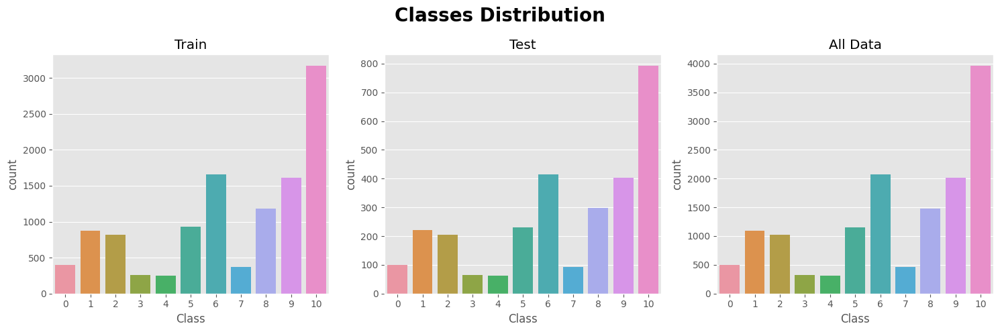

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

sns.countplot(x=y_train, ax=axes[0])
axes[0].set_title('Train')

sns.countplot(x=y_test, ax=axes[1])
axes[1].set_title('Test')

sns.countplot(x=y, ax=axes[2])
axes[2].set_title('All Data')

fig.suptitle('Classes Distribution', fontsize=20, fontweight='bold')
plt.tight_layout()
plt.show()

> **Class weights can help to prevent our model from overfitting the majority class or underfitting the minority class. This can help to reduce bias in the model due to our imbalance classes.**

In [ ]:
from sklearn.utils.class_weight import compute_class_weight

def getClassWeight(train_data):

    class_weights = compute_class_weight("balanced", classes = np.unique(train_data),
                                         y = train_data)

    class_weights = dict(zip(np.unique(np.unique(train_data)), class_weights))

    return class_weights

In [ ]:
class_weights = getClassWeight(y_train)

class_weights

{0: 2.617272727272727,
 1: 1.1923793746117208,
 2: 1.2861291043109224,
 3: 4.0577871740662435,
 4: 4.221407624633431,
 5: 1.1305713724720203,
 6: 0.6325734688272453,
 7: 2.837152007883715,
 8: 0.8827226736164342,
 9: 0.6482409231635238,
 10: 0.3305680741740104}

In [ ]:
from sklearn.model_selection import cross_val_score, cross_validate, cross_val_predict,StratifiedKFold
from sklearn.metrics import f1_score, accuracy_score, roc_auc_score, balanced_accuracy_score

cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=0)

def test_performence(model, cv=cv):

    # Cross Validation
    model_cv_acc = cross_validate(model, X_train, y_train, scoring=["accuracy",'f1_weighted'], cv=cv, n_jobs=-1)

    acc_cv_scores_df = pd.DataFrame([pd.Series(model_cv_acc['test_accuracy']).describe().T], index=['Model Cross-Val Acc Scores']).T

    f1_cv_scores_df = pd.DataFrame([pd.Series(model_cv_acc['test_f1_weighted']).describe().T], index=['Model Cross-Val F1 Scores']).T

    cv_results_df = pd.concat([acc_cv_scores_df, f1_cv_scores_df], axis=1)

    display(cv_results_df.style.background_gradient(cmap='BuPu', axis=1))

    # Cross Validation Predictions
    model_pred_cv = cross_val_predict(model, X_train, y_train, cv=cv, n_jobs=-1)

    # Accuracy Comparison
    acc_cv = accuracy_score(y_train, model_pred_cv)

    # Balanced Accuracy Comparison
    balanced_acc_cv = balanced_accuracy_score(y_train, model_pred_cv)

    # F1 Score Comparison
    f1Score_cv = f1_score(y_train, model_pred_cv, average='weighted')

    cv_pred_score = pd.DataFrame({'Accuracy': acc_cv, 'Balanced Accuracy': balanced_acc_cv, 'F1 Score': f1Score_cv,
                                  }, index= ['Model Cross-Val Predictions Scores']).T

    # Displaying Scores
    display(cv_pred_score.style.background_gradient(cmap='YlOrRd', axis=0))

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, precision_score, recall_score, ConfusionMatrixDisplay

def make_classification_plots(model_preds, title):
  plt.style.use('default')
  fig, axes = plt.subplots(1, 2, figsize=(15, 5))

  cm_matrix = confusion_matrix(y_test, model_preds)

  # 1 - Summary Statistics
  accuracy = accuracy_score(y_test, model_preds) # % positive out of all predicted positives
  balanced_accuracy = balanced_accuracy_score(y_test, model_preds)
  precision = precision_score(y_test, model_preds, average='weighted') # % positive out of all predicted positives
  recall =  recall_score(y_test, model_preds, average='weighted') # % positive out of all supposed to be positives
  f1 = f1_score(y_test, model_preds, average='weighted')
  stats_summary = '[Summary Statistics]\nAccuracy = {:.2%} | Balanced Accuracy = {:.2%} | Precision = {:.2%} | Recall = {:.2%} | F1-Score = {:.2%}'.format(accuracy, balanced_accuracy , precision, recall, f1)
  print(stats_summary)

  # 2 : Confusion Matrix
  ConfusionMatrixDisplay.from_predictions(y_test, model_preds, ax=axes[0])
  axes[0].set_title("Confusion Matrix")

  # 3 : Normalized Confusion Matrix
  ConfusionMatrixDisplay.from_predictions(y_test, model_preds, ax=axes[1], normalize="true", values_format=".0%")
  axes[1].set_title("Normalized Confusion Matrix")

  fig.suptitle(f"{title} Test Metrics", fontsize=20, fontweight='bold')
  plt.tight_layout()
  plt.show()

  # 4 : Classification Report
  class_report = classification_report(y_test, model_preds)
  print('\n', f"{title} Classification Report: \n {class_report}")

  plt.style.use('ggplot')

# **Feature Engineering**

## **Adding Random Noise**

> **We will create a new random feature to help us select features more effectively. This feature will not contribute to the model's prediction, but it will allow us to assess the importance of the other features.**

In [ ]:
X_train['Random'] = np.random.normal(size=X_train.shape[0])

X_train

,key_1.0,key_2.0,key_3.0,key_4.0,key_5.0,key_6.0,key_7.0,key_8.0,key_9.0,key_10.0,key_11.0,time_signature_1.0,time_signature_3.0,time_signature_4.0,time_signature_5.0,Relevancy_Comman,Relevancy_Popular,Relevancy_Trendy,Relevancy_Uncomman,mood_Happy,mood_Normal,mood_Sad,type_Mix,type_Music,type_Speech,...,ArtistTracksDuration,ArtistTracksSpeechiness,speechiness,ArtistName_Words,liveness,TracktName_Lenght,TracktName_Words,instrumentalness,ArtistTracksAcousticness,acousticness,loudness,Popularity,danceability,energy,modality,valence,tempo,duration_in min/ms,Artist Name,Track Name,instrumental,live,ArtistPopularity,ArtistTracksMood,Random
0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.143520,-0.738756,-0.581267,0.000000,0.723711,-0.285060,-0.588692,1.042700,0.781708,0.837412,0.399727,-0.043478,-0.151111,-0.087571,0.0,0.045576,-0.383516,0.282395,0.000000,0.000000,0.0,0.0,-0.046154,0.033852,-0.256708
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,2.830635,-0.533795,-0.395117,0.000000,-0.194872,0.296950,-0.588692,-0.085343,0.803808,0.855473,-0.947431,0.347826,0.368889,-1.186441,0.0,0.067024,0.199477,4.367265,0.000000,0.304272,0.0,0.0,0.369231,0.060934,-0.897205
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,-0.123077,-0.443162,-0.148110,0.000000,0.327919,0.533230,0.411308,0.000000,0.485148,0.570229,-0.231059,0.695652,0.742222,-0.336158,0.0,0.088472,0.121598,-2.416895,-3.216911,0.000000,0.0,0.0,0.738462,0.364478,0.129114
3,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.257911,-0.307817,-0.189596,-1.000000,0.048455,-0.659498,-1.545077,-0.090397,0.881257,0.917756,-0.555101,-0.739130,0.608889,-0.231638,0.0,0.605898,0.080376,0.378520,0.000000,0.000000,0.0,0.0,-0.784615,0.741368,-0.303760
4,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,-1.708837,0.770581,0.674221,1.136845,0.618666,0.728996,0.720637,0.000000,-0.352672,-0.058111,1.163248,0.565217,0.200000,0.703390,0.0,0.171582,1.355780,-0.514276,-0.533422,0.000000,0.0,0.0,0.161538,-0.401151,-0.836229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11511,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,-0.523448,1.330659,1.316028,0.000000,1.047066,-0.087641,0.000000,0.000000,0.185169,0.317554,0.250549,0.434783,1.191111,-0.053672,0.0,-0.217158,0.520671,-0.202117,0.000000,0.000000,0.0,0.0,0.461538,-0.297901,0.477483
11512,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,-0.408728,-0.666161,-0.411000,0.000000,-0.646673,0.533230,0.411308,0.000000,0.601206,0.529847,-0.434875,0.000000,-0.111111,0.056497,0.0,0.994638,0.740937,-2.416914,-2.066844,0.000000,0.0,0.0,0.000000,0.606635,-0.617927
11513,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.252634,-0.046509,0.222796,0.544848,-0.519268,1.006456,0.964792,2.004404,0.510456,-0.132068,-0.444200,0.608696,0.111111,0.573446,0.0,0.447721,0.410324,0.148098,1.843382,0.000000,0.0,0.0,0.476923,0.463778,-0.774506
11514,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-1.0,0.0,-1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,...,-0.247438,-0.773654,-0.612940,0.892952,-0.465138,0.421136,0.720637,0.000000,0.611098,0.694442,0.217188,-1.869565,-0.733333,-0.895480,0.0,-1.084718,-0.836727,-2.416902,0.000000,0.000000,0.0,0.0,-1.984615,-1.393365,0.290019


In [ ]:
X_test['Random'] = np.random.normal(size=X_test.shape[0])

X_test

,key_1.0,key_2.0,key_3.0,key_4.0,key_5.0,key_6.0,key_7.0,key_8.0,key_9.0,key_10.0,key_11.0,time_signature_1.0,time_signature_3.0,time_signature_4.0,time_signature_5.0,Relevancy_Comman,Relevancy_Popular,Relevancy_Trendy,Relevancy_Uncomman,mood_Happy,mood_Normal,mood_Sad,type_Mix,type_Music,type_Speech,...,ArtistTracksDuration,ArtistTracksSpeechiness,speechiness,ArtistName_Words,liveness,TracktName_Lenght,TracktName_Words,instrumentalness,ArtistTracksAcousticness,acousticness,loudness,Popularity,danceability,energy,modality,valence,tempo,duration_in min/ms,Artist Name,Track Name,instrumental,live,ArtistPopularity,ArtistTracksMood,Random
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.915329,-0.289443,-0.172871,0.000000,0.231350,0.970788,0.964792,2.058331,-0.465252,-0.293706,-0.542391,0.695652,-0.004444,-0.144068,0.0,0.198391,-0.816056,1.023519,2.533422,0.000000,0.0,0.0,0.738462,0.226811,0.716175
1,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,-1.067368,-0.384369,-0.258279,0.544848,0.183053,-0.087641,-0.588692,0.083276,0.310456,0.330864,-0.113649,1.608696,0.417778,-0.098870,0.0,0.495979,0.302165,-2.416914,2.314362,1.970939,0.0,0.0,1.430769,0.454751,0.096987
2,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,1.084093,-0.128405,0.289737,0.544848,-0.333475,0.683125,0.411308,2.535140,0.956851,0.977754,-1.560995,-1.130435,-0.355556,-1.533898,0.0,-0.021448,-0.221337,-2.416875,-2.833555,0.000000,1.0,0.0,-0.807692,0.328368,-0.277277
3,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,1.462261,-0.554788,-0.414194,0.000000,-0.766145,-0.285060,0.000000,-0.089777,0.239697,0.367059,-0.639336,1.173913,0.604444,-0.454802,-1.0,1.300268,0.107207,1.709536,2.533422,0.000000,0.0,0.0,1.246154,1.618145,0.973471
4,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.410372,1.494360,1.470657,0.544848,-0.692518,-0.087641,0.000000,0.000000,0.232816,0.360830,-0.555805,-1.478261,0.560000,0.161017,0.0,-0.160858,0.569029,0.513466,-1.300133,0.000000,0.0,0.0,-1.569231,-0.226811,0.902243
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2875,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.040210,0.017647,0.106999,0.892952,0.040510,-0.285060,-0.588692,0.637721,0.428527,0.535844,-0.619844,-0.521739,0.382222,0.186441,0.0,1.225201,-0.058492,0.199145,-1.555704,0.000000,0.0,0.0,-0.553846,1.523358,0.919205
2876,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,-0.279437,-0.495887,-0.360662,-1.000000,-0.148071,-0.815087,-0.588692,0.354369,0.567139,0.656727,-0.499248,-0.130435,1.071111,-0.774011,-1.0,0.978552,-0.121075,-0.038705,0.000000,0.000000,0.0,0.0,-0.138462,1.211916,0.369030
2877,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,-0.441404,0.922558,0.936924,0.544848,0.521088,-1.200792,-1.545077,0.111106,-0.125971,0.029502,1.032098,-0.782609,0.182222,0.703390,0.0,0.134048,-0.095029,-0.148803,0.000000,-0.695728,0.0,0.0,-0.830769,0.145565,0.691815
2878,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.971136,-0.149256,-0.045194,0.000000,0.905346,-0.087641,0.000000,-0.081905,-0.486167,-0.313900,-0.157588,-0.434783,-0.791111,0.048023,0.0,0.053619,0.619363,1.086562,0.000000,0.000000,0.0,0.0,-0.461538,0.044008,1.019228


## **Features Importance**


In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(random_state=0)

rf.fit(X_train, y_train)

RandomForestClassifier(random_state=0)

Text(0.5, 1.0, 'Random Forest Feature Importance')

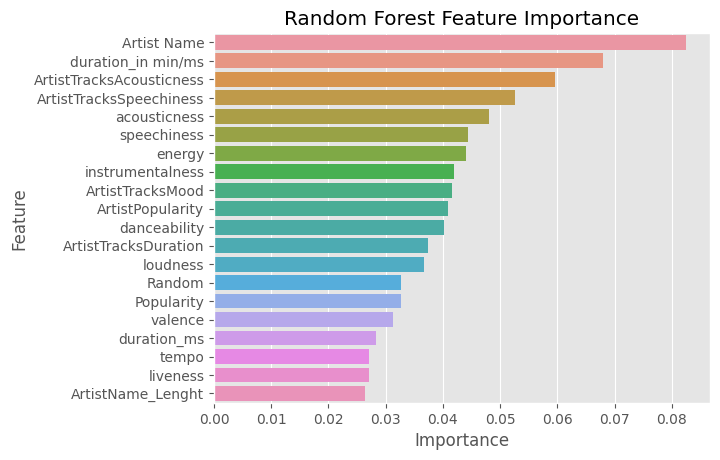

In [ ]:
results = list(zip(X_train, rf.feature_importances_))

importance = pd.DataFrame(results, columns = ["Feature", "Importance"])

importance = importance.sort_values(by="Importance", ascending=False)

sns.barplot(x = importance.Importance[:20], y = importance.Feature[:20])

plt.title("Random Forest Feature Importance")

In [ ]:
print("Random Forest Train Set Accuracy Score: " , rf.score(X_train, y_train))
print("Random Forest Test Set Accuracy Score: " , rf.score(X_test, y_test))

Random Forest Train Set Accuracy Score:  1.0
Random Forest Test Set Accuracy Score:  0.5711805555555556


In [ ]:
from xgboost import XGBClassifier,XGBRFClassifier

xgb = XGBClassifier(random_state=0)

xgb.fit(X_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              objective='multi:softprob', predictor=None, ...)

Text(0.5, 1.0, 'XGBoost Feature Importance')

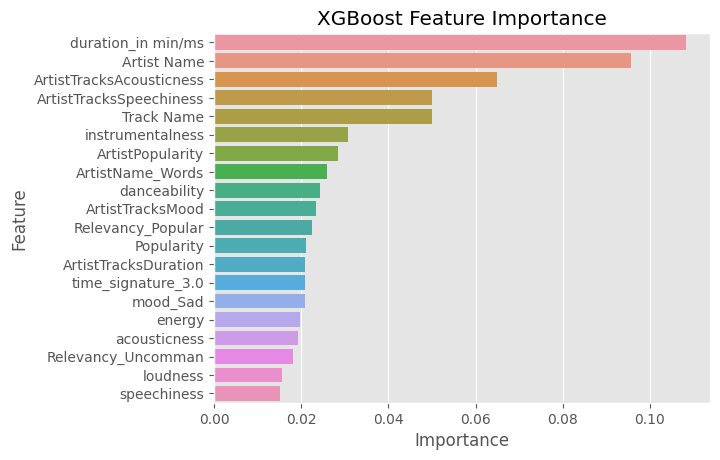

In [ ]:
results = list(zip(X_train, xgb.feature_importances_))

importance = pd.DataFrame(results, columns = ["Feature", "Importance"])

importance = importance.sort_values(by="Importance", ascending=False)

sns.barplot(x = importance.Importance[:20], y = importance.Feature[:20])

plt.title("XGBoost Feature Importance")

In [ ]:
print("XGBoost Train Set Accuracy Score: " , xgb.score(X_train, y_train))
print("XGBoost Test Set Accuracy Score: " , xgb.score(X_test, y_test))

XGBoost Train Set Accuracy Score:  0.9863667940257034
XGBoost Test Set Accuracy Score:  0.5920138888888888


In [ ]:
from catboost import CatBoostClassifier

cat = CatBoostClassifier(random_state=0)

cat.fit(X_train,y_train)

Learning rate set to 0.089629
0:	learn: 2.1948243	total: 59.7ms	remaining: 59.7s
1:	learn: 2.0528195	total: 129ms	remaining: 1m 4s
2:	learn: 1.9498405	total: 181ms	remaining: 1m
3:	learn: 1.8713246	total: 249ms	remaining: 1m 1s
4:	learn: 1.8000899	total: 303ms	remaining: 1m
5:	learn: 1.7325245	total: 359ms	remaining: 59.4s
6:	learn: 1.6867711	total: 418ms	remaining: 59.3s
7:	learn: 1.6368806	total: 480ms	remaining: 59.5s
8:	learn: 1.5931635	total: 538ms	remaining: 59.2s
9:	learn: 1.5550460	total: 593ms	remaining: 58.7s
10:	learn: 1.5215342	total: 653ms	remaining: 58.7s
11:	learn: 1.4887075	total: 713ms	remaining: 58.7s
12:	learn: 1.4626764	total: 772ms	remaining: 58.6s
13:	learn: 1.4360239	total: 831ms	remaining: 58.5s
14:	learn: 1.4102704	total: 893ms	remaining: 58.7s
15:	learn: 1.3922566	total: 948ms	remaining: 58.3s
16:	learn: 1.3764729	total: 1s	remaining: 57.8s
17:	learn: 1.3553681	total: 1.07s	remaining: 58.2s
18:	learn: 1.3380717	total: 1.12s	remaining: 57.9s
19:	learn: 1.322104

Text(0.5, 1.0, 'CatBoost Feature Importance')

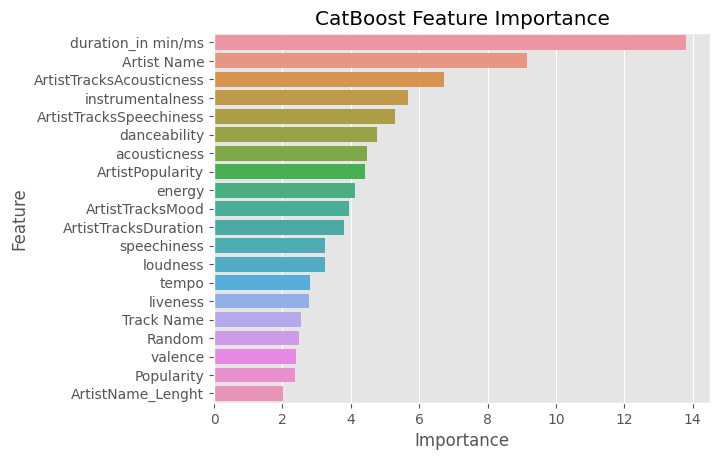

In [ ]:
results = list(zip(X_train, cat.feature_importances_))

importance = pd.DataFrame(results, columns = ["Feature", "Importance"])

importance = importance.sort_values(by="Importance", ascending=False)

sns.barplot(x = importance.Importance[:20], y = importance.Feature[:20])

plt.title("CatBoost Feature Importance")

In [ ]:
print("CatBoost Train Set Accuracy Score: " , cat.score(X_train, y_train))
print("CatBoost Test Set Accuracy Score: " , cat.score(X_test, y_test))

CatBoost Train Set Accuracy Score:  0.919763806877388
CatBoost Test Set Accuracy Score:  0.6045138888888889


- **We can notice that the models rely heavily in prediction on `['duration','artist name']` features.**

- **Interstingly, There is some features that don't differ much from a completly random feature like some numerical features and most categorical ones.**


## **RFE with XGBoost**

- **Let's try to reduce our 50 features to lesser dimensions.**

In [ ]:
xgb = XGBClassifier(random_state=0)

xgb.fit(X_train, y_train)

In [ ]:
print("XGBoost Test Set Accuracy Score Before RFE: " , xgb.score(X_test, y_test))

XGBoost Test Set Accuracy Score Before RFE:  0.5878472222222222


In [ ]:
from sklearn.feature_selection import RFE

rfe = RFE(estimator = XGBClassifier(random_state=0) , n_features_to_select= 20 , step = 10 , verbose=1)

rfe.fit(X_train, y_train)

Fitting estimator with 51 features.
Fitting estimator with 41 features.
Fitting estimator with 31 features.
Fitting estimator with 21 features.


RFE(estimator=XGBClassifier(base_score=None, booster=None, callbacks=None,
                            colsample_bylevel=None, colsample_bynode=None,
                            colsample_bytree=None, early_stopping_rounds=None,
                            enable_categorical=False, eval_metric=None,
                            feature_types=None, gamma=None, gpu_id=None,
                            grow_policy=None, importance_type=None,
                            interaction_constraints=None, learning_rate=None,
                            max_bin=None, max_cat_threshold=None,
                            max_cat_to_onehot=None, max_delta_step=None,
                            max_depth=None, max_leaves=None,
                            min_child_weight=None, missing=nan,
                            monotone_constraints=None, n_estimators=100,
                            n_jobs=None, num_parallel_tree=None, predictor=None,
                            random_state=0, ...),
    n_features_to_select=20, step=10, verbose=1)

In [ ]:
reduced_X = X_train.loc[:, rfe.support_]
reduced_X

,time_signature_3.0,Relevancy_Popular,ArtistName_Lenght,ArtistTracksDuration,ArtistTracksSpeechiness,speechiness,ArtistName_Words,instrumentalness,ArtistTracksAcousticness,acousticness,loudness,Popularity,danceability,energy,valence,duration_in min/ms,Artist Name,Track Name,ArtistPopularity,ArtistTracksMood
0,0.0,0.0,0.552808,0.143520,-0.738756,-0.581267,0.000000,1.042700,0.781708,0.837412,0.399727,-0.043478,-0.151111,-0.087571,0.045576,0.282395,0.000000,0.000000,-0.046154,0.033852
1,0.0,1.0,0.000000,2.830635,-0.533795,-0.395117,0.000000,-0.085343,0.803808,0.855473,-0.947431,0.347826,0.368889,-1.186441,0.067024,4.367265,0.000000,0.304272,0.369231,0.060934
2,0.0,1.0,0.155490,-0.123077,-0.443162,-0.148110,0.000000,0.000000,0.485148,0.570229,-0.231059,0.695652,0.742222,-0.336158,0.088472,-2.416895,-3.216911,0.000000,0.738462,0.364478
3,0.0,0.0,-2.271625,0.257911,-0.307817,-0.189596,-1.000000,-0.090397,0.881257,0.917756,-0.555101,-0.739130,0.608889,-0.231638,0.605898,0.378520,0.000000,0.000000,-0.784615,0.741368
4,0.0,1.0,1.818138,-1.708837,0.770581,0.674221,1.136845,0.000000,-0.352672,-0.058111,1.163248,0.565217,0.200000,0.703390,0.171582,-0.514276,-0.533422,0.000000,0.161538,-0.401151
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11511,0.0,1.0,0.000000,-0.523448,1.330659,1.316028,0.000000,0.000000,0.185169,0.317554,0.250549,0.434783,1.191111,-0.053672,-0.217158,-0.202117,0.000000,0.000000,0.461538,-0.297901
11512,0.0,0.0,0.298291,-0.408728,-0.666161,-0.411000,0.000000,0.000000,0.601206,0.529847,-0.434875,0.000000,-0.111111,0.056497,0.994638,-2.416914,-2.066844,0.000000,0.000000,0.606635
11513,0.0,1.0,0.875155,0.252634,-0.046509,0.222796,0.544848,2.004404,0.510456,-0.132068,-0.444200,0.608696,0.111111,0.573446,0.447721,0.148098,1.843382,0.000000,0.476923,0.463778
11514,1.0,0.0,1.378019,-0.247438,-0.773654,-0.612940,0.892952,0.000000,0.611098,0.694442,0.217188,-1.869565,-0.733333,-0.895480,-1.084718,-2.416902,0.000000,0.000000,-1.984615,-1.393365


In [ ]:
reduced_X.columns.tolist()

['time_signature_3.0',
 'Relevancy_Popular',
 'ArtistName_Lenght',
 'ArtistTracksDuration',
 'ArtistTracksSpeechiness',
 'speechiness',
 'ArtistName_Words',
 'instrumentalness',
 'ArtistTracksAcousticness',
 'acousticness',
 'loudness',
 'Popularity',
 'danceability',
 'energy',
 'valence',
 'duration_in min/ms',
 'Artist Name',
 'Track Name',
 'ArtistPopularity',
 'ArtistTracksMood']

In [ ]:
results = list(zip(reduced_X, rfe.estimator_.feature_importances_))
importance = pd.DataFrame(results, columns = ["Feature", "Importance"])
importance = importance.sort_values(by="Importance", ascending=False)
importance.sort_values(by="Importance" , ascending=False).style.background_gradient(cmap='YlOrRd',axis=0)

,Feature,Importance
16,Artist Name,0.153855
15,duration_in min/ms,0.106741
8,ArtistTracksAcousticness,0.092386
17,Track Name,0.083571
4,ArtistTracksSpeechiness,0.075745
18,ArtistPopularity,0.044733
7,instrumentalness,0.043776
0,time_signature_3.0,0.037945
6,ArtistName_Words,0.037381
19,ArtistTracksMood,0.036396


In [ ]:
print("XGBoost Test Set Accuracy Score After RFE: " , rfe.score(X_test, y_test))

XGBoost Test Set Accuracy Score After RFE:  0.5774305555555556


In [ ]:
X_train_reduced = X_train[reduced_X.columns]

X_test_reduced = X_test[reduced_X.columns]

X_train_reduced.shape, X_test_reduced.shape

((11516, 20), (2880, 20))

In [ ]:
rf.fit(X_train_reduced, y_train)
print("Random Forest Train Set Accuracy Score After RFE: " , rf.score(X_train_reduced, y_train))
print("Random Forest Test Set Accuracy Score After RFE: " , rf.score(X_test_reduced, y_test))

Random Forest Train Set Accuracy Score After RFE:  1.0
Random Forest Test Set Accuracy Score After RFE:  0.5600694444444444


In [ ]:
cat.fit(X_train_reduced,y_train, silent=True)
print("CatBoost Train Set Accuracy Score After RFE: " , cat.score(X_train_reduced, y_train))
print("CatBoost Test Set Accuracy Score After RFE: " , cat.score(X_test_reduced, y_test))

CatBoost Train Set Accuracy Score After RFE:  0.9007467870788468
CatBoost Test Set Accuracy Score After RFE:  0.5927083333333333


- **Nearly the same performence but with only 20 features.**

## **Permuation Importance**


- **Permuation Importance works by randomly shuffling the values of a feature and then measuring how much the model's performance decreases.**
 - **The more the model's performance decreases, the more important the feature is.**

In [ ]:
!pip install eli5
from sklearn.inspection import permutation_importance
import eli5
from eli5.sklearn import PermutationImportance

In [ ]:
def plot_permutation_importance(perm_dict, X, title):
    sorted_importances_idx = perm_dict['importances_mean'].argsort()
    importances = pd.DataFrame(
        perm_dict['importances'][sorted_importances_idx].T,
        columns=X.columns[sorted_importances_idx],
    )
    ax = importances.plot.box(vert=False, whis=10)
    ax.set_title(title)
    ax.axvline(x=0, color="k", linestyle="--")
    ax.set_xlabel('Decrease in accuracy score')
    ax.figure.tight_layout()

In [ ]:
rf_perm = permutation_importance(
    rf, X_test_reduced, y_test, n_repeats=100, random_state=0
)

xgb_perm = permutation_importance(
    xgb, X_test_reduced, y_test, n_repeats=100, random_state=0
)

cat_perm = permutation_importance(
    cat, X_test_reduced, y_test, n_repeats=100, random_state=0
)

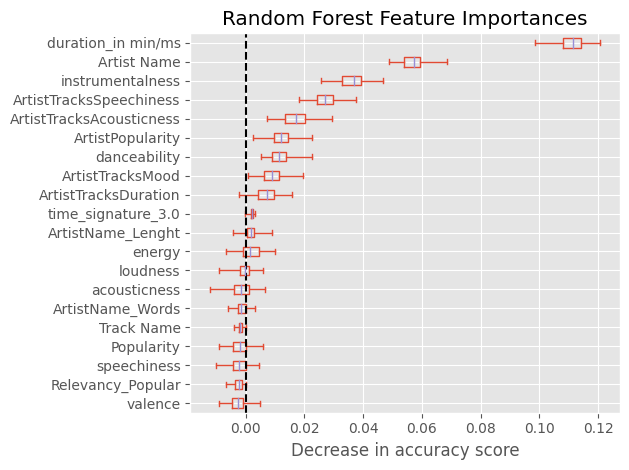

In [ ]:
plot_permutation_importance(rf_perm, X_test_reduced, 'Random Forest Feature Importances')

In [ ]:
rf_perm = PermutationImportance(rf, random_state=0).fit(X_train_reduced, y_train)

eli5.show_weights(rf_perm, feature_names = X_train_reduced.columns.tolist())

Weight,Feature
0.1742 ± 0.0048,duration_in min/ms
0.1529 ± 0.0022,Artist Name
0.0679 ± 0.0022,instrumentalness
0.0670 ± 0.0008,ArtistTracksAcousticness
0.0462 ± 0.0036,ArtistTracksSpeechiness
0.0448 ± 0.0017,danceability
0.0348 ± 0.0024,energy
0.0336 ± 0.0010,Track Name
0.0279 ± 0.0008,ArtistTracksMood
0.0235 ± 0.0010,ArtistTracksDuration


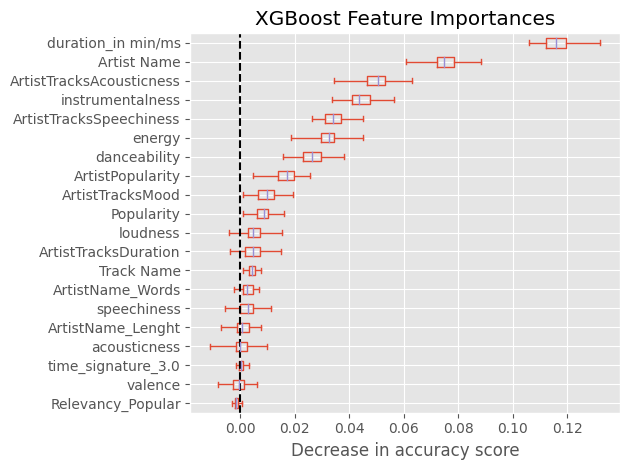

In [ ]:
plot_permutation_importance(xgb_perm, X_test_reduced, 'XGBoost Feature Importances')

In [ ]:
xgb_perm = PermutationImportance(xgb, random_state=0).fit(X_train_reduced, y_train)

eli5.show_weights(xgb_perm, feature_names = X_train_reduced.columns.tolist())

Weight,Feature
0.2018 ± 0.0037,duration_in min/ms
0.1809 ± 0.0030,Artist Name
0.1046 ± 0.0027,ArtistTracksAcousticness
0.0964 ± 0.0029,instrumentalness
0.0852 ± 0.0018,Track Name
0.0784 ± 0.0057,energy
0.0756 ± 0.0029,danceability
0.0725 ± 0.0015,ArtistTracksSpeechiness
0.0574 ± 0.0051,ArtistPopularity
0.0527 ± 0.0019,loudness


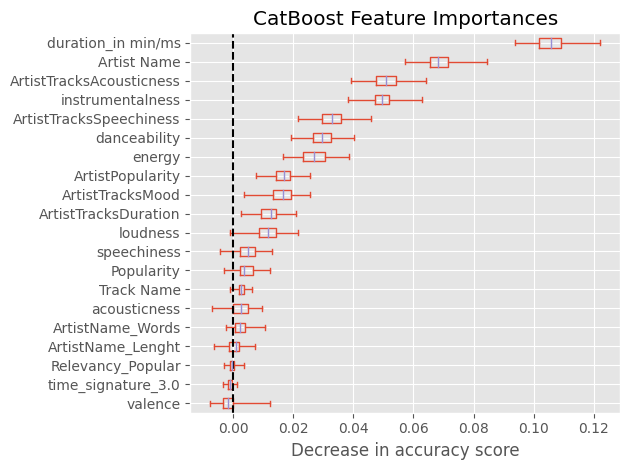

In [ ]:
plot_permutation_importance(cat_perm, X_test_reduced, 'CatBoost Feature Importances')

In [ ]:
cat_perm = PermutationImportance(cat, random_state=0).fit(X_train_reduced, y_train)

eli5.show_weights(cat_perm, feature_names = X_train_reduced.columns.tolist())

Weight,Feature
0.1841 ± 0.0047,duration_in min/ms
0.1723 ± 0.0029,Artist Name
0.1172 ± 0.0019,ArtistTracksAcousticness
0.1065 ± 0.0042,instrumentalness
0.0921 ± 0.0016,ArtistTracksSpeechiness
0.0892 ± 0.0021,Track Name
0.0809 ± 0.0030,danceability
0.0795 ± 0.0048,energy
0.0711 ± 0.0055,ArtistPopularity
0.0699 ± 0.0014,loudness


- **We can see that Permutation Importance gave similar insights to our features, `['duration','artist name']` features have the biggest influence on model prediction.**

- **And Seems `['time_signature','Popularity','valence','Track Name']` Features don't matter much in our predictions.**

## **SHAP Values**

> **SHAP values interpret the impact of having a certain value for a given feature in comparison to the prediction we'd make if that feature took some baseline value.**

In [ ]:
!pip install shap
import shap

In [ ]:
data_for_prediction = X_test_reduced.sample(1)
data_for_prediction

,time_signature_3.0,Relevancy_Popular,ArtistName_Lenght,ArtistTracksDuration,ArtistTracksSpeechiness,speechiness,ArtistName_Words,instrumentalness,ArtistTracksAcousticness,acousticness,loudness,Popularity,danceability,energy,valence,duration_in min/ms,Artist Name,Track Name,ArtistPopularity,ArtistTracksMood
1459,0.0,0.0,0.43024,0.232648,0.035079,0.122906,0.0,0.712466,-0.486954,-0.31466,-0.74046,-0.434783,-0.084444,0.525424,0.809651,0.356924,0.0,0.0,-0.461538,0.998646


In [ ]:
rf_explainer = shap.TreeExplainer(rf)

rf_shap_values = rf_explainer.shap_values(data_for_prediction)

In [ ]:
shap.initjs()
shap.force_plot(rf_explainer.expected_value[1], rf_shap_values[1], data_for_prediction)

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


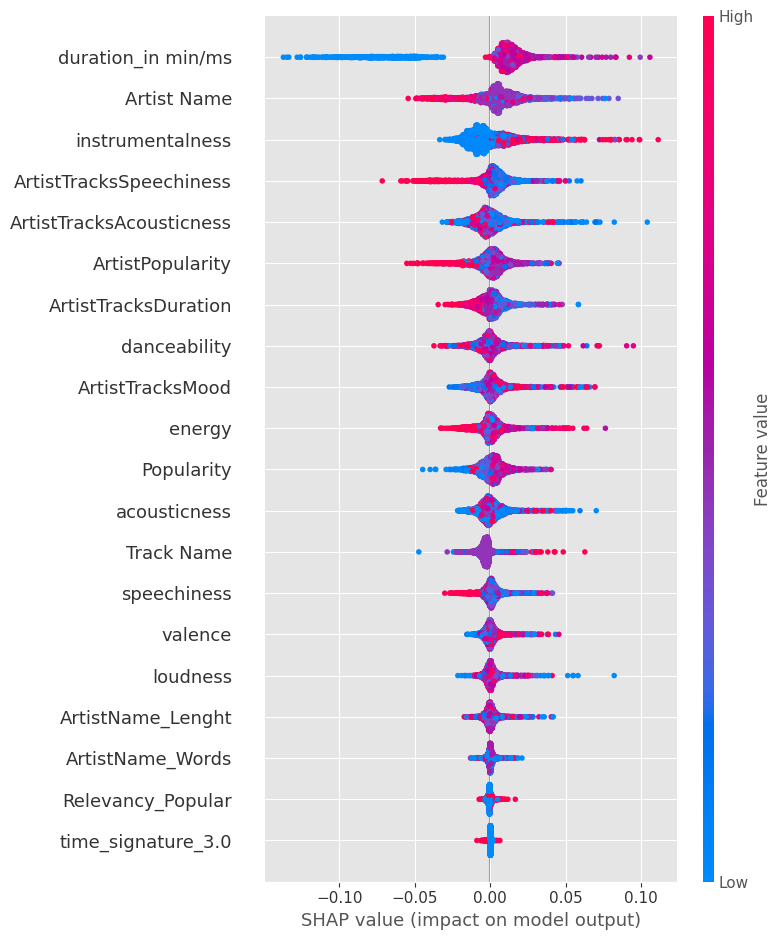

In [ ]:
rf_shap_values = rf_explainer.shap_values(X_test_reduced)
shap.summary_plot(rf_shap_values[1], X_test_reduced)

In [ ]:
xgb_explainer = shap.TreeExplainer(xgb)

xgb_shap_values = xgb_explainer.shap_values(data_for_prediction)

In [ ]:
shap.initjs()
shap.force_plot(xgb_explainer.expected_value[1], xgb_shap_values[1], data_for_prediction)

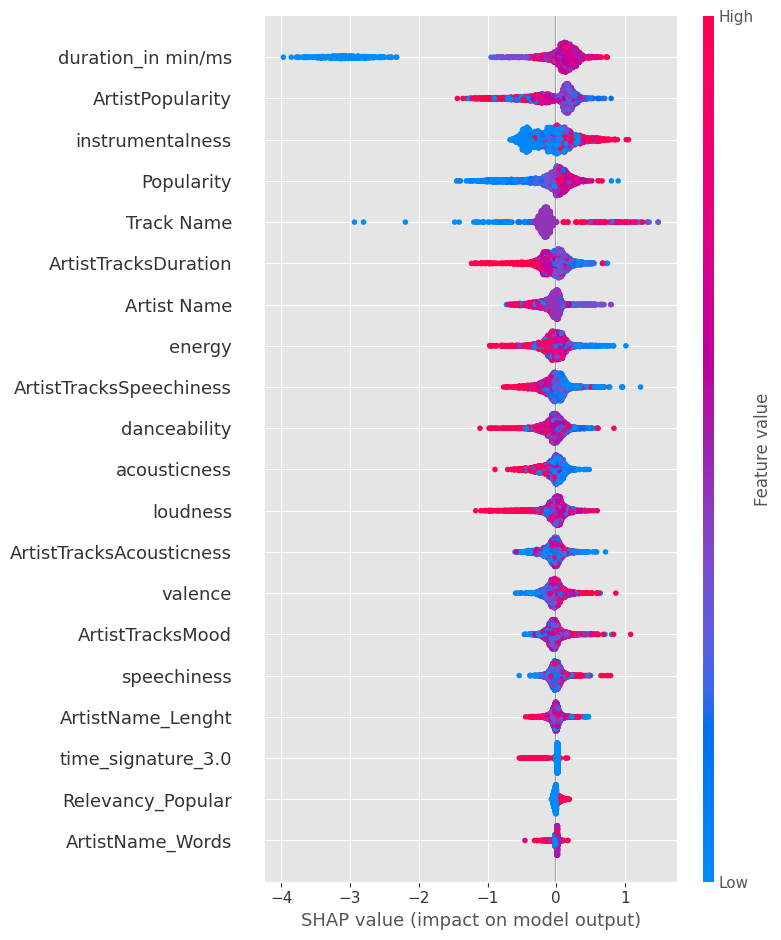

In [ ]:
xgb_shap_values = xgb_explainer.shap_values(X_test_reduced)
shap.summary_plot(xgb_shap_values[1], X_test_reduced)

In [ ]:
cat_explainer = shap.TreeExplainer(cat)

cat_shap_values = cat_explainer.shap_values(data_for_prediction)

In [ ]:
shap.initjs()
shap.force_plot(cat_explainer.expected_value[1], cat_shap_values[1], data_for_prediction)

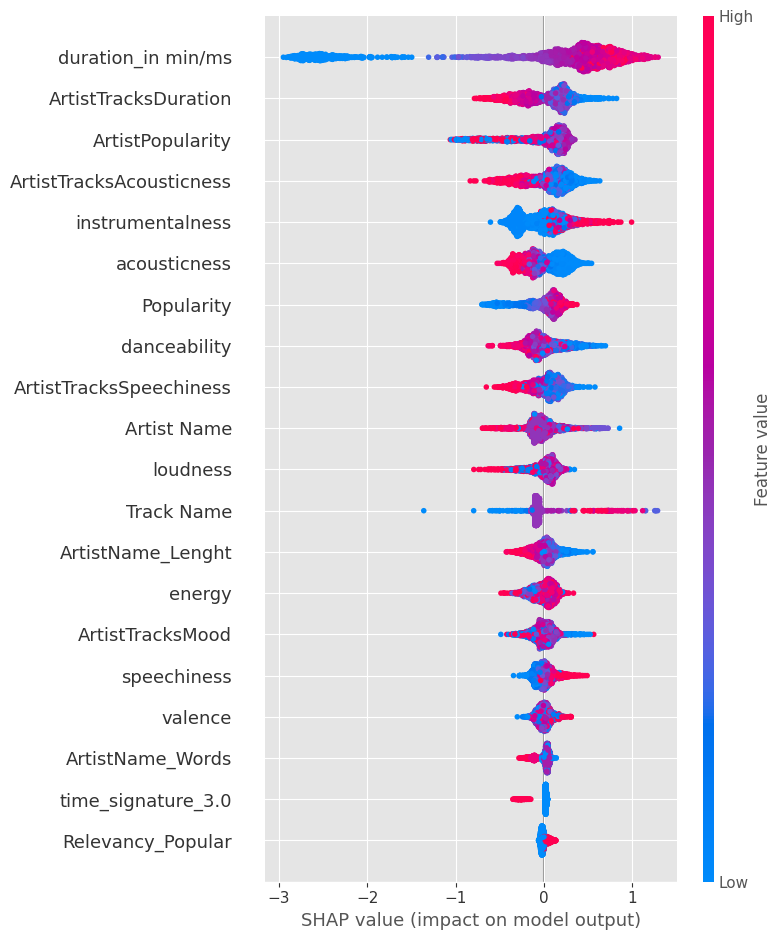

In [ ]:
cat_shap_values = cat_explainer.shap_values(X_test_reduced)
shap.summary_plot(cat_shap_values[1], X_test_reduced)

- **SHAP values reveals intersing findings. apart from the models relying on `'duration'` for predictions, Seems there are more useful features to the models like `['instrumentless','acoustiness']` and Artists Derived Insights.**
  - **Interstingly `'Popularity'` Seems to have a noticable influence on models predictions.**

## **SMOTE Oversampling**

- **We will try to fix the imbalance in our classes by oversampling the minor classes using SMOTE**.

In [ ]:
from imblearn.over_sampling import SMOTE, ADASYN, SMOTEN

> **SMOTE synthesises new minority instances between existing minority instances. It generates the virtual training records by linear interpolation for the minority class.**

Text(0.5, 1.0, 'Target Class Distribution')

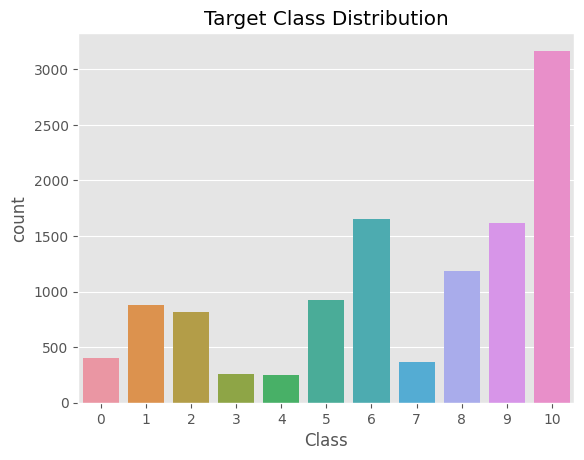

In [ ]:
sns.countplot(x=y_train)
plt.title('Target Class Distribution')

In [ ]:
smote = SMOTE(random_state=0, k_neighbors=100)

X_train_res, y_train_res = smote.fit_resample(X_train, y_train)

> **These synthetic training records are generated by randomly selecting one or more of the k-nearest neighbors for each example in the minority class.**

In [ ]:
X_train = np.concatenate([X_train, X_train_res])

In [ ]:
y_train = np.concatenate([y_train, y_train_res])

In [ ]:
X_train.shape, y_train.shape

((46353, 51), (46353,))

Text(0.5, 1.0, 'Target Class Distribution After SMOTE')

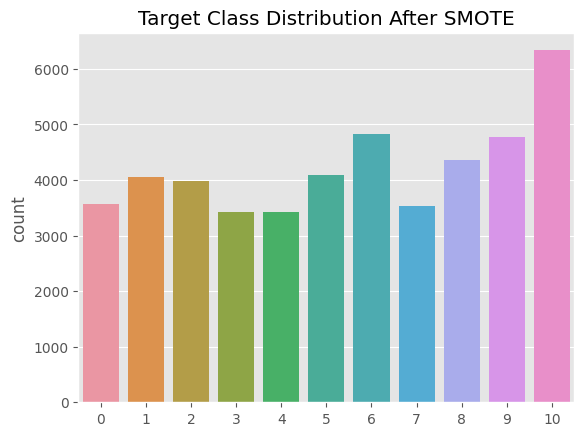

In [ ]:
sns.countplot(x=y_train)

plt.title('Target Class Distribution After SMOTE')

In [ ]:
pd.DataFrame(X_train, columns= smote.get_feature_names_out())

,key_1.0,key_2.0,key_3.0,key_4.0,key_5.0,key_6.0,key_7.0,key_8.0,key_9.0,key_10.0,key_11.0,time_signature_1.0,time_signature_3.0,time_signature_4.0,time_signature_5.0,Relevancy_Comman,Relevancy_Popular,Relevancy_Trendy,Relevancy_Uncomman,mood_Happy,mood_Normal,mood_Sad,type_Mix,type_Music,type_Speech,...,duration_ms,ArtistTracksDuration,ArtistTracksSpeechiness,speechiness,ArtistName_Words,liveness,TracktName_Lenght,TracktName_Words,instrumentalness,ArtistTracksAcousticness,acousticness,loudness,Popularity,danceability,energy,modality,valence,tempo,duration_in min/ms,Artist Name,Track Name,instrumental,live,ArtistPopularity,ArtistTracksMood
0,0.0,0.000000,1.0,0.0,0.00000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,1.00000,0.00000,0.0,0.0,0.0,...,0.180159,0.143520,-0.738756,-0.581267,0.000000,0.723711,-0.285060,-0.588692,1.042700,0.781708,0.837412,0.399727,-0.043478,-0.151111,-0.087571,0.000000,0.045576,-0.383516,0.282395,0.000000,0.000000,0.0,0.0,-0.046154,0.033852
1,0.0,0.000000,0.0,0.0,0.00000,0.000000,0.000000,1.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,-1.000000,1.000000,0.0,0.0,0.0,1.00000,0.00000,0.0,0.0,0.0,...,2.601547,2.830635,-0.533795,-0.395117,0.000000,-0.194872,0.296950,-0.588692,-0.085343,0.803808,0.855473,-0.947431,0.347826,0.368889,-1.186441,0.000000,0.067024,0.199477,4.367265,0.000000,0.304272,0.0,0.0,0.369231,0.060934
2,0.0,0.000000,0.0,0.0,0.00000,0.000000,0.000000,0.0,0.000000,0.000000,1.0,0.0,0.0,0.0,0.0,-1.000000,1.000000,0.0,0.0,0.0,1.00000,0.00000,0.0,0.0,0.0,...,0.295958,-0.123077,-0.443162,-0.148110,0.000000,0.327919,0.533230,0.411308,0.000000,0.485148,0.570229,-0.231059,0.695652,0.742222,-0.336158,0.000000,0.088472,0.121598,-2.416895,-3.216911,0.000000,0.0,0.0,0.738462,0.364478
3,0.0,0.000000,0.0,0.0,0.00000,1.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,1.0,0.00000,0.00000,0.0,0.0,0.0,...,0.283079,0.257911,-0.307817,-0.189596,-1.000000,0.048455,-0.659498,-1.545077,-0.090397,0.881257,0.917756,-0.555101,-0.739130,0.608889,-0.231638,0.000000,0.605898,0.080376,0.378520,0.000000,0.000000,0.0,0.0,-0.784615,0.741368
4,0.0,0.000000,0.0,0.0,0.00000,1.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,-1.000000,1.000000,0.0,0.0,0.0,1.00000,0.00000,0.0,0.0,0.0,...,-0.901685,-1.708837,0.770581,0.674221,1.136845,0.618666,0.728996,0.720637,0.000000,-0.352672,-0.058111,1.163248,0.565217,0.200000,0.703390,0.000000,0.171582,1.355780,-0.514276,-0.533422,0.000000,0.0,0.0,0.161538,-0.401151
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46348,0.0,0.125488,0.0,0.0,0.00000,0.000000,0.874512,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,1.00000,0.00000,0.0,0.0,0.0,...,-0.396647,-0.297538,0.548056,0.139883,0.000000,-0.049871,0.642665,-0.588692,-0.011348,0.630179,0.635850,-0.214745,-0.168287,0.085297,-0.570886,-1.000000,-0.120433,0.860327,-0.185353,1.766711,0.000000,0.0,0.0,-0.253938,0.348098
46349,0.0,0.000000,0.0,0.0,0.64248,0.000000,0.000000,0.0,0.357520,0.000000,0.0,0.0,0.0,0.0,0.0,-1.000000,0.000000,1.0,0.0,0.0,0.35752,0.64248,0.0,0.0,0.0,...,0.770056,0.638943,1.230904,1.161102,0.000000,0.518164,0.958709,1.005628,-0.032167,0.042178,-0.051043,1.275642,1.596306,0.466397,0.472351,-1.000000,-0.316181,-0.657469,0.994728,-0.643337,0.000000,0.0,0.0,0.939573,0.031525
46350,0.0,0.000000,0.0,0.0,0.00000,0.881827,0.000000,0.0,0.000000,0.118173,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,1.00000,0.00000,0.0,0.0,0.0,...,-0.046034,-0.107953,0.841383,0.863590,0.000000,0.212859,0.753215,0.964792,-0.079752,0.690256,0.761498,0.183877,-0.086957,0.846271,-0.379808,-0.118173,0.352889,0.142839,0.090028,-0.470386,-0.613511,0.0,0.0,-0.275456,0.421894
46351,0.0,0.000000,0.0,0.0,0.00000,0.630839,0.000000,0.0,0.369161,0.000000,0.0,0.0,0.0,0.0,0.0,-0.630839,0.630839,0.0

In [ ]:
y_train

array([9, 2, 4, ..., 9, 9, 9])

- **SMOTE wasn't very useful in increasing modeling performence in this dataset, but surely it's worth a try in such imbalance classes cases.**

# **Machine Learning Models**

## **Traditional Models**

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import LinearSVC, SVC
from sklearn.neural_network import MLPClassifier

In [ ]:
lr = LogisticRegression(random_state=0, max_iter=5000)

knn = KNeighborsClassifier(n_neighbors=500)

linear_svc = LinearSVC(random_state=0, max_iter=2000)

svc = SVC(random_state=0)

mlp = MLPClassifier(random_state=0, hidden_layer_sizes=(128,), max_iter=500, early_stopping=True)

In [ ]:
lr.fit(X_train, y_train)

lrPreds = test_performence(lr)

,Model Cross-Val Acc Scores,Model Cross-Val F1 Scores
count,3.000000,3.000000
mean,0.564171,0.542131
std,0.008338,0.008506
min,0.554977,0.532736
25%,0.560635,0.538542
50%,0.566293,0.544348
75%,0.568768,0.546828
max,0.571243,0.549309


,Model Cross-Val Predictions Scores
Accuracy,0.564172
Balanced Accuracy,0.608257
F1 Score,0.542127


[Summary Statistics]
Accuracy = 56.35% | Balanced Accuracy = 59.89% | Precision = 52.34% | Recall = 56.35% | F1-Score = 53.78%


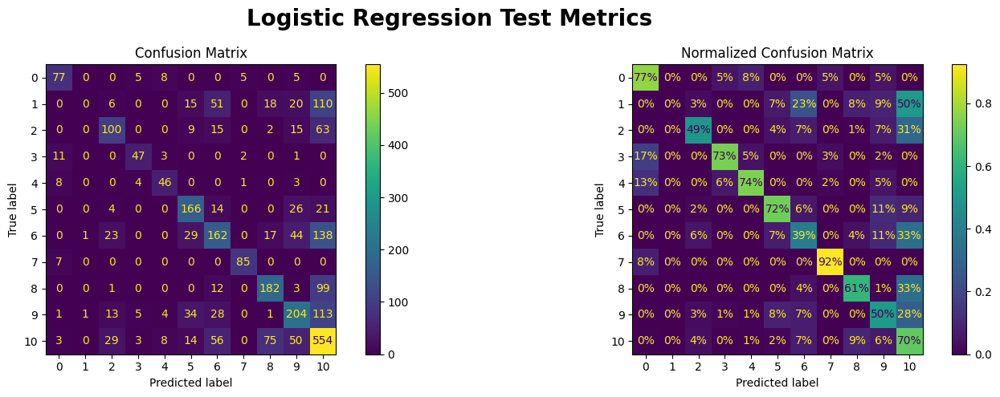


 Logistic Regression Classification Report: 
               precision    recall  f1-score   support

           0       0.72      0.77      0.74       100
           1       0.00      0.00      0.00       220
           2       0.57      0.49      0.53       204
           3       0.73      0.73      0.73        64
           4       0.67      0.74      0.70        62
           5       0.62      0.72      0.67       231
           6       0.48      0.39      0.43       414
           7       0.91      0.92      0.92        92
           8       0.62      0.61      0.61       297
           9       0.55      0.50      0.53       404
          10       0.50      0.70      0.59       792

    accuracy                           0.56      2880
   macro avg       0.58      0.60      0.59      2880
weighted avg       0.52      0.56      0.54      2880



In [ ]:
lrPreds = lr.predict(X_test)

make_classification_plots(lrPreds, 'Logistic Regression')

In [ ]:
knn.fit(X_train, y_train)

test_performence(knn)

,Model Cross-Val Acc Scores,Model Cross-Val F1 Scores
count,3.000000,3.000000
mean,0.500086,0.461280
std,0.005343,0.005623
min,0.494007,0.454789
25%,0.498111,0.459596
50%,0.502214,0.464403
75%,0.503126,0.464526
max,0.504038,0.464649


,Model Cross-Val Predictions Scores
Accuracy,0.500087
Balanced Accuracy,0.450590
F1 Score,0.461307


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



[Summary Statistics]
Accuracy = 51.60% | Balanced Accuracy = 49.56% | Precision = 51.04% | Recall = 51.60% | F1-Score = 47.83%


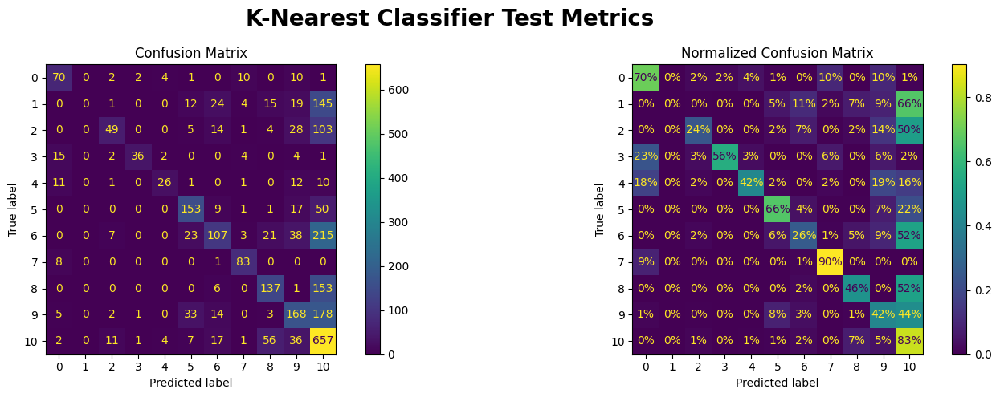


 K-Nearest Classifier Classification Report: 
               precision    recall  f1-score   support

           0       0.63      0.70      0.66       100
           1       0.00      0.00      0.00       220
           2       0.65      0.24      0.35       204
           3       0.90      0.56      0.69        64
           4       0.72      0.42      0.53        62
           5       0.65      0.66      0.66       231
           6       0.56      0.26      0.35       414
           7       0.77      0.90      0.83        92
           8       0.58      0.46      0.51       297
           9       0.50      0.42      0.46       404
          10       0.43      0.83      0.57       792

    accuracy                           0.52      2880
   macro avg       0.58      0.50      0.51      2880
weighted avg       0.51      0.52      0.48      2880



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [ ]:
knnPreds = knn.predict(X_test)

make_classification_plots(knnPreds, 'K-Nearest Classifier')

In [ ]:
linear_svc.fit(X_train, y_train)

test_performence(linear_svc)

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



,Model Cross-Val Acc Scores,Model Cross-Val F1 Scores
count,3.000000,3.000000
mean,0.552448,0.523069
std,0.005014,0.005097
min,0.546899,0.517257
25%,0.550345,0.521212
50%,0.553790,0.525167
75%,0.555223,0.525974
max,0.556655,0.526782


,Model Cross-Val Predictions Scores
Accuracy,0.552449
Balanced Accuracy,0.596136
F1 Score,0.523104


[Summary Statistics]
Accuracy = 55.03% | Balanced Accuracy = 59.75% | Precision = 51.25% | Recall = 55.03% | F1-Score = 51.93%


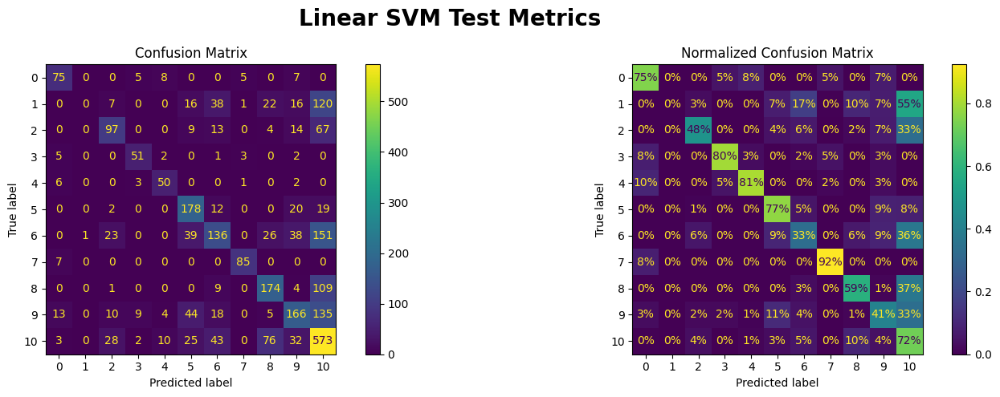


 Linear SVM Classification Report: 
               precision    recall  f1-score   support

           0       0.69      0.75      0.72       100
           1       0.00      0.00      0.00       220
           2       0.58      0.48      0.52       204
           3       0.73      0.80      0.76        64
           4       0.68      0.81      0.74        62
           5       0.57      0.77      0.66       231
           6       0.50      0.33      0.40       414
           7       0.89      0.92      0.91        92
           8       0.57      0.59      0.58       297
           9       0.55      0.41      0.47       404
          10       0.49      0.72      0.58       792

    accuracy                           0.55      2880
   macro avg       0.57      0.60      0.58      2880
weighted avg       0.51      0.55      0.52      2880



In [ ]:
linear_SvcPreds = linear_svc.predict(X_test)

make_classification_plots(linear_SvcPreds, 'Linear SVM')

In [ ]:
svc.fit(X_train, y_train)

test_performence(svc)

,Model Cross-Val Acc Scores,Model Cross-Val F1 Scores
count,3.000000,3.000000
mean,0.601858,0.581682
std,0.005864,0.006771
min,0.595102,0.573943
25%,0.599973,0.579264
50%,0.604845,0.584585
75%,0.605236,0.585551
max,0.605626,0.586516


,Model Cross-Val Predictions Scores
Accuracy,0.601858
Balanced Accuracy,0.641986
F1 Score,0.581685


[Summary Statistics]
Accuracy = 58.99% | Balanced Accuracy = 63.02% | Precision = 56.30% | Recall = 58.99% | F1-Score = 56.50%


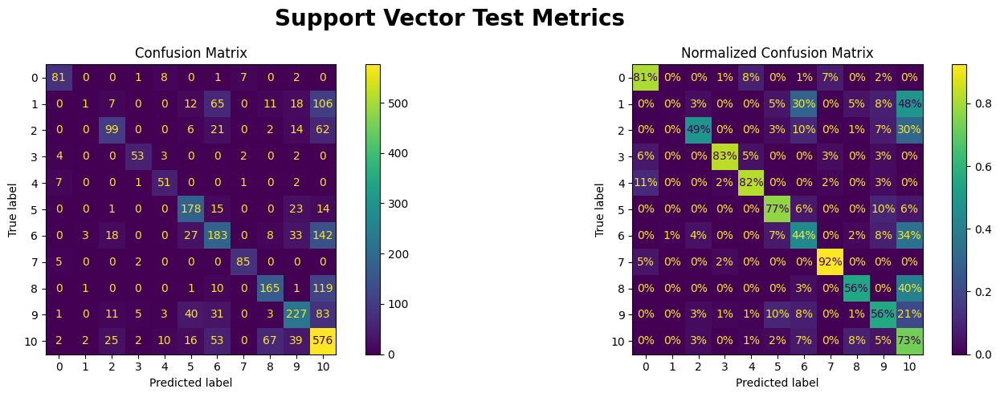


 Support Vector Classification Report: 
               precision    recall  f1-score   support

           0       0.81      0.81      0.81       100
           1       0.14      0.00      0.01       220
           2       0.61      0.49      0.54       204
           3       0.83      0.83      0.83        64
           4       0.68      0.82      0.74        62
           5       0.64      0.77      0.70       231
           6       0.48      0.44      0.46       414
           7       0.89      0.92      0.91        92
           8       0.64      0.56      0.60       297
           9       0.63      0.56      0.59       404
          10       0.52      0.73      0.61       792

    accuracy                           0.59      2880
   macro avg       0.63      0.63      0.62      2880
weighted avg       0.56      0.59      0.56      2880



In [ ]:
svcPreds = svc.predict(X_test)

make_classification_plots(svcPreds, 'Support Vector')

In [ ]:
mlp = MLPClassifier(random_state=0, hidden_layer_sizes = (512,) , max_iter=100,
                    early_stopping=True, solver='adam', learning_rate = 'adaptive',
                    alpha=0.001, activation='relu', batch_size=128)

In [ ]:
mlp.fit(X_train, y_train)

test_performence(mlp)

,Model Cross-Val Acc Scores,Model Cross-Val F1 Scores
count,3.000000,3.000000
mean,0.587530,0.569939
std,0.004722,0.005286
min,0.582335,0.563967
25%,0.585515,0.567901
50%,0.588695,0.571834
75%,0.590128,0.572925
max,0.591560,0.574016


,Model Cross-Val Predictions Scores
Accuracy,0.587530
Balanced Accuracy,0.635420
F1 Score,0.570039


[Summary Statistics]
Accuracy = 58.44% | Balanced Accuracy = 63.80% | Precision = 56.47% | Recall = 58.44% | F1-Score = 56.75%


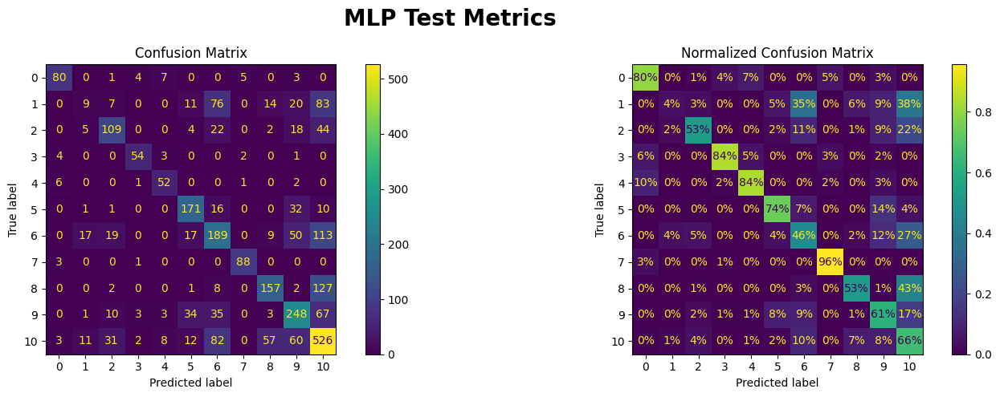


 MLP Classification Report: 
               precision    recall  f1-score   support

           0       0.83      0.80      0.82       100
           1       0.20      0.04      0.07       220
           2       0.61      0.53      0.57       204
           3       0.83      0.84      0.84        64
           4       0.71      0.84      0.77        62
           5       0.68      0.74      0.71       231
           6       0.44      0.46      0.45       414
           7       0.92      0.96      0.94        92
           8       0.65      0.53      0.58       297
           9       0.57      0.61      0.59       404
          10       0.54      0.66      0.60       792

    accuracy                           0.58      2880
   macro avg       0.64      0.64      0.63      2880
weighted avg       0.56      0.58      0.57      2880



In [ ]:
mlpPreds = mlp.predict(X_test)

make_classification_plots(mlpPreds, 'MLP')

- **From our tradional ML models, we can see that the `MLP Classifier` is giving best results along with `Logistic Regression` and `Support Vector Machine`.**

## **Ensemble and Boostings Models**

In [ ]:
!pip install catboost
from sklearn.ensemble import RandomForestClassifier, HistGradientBoostingClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from imblearn.ensemble import BalancedRandomForestClassifier

In [ ]:
rf = RandomForestClassifier(random_state=0)

balanced_rf = BalancedRandomForestClassifier(random_state=0, n_estimators=1000)

gb = GradientBoostingClassifier(random_state=0)

hgb = HistGradientBoostingClassifier(random_state=0)

xgb = XGBClassifier(random_state=0)

lgbm = LGBMClassifier(random_state=0)

cat = CatBoostClassifier(random_state=0, verbose=False)

In [ ]:
rf.fit(X_train, y_train)

test_performence(rf)

,Model Cross-Val Acc Scores,Model Cross-Val F1 Scores
count,3.000000,3.000000
mean,0.597516,0.579260
std,0.001355,0.002202
min,0.596144,0.576739
25%,0.596848,0.578487
50%,0.597551,0.580235
75%,0.598203,0.580521
max,0.598854,0.580807


,Model Cross-Val Predictions Scores
Accuracy,0.597516
Balanced Accuracy,0.639217
F1 Score,0.579320


[Summary Statistics]
Accuracy = 56.56% | Balanced Accuracy = 62.11% | Precision = 54.48% | Recall = 56.56% | F1-Score = 55.13%


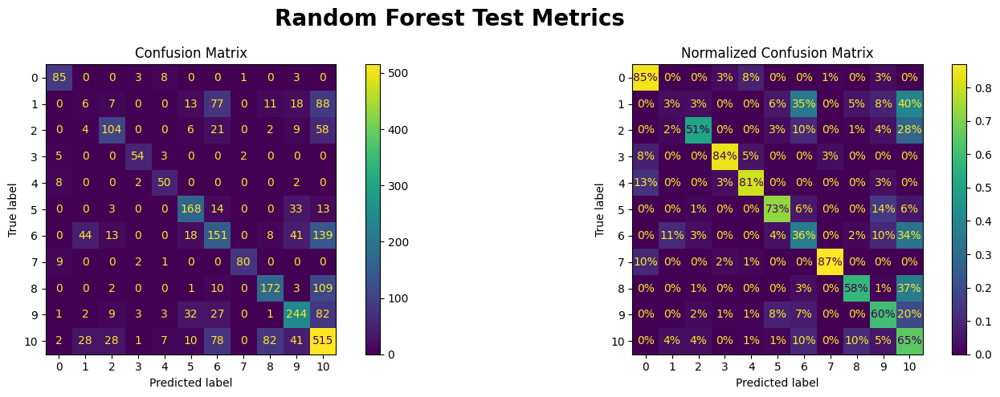


 Random Forest Classification Report: 
               precision    recall  f1-score   support

           0       0.77      0.85      0.81       100
           1       0.07      0.03      0.04       220
           2       0.63      0.51      0.56       204
           3       0.83      0.84      0.84        64
           4       0.69      0.81      0.75        62
           5       0.68      0.73      0.70       231
           6       0.40      0.36      0.38       414
           7       0.96      0.87      0.91        92
           8       0.62      0.58      0.60       297
           9       0.62      0.60      0.61       404
          10       0.51      0.65      0.57       792

    accuracy                           0.57      2880
   macro avg       0.62      0.62      0.62      2880
weighted avg       0.54      0.57      0.55      2880



In [ ]:
rfPreds = rf.predict(X_test)

make_classification_plots(rfPreds, 'Random Forest')

In [ ]:
balanced_rf.fit(X_train, y_train)

test_performence(balanced_rf)

,Model Cross-Val Acc Scores,Model Cross-Val F1 Scores
count,3.000000,3.000000
mean,0.541160,0.529780
std,0.002853,0.003081
min,0.539083,0.526645
25%,0.539534,0.528268
50%,0.539984,0.529891
75%,0.542198,0.531348
max,0.544413,0.532805


,Model Cross-Val Predictions Scores
Accuracy,0.541160
Balanced Accuracy,0.669228
F1 Score,0.529822


[Summary Statistics]
Accuracy = 51.01% | Balanced Accuracy = 64.87% | Precision = 54.15% | Recall = 51.01% | F1-Score = 49.85%


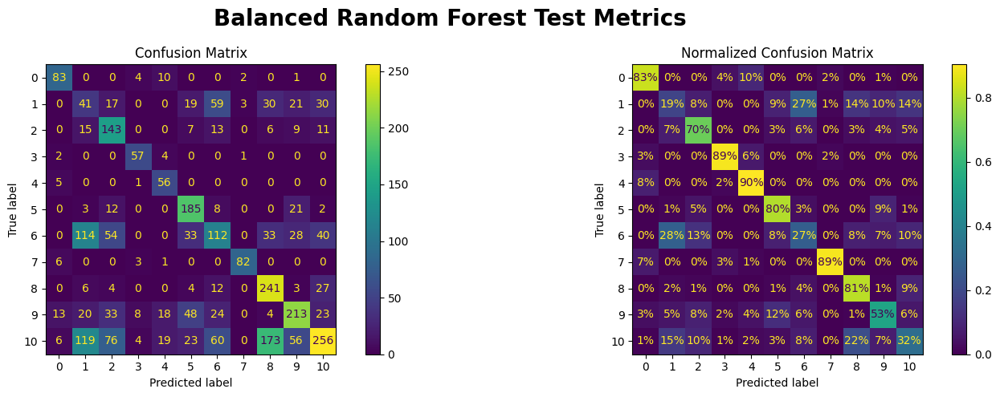


 Balanced Random Forest Classification Report: 
               precision    recall  f1-score   support

           0       0.72      0.83      0.77       100
           1       0.13      0.19      0.15       220
           2       0.42      0.70      0.53       204
           3       0.74      0.89      0.81        64
           4       0.52      0.90      0.66        62
           5       0.58      0.80      0.67       231
           6       0.39      0.27      0.32       414
           7       0.93      0.89      0.91        92
           8       0.49      0.81      0.61       297
           9       0.61      0.53      0.56       404
          10       0.66      0.32      0.43       792

    accuracy                           0.51      2880
   macro avg       0.56      0.65      0.58      2880
weighted avg       0.54      0.51      0.50      2880



In [ ]:
balanced_RfPreds = balanced_rf.predict(X_test)

make_classification_plots(balanced_RfPreds, 'Balanced Random Forest')

In [ ]:
gb.fit(X_train, y_train)

test_performence(gb)

,Model Cross-Val Acc Scores,Model Cross-Val F1 Scores
count,3.000000,3.000000
mean,0.636506,0.628957
std,0.002430,0.001872
min,0.634019,0.626814
25%,0.635322,0.628298
50%,0.636624,0.629782
75%,0.637749,0.630029
max,0.638874,0.630275


,Model Cross-Val Predictions Scores
Accuracy,0.636506
Balanced Accuracy,0.676873
F1 Score,0.628935


[Summary Statistics]
Accuracy = 60.56% | Balanced Accuracy = 63.95% | Precision = 57.10% | Recall = 60.56% | F1-Score = 58.26%


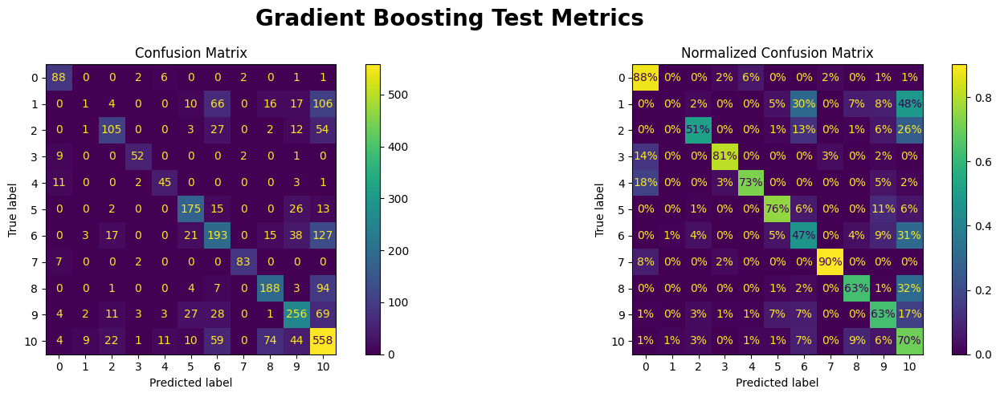


 Gradient Boosting Classification Report: 
               precision    recall  f1-score   support

           0       0.72      0.88      0.79       100
           1       0.06      0.00      0.01       220
           2       0.65      0.51      0.57       204
           3       0.84      0.81      0.83        64
           4       0.69      0.73      0.71        62
           5       0.70      0.76      0.73       231
           6       0.49      0.47      0.48       414
           7       0.95      0.90      0.93        92
           8       0.64      0.63      0.63       297
           9       0.64      0.63      0.64       404
          10       0.55      0.70      0.61       792

    accuracy                           0.61      2880
   macro avg       0.63      0.64      0.63      2880
weighted avg       0.57      0.61      0.58      2880



In [ ]:
gbPreds = gb.predict(X_test)

make_classification_plots(gbPreds, 'Gradient Boosting')

In [ ]:
hgb.fit(X_train, y_train)

test_performence(hgb)

,Model Cross-Val Acc Scores,Model Cross-Val F1 Scores
count,3.000000,3.000000
mean,0.646666,0.639577
std,0.004007,0.002276
min,0.642876,0.637249
25%,0.644569,0.638466
50%,0.646262,0.639684
75%,0.648561,0.640741
max,0.650860,0.641797


,Model Cross-Val Predictions Scores
Accuracy,0.646666
Balanced Accuracy,0.686347
F1 Score,0.639660


[Summary Statistics]
Accuracy = 59.44% | Balanced Accuracy = 64.08% | Precision = 57.74% | Recall = 59.44% | F1-Score = 57.90%


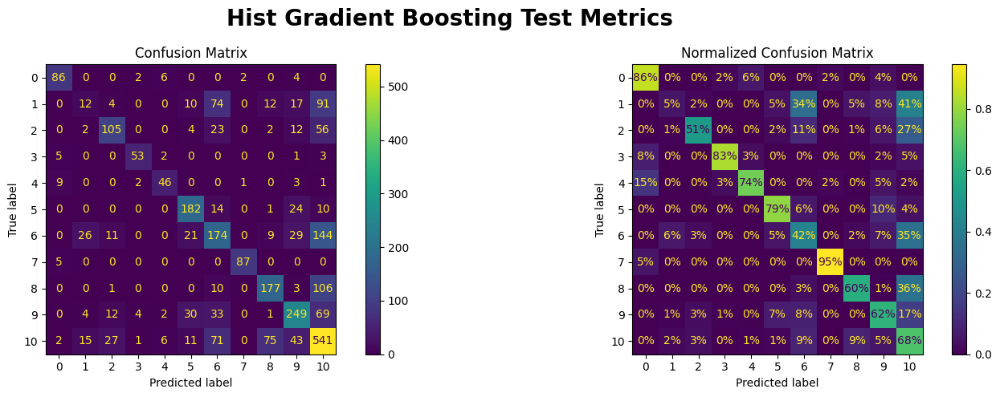


 Hist Gradient Boosting Classification Report: 
               precision    recall  f1-score   support

           0       0.80      0.86      0.83       100
           1       0.20      0.05      0.09       220
           2       0.66      0.51      0.58       204
           3       0.85      0.83      0.84        64
           4       0.74      0.74      0.74        62
           5       0.71      0.79      0.74       231
           6       0.44      0.42      0.43       414
           7       0.97      0.95      0.96        92
           8       0.64      0.60      0.62       297
           9       0.65      0.62      0.63       404
          10       0.53      0.68      0.60       792

    accuracy                           0.59      2880
   macro avg       0.65      0.64      0.64      2880
weighted avg       0.58      0.59      0.58      2880



In [ ]:
hgbPreds = hgb.predict(X_test)

make_classification_plots(hgbPreds, 'Hist Gradient Boosting')

In [ ]:
xgb.fit(X_train, y_train)

test_performence(xgb)

,Model Cross-Val Acc Scores,Model Cross-Val F1 Scores
count,3.000000,3.000000
mean,0.639285,0.631804
std,0.003470,0.002048
min,0.635843,0.629803
25%,0.637536,0.630759
50%,0.639229,0.631714
75%,0.641006,0.632805
max,0.642783,0.633895


,Model Cross-Val Predictions Scores
Accuracy,0.639284
Balanced Accuracy,0.680640
F1 Score,0.631850


[Summary Statistics]
Accuracy = 59.31% | Balanced Accuracy = 64.70% | Precision = 57.45% | Recall = 59.31% | F1-Score = 57.94%


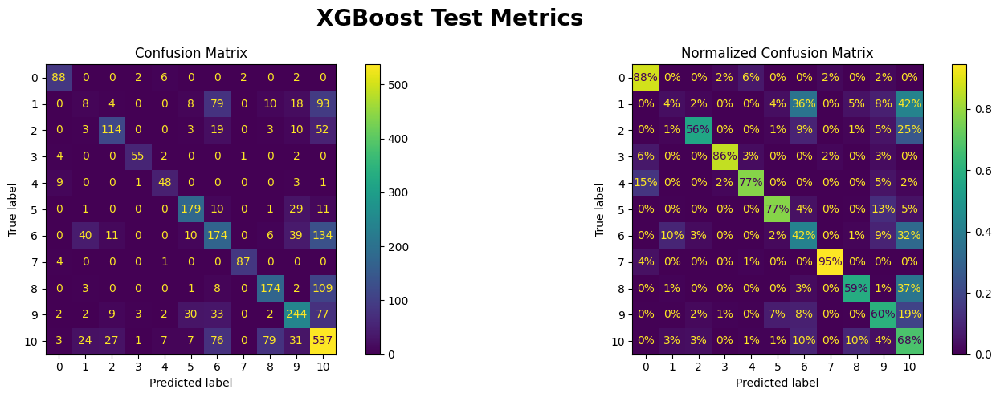


 XGBoost Classification Report: 
               precision    recall  f1-score   support

           0       0.80      0.88      0.84       100
           1       0.10      0.04      0.05       220
           2       0.69      0.56      0.62       204
           3       0.89      0.86      0.87        64
           4       0.73      0.77      0.75        62
           5       0.75      0.77      0.76       231
           6       0.44      0.42      0.43       414
           7       0.97      0.95      0.96        92
           8       0.63      0.59      0.61       297
           9       0.64      0.60      0.62       404
          10       0.53      0.68      0.59       792

    accuracy                           0.59      2880
   macro avg       0.65      0.65      0.65      2880
weighted avg       0.57      0.59      0.58      2880



In [ ]:
xgbPreds = xgb.predict(X_test)

make_classification_plots(xgbPreds, 'XGBoost')

In [ ]:
lgbm.fit(X_train, y_train)

test_performence(lgbm)

,Model Cross-Val Acc Scores,Model Cross-Val F1 Scores
count,3.000000,3.000000
mean,0.647099,0.639669
std,0.004375,0.005116
min,0.643564,0.634502
25%,0.644653,0.637137
50%,0.645741,0.639773
75%,0.648867,0.642253
max,0.651993,0.644733


,Model Cross-Val Predictions Scores
Accuracy,0.647100
Balanced Accuracy,0.688182
F1 Score,0.639745


[Summary Statistics]
Accuracy = 60.14% | Balanced Accuracy = 64.71% | Precision = 58.28% | Recall = 60.14% | F1-Score = 58.65%


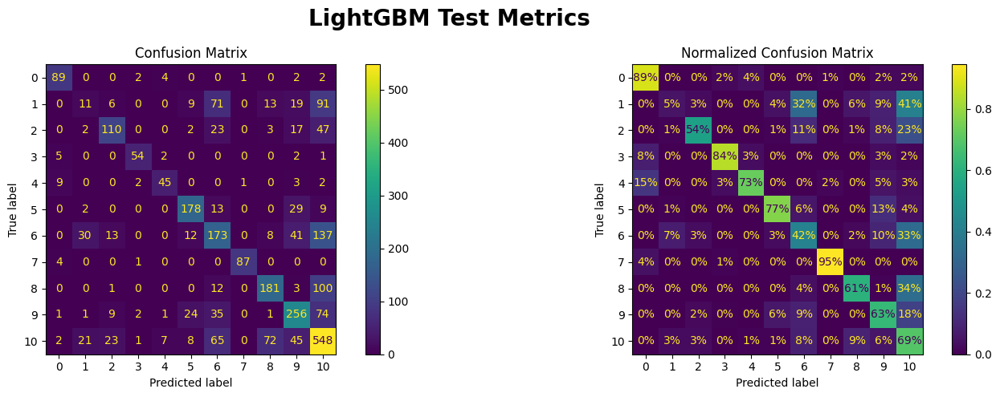


 LightGBM Classification Report: 
               precision    recall  f1-score   support

           0       0.81      0.89      0.85       100
           1       0.16      0.05      0.08       220
           2       0.68      0.54      0.60       204
           3       0.87      0.84      0.86        64
           4       0.76      0.73      0.74        62
           5       0.76      0.77      0.77       231
           6       0.44      0.42      0.43       414
           7       0.98      0.95      0.96        92
           8       0.65      0.61      0.63       297
           9       0.61      0.63      0.62       404
          10       0.54      0.69      0.61       792

    accuracy                           0.60      2880
   macro avg       0.66      0.65      0.65      2880
weighted avg       0.58      0.60      0.59      2880



In [ ]:
lgbmPreds = lgbm.predict(X_test)

make_classification_plots(lgbmPreds, 'LightGBM')

In [ ]:
cat.fit(X_train, y_train)

test_performence(cat)

/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/process_executor.py:752: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.



,Model Cross-Val Acc Scores,Model Cross-Val F1 Scores
count,3.000000,3.000000
mean,0.641716,0.632913
std,0.004413,0.003035
min,0.636624,0.629784
25%,0.640355,0.631447
50%,0.644085,0.633109
75%,0.644262,0.634477
max,0.644439,0.635845


,Model Cross-Val Predictions Scores
Accuracy,0.641716
Balanced Accuracy,0.684206
F1 Score,0.632949


[Summary Statistics]
Accuracy = 60.45% | Balanced Accuracy = 65.61% | Precision = 58.15% | Recall = 60.45% | F1-Score = 58.65%


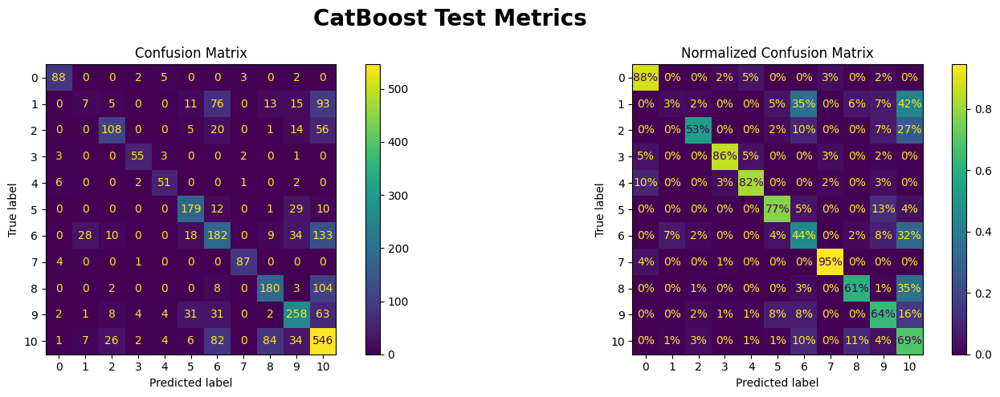


 CatBoost Classification Report: 
               precision    recall  f1-score   support

           0       0.85      0.88      0.86       100
           1       0.16      0.03      0.05       220
           2       0.68      0.53      0.60       204
           3       0.83      0.86      0.85        64
           4       0.76      0.82      0.79        62
           5       0.72      0.77      0.74       231
           6       0.44      0.44      0.44       414
           7       0.94      0.95      0.94        92
           8       0.62      0.61      0.61       297
           9       0.66      0.64      0.65       404
          10       0.54      0.69      0.61       792

    accuracy                           0.60      2880
   macro avg       0.65      0.66      0.65      2880
weighted avg       0.58      0.60      0.59      2880



In [ ]:
catPreds = cat.predict(X_test)

make_classification_plots(catPreds, 'CatBoost')

- **And from our Ensemble and Boosting Models, the `CatBoosting Classifier` is giving outstanding results along with the `LightGBM` and `Gradient Boosting`**

## **Fine-Tuning Best Models**

In [ ]:
from sklearn.model_selection import GridSearchCV

cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=0)

### **Logistic Regression**

In [ ]:
param_lr = [ {
                'penalty' : ['l2'],
                'C' : [0.001, 0.01, 0.1, 1, 10],
                'solver' : ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
                }
              ]

lr_classifier = LogisticRegression(random_state=0, max_iter=500)

lr_grid_search = GridSearchCV(estimator = lr_classifier,
                           param_grid = param_lr,
                           scoring = 'f1_weighted',
                           cv = cv,
                           verbose = 1,
                           n_jobs = -1)

lr_grid_search.fit(X_train, y_train)

In [ ]:
lr_grid_search.best_score_

In [ ]:
lr_grid_search.best_params_

In [ ]:
lr = LogisticRegression(random_state=0, max_iter=500, C = 10, penalty= 'l2', solver= 'newton-cg')

lr.fit(X_train, y_train)

LogisticRegression(C=10, max_iter=500, random_state=0, solver='newton-cg')

[Summary Statistics]
Accuracy = 56.28% | Balanced Accuracy = 59.99% | Precision = 52.22% | Recall = 56.28% | F1-Score = 53.70%


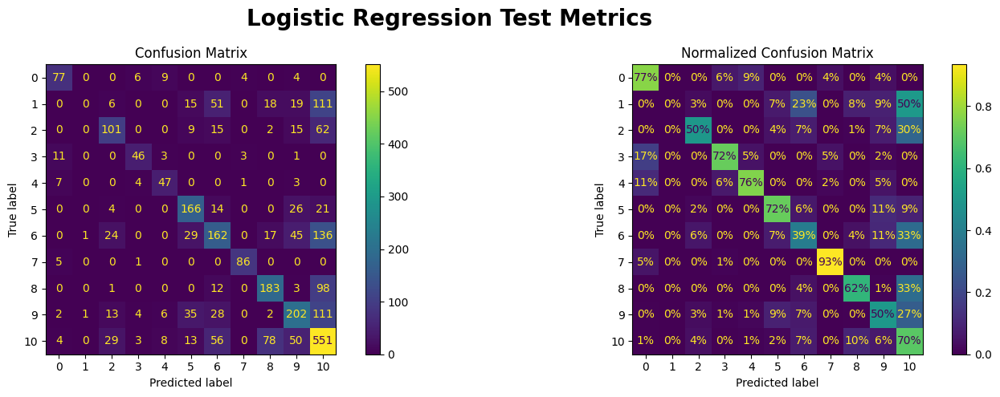


 Logistic Regression Classification Report: 
               precision    recall  f1-score   support

           0       0.73      0.77      0.75       100
           1       0.00      0.00      0.00       220
           2       0.57      0.50      0.53       204
           3       0.72      0.72      0.72        64
           4       0.64      0.76      0.70        62
           5       0.62      0.72      0.67       231
           6       0.48      0.39      0.43       414
           7       0.91      0.93      0.92        92
           8       0.61      0.62      0.61       297
           9       0.55      0.50      0.52       404
          10       0.51      0.70      0.59       792

    accuracy                           0.56      2880
   macro avg       0.58      0.60      0.59      2880
weighted avg       0.52      0.56      0.54      2880



In [ ]:
lrPreds = lr.predict(X_test)

make_classification_plots(lrPreds, 'Logistic Regression')

### **Gradient Boosting**

In [ ]:
parameters_gb = [{'learning_rate': [0.01, 0.1],
                'max_depth' : [5, 10, None],
                'n_estimators': [100,500]}]

gb_classifier = GradientBoostingClassifier(random_state=0)

gb_grid_search = GridSearchCV(estimator = gb_classifier,
                              param_grid = parameters_gb,
                              scoring = 'f1_weighted',
                              cv = cv,
                              n_jobs = -1,
                              verbose = 1)

gb_grid_search.fit(X_train, y_train)

In [ ]:
gb_grid_search.best_score_

In [ ]:
gb_grid_search.best_params_

In [ ]:
gb = GradientBoostingClassifier(random_state=0, learning_rate=0.1, n_estimators=100)

gb.fit(X_train, y_train)

GradientBoostingClassifier(random_state=0)

[Summary Statistics]
Accuracy = 60.56% | Balanced Accuracy = 63.95% | Precision = 57.10% | Recall = 60.56% | F1-Score = 58.26%


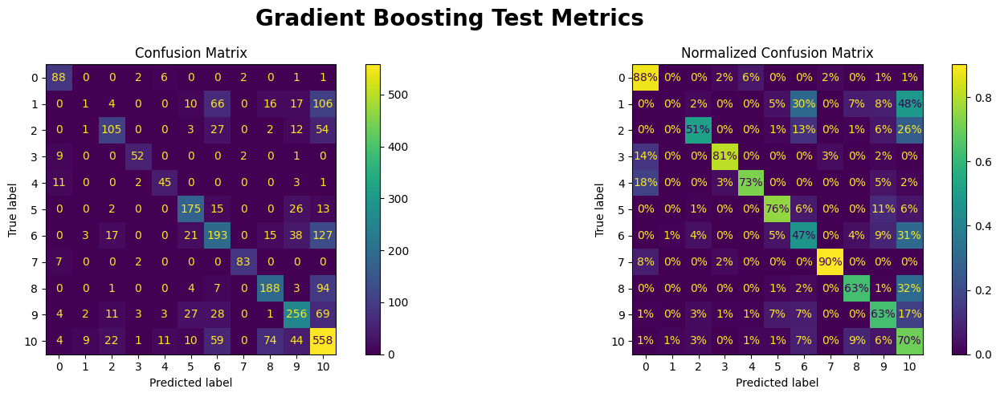


 Gradient Boosting Classification Report: 
               precision    recall  f1-score   support

           0       0.72      0.88      0.79       100
           1       0.06      0.00      0.01       220
           2       0.65      0.51      0.57       204
           3       0.84      0.81      0.83        64
           4       0.69      0.73      0.71        62
           5       0.70      0.76      0.73       231
           6       0.49      0.47      0.48       414
           7       0.95      0.90      0.93        92
           8       0.64      0.63      0.63       297
           9       0.64      0.63      0.64       404
          10       0.55      0.70      0.61       792

    accuracy                           0.61      2880
   macro avg       0.63      0.64      0.63      2880
weighted avg       0.57      0.61      0.58      2880



In [ ]:
gbPreds = gb.predict(X_test)

make_classification_plots(gbPreds, 'Gradient Boosting')

### **Hist Gradient Boosting**

In [ ]:
parameters_hgb = [{'learning_rate': [0.01, 0.1],
                'max_depth' : [5, 10, None],
                'l2_regularization': [0.001, 0.01, 0.1]}]

hgb_classifier = HistGradientBoostingClassifier(random_state=0)

hgb_grid_search = GridSearchCV(estimator = hgb_classifier,
                              param_grid = parameters_hgb,
                              scoring = 'f1_weighted',
                              cv = cv,
                              n_jobs = -1,
                              verbose = 1)

hgb_grid_search.fit(X_train, y_train)

Fitting 2 folds for each of 18 candidates, totalling 36 fits


GridSearchCV(cv=StratifiedKFold(n_splits=2, random_state=0, shuffle=True),
             estimator=HistGradientBoostingClassifier(random_state=0),
             n_jobs=-1,
             param_grid=[{'l2_regularization': [0.001, 0.01, 0.1],
                          'learning_rate': [0.01, 0.1],
                          'max_depth': [5, 10, 20]}],
             scoring='f1_weighted', verbose=1)

In [ ]:
hgb_grid_search.best_score_

In [ ]:
hgb_grid_search.best_params_

{'l2_regularization': 0.001, 'learning_rate': 0.1, 'max_depth': 5}

In [ ]:
hgb = HistGradientBoostingClassifier(random_state=0, learning_rate=0.01, l2_regularization=0.001)

hgb.fit(X_train, y_train)

HistGradientBoostingClassifier(l2_regularization=0.001, learning_rate=0.01,
                               random_state=0)

[Summary Statistics]
Accuracy = 59.38% | Balanced Accuracy = 62.04% | Precision = 59.11% | Recall = 59.38% | F1-Score = 57.03%


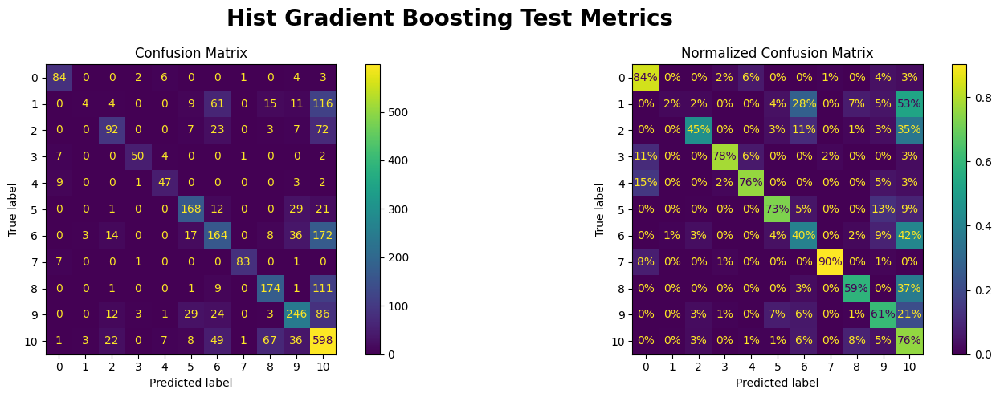


 Hist Gradient Boosting Classification Report: 
               precision    recall  f1-score   support

           0       0.78      0.84      0.81       100
           1       0.40      0.02      0.03       220
           2       0.63      0.45      0.53       204
           3       0.88      0.78      0.83        64
           4       0.72      0.76      0.74        62
           5       0.70      0.73      0.71       231
           6       0.48      0.40      0.43       414
           7       0.97      0.90      0.93        92
           8       0.64      0.59      0.61       297
           9       0.66      0.61      0.63       404
          10       0.51      0.76      0.61       792

    accuracy                           0.59      2880
   macro avg       0.67      0.62      0.62      2880
weighted avg       0.59      0.59      0.57      2880



In [ ]:
hgbPreds = hgb.predict(X_test)

make_classification_plots(hgbPreds, 'Hist Gradient Boosting')

### **LightGBM**

In [ ]:
param_grid = [
 {'num_leaves': [10, 20, 30], 'learning_rate' : [0.01, 0.1] ,
  'n_estimators' : [1000, 3000]},]

lgbm = LGBMClassifier(random_state=0)

lgbm_grid_search = GridSearchCV(estimator = lgbm,
                              param_grid = param_grid,
                              scoring = 'f1_weighted',
                              cv = cv,
                              n_jobs = -1,
                              verbose = 1)

lgbm_grid_search.fit(X_train, y_train)

Fitting 3 folds for each of 12 candidates, totalling 36 fits


GridSearchCV(cv=StratifiedKFold(n_splits=3, random_state=0, shuffle=True),
             estimator=LGBMClassifier(random_state=0), n_jobs=-1,
             param_grid=[{'learning_rate': [0.01, 0.1],
                          'n_estimators': [1000, 3000],
                          'num_leaves': [10, 20, 30]}],
             scoring='f1_weighted', verbose=1)

In [ ]:
lgbm_grid_search.best_score_

In [ ]:
lgbm_grid_search.best_params_

{'learning_rate': 0.01, 'n_estimators': 1000, 'num_leaves': 10}

In [ ]:
lgbm = LGBMClassifier(random_state=0, learning_rate=0.01, n_estimators=1000, num_leaves=10)

lgbm.fit(X_train, y_train)

LGBMClassifier(learning_rate=0.01, n_estimators=1000, num_leaves=10,
               random_state=0)

[Summary Statistics]
Accuracy = 61.63% | Balanced Accuracy = 66.25% | Precision = 60.06% | Recall = 61.63% | F1-Score = 59.52%


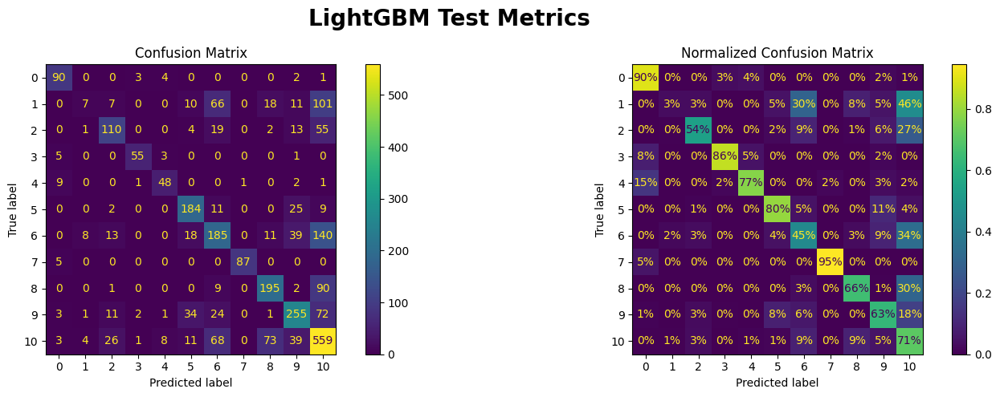


 LightGBM Classification Report: 
               precision    recall  f1-score   support

           0       0.78      0.90      0.84       100
           1       0.33      0.03      0.06       220
           2       0.65      0.54      0.59       204
           3       0.89      0.86      0.87        64
           4       0.75      0.77      0.76        62
           5       0.70      0.80      0.75       231
           6       0.48      0.45      0.46       414
           7       0.99      0.95      0.97        92
           8       0.65      0.66      0.65       297
           9       0.66      0.63      0.64       404
          10       0.54      0.71      0.61       792

    accuracy                           0.62      2880
   macro avg       0.68      0.66      0.66      2880
weighted avg       0.60      0.62      0.60      2880



In [ ]:
lgbmPreds = lgbm.predict(X_test)

make_classification_plots(lgbmPreds, 'LightGBM')

### **Cat Boosting**

In [ ]:
parameters_cat = [{'n_estimators': [1000,1500,2000],
                'learning_rate': [0.01, 0.05 ,0.1]}]

cat_classifier = CatBoostClassifier(random_state=0)

cat_grid_search = GridSearchCV(estimator = cat_classifier,
                              param_grid = parameters_cat,
                              scoring = 'f1_weighted',
                              cv = cv,
                              n_jobs = -1,
                              verbose = 1)

cat_grid_search.fit(X_train, y_train)

In [ ]:
cat_grid_search.best_score_

In [ ]:
cat_grid_search.best_params_

In [ ]:
cat = CatBoostClassifier(n_estimators=1500, learning_rate=0.05, random_state=0, eval_metric= 'MultiClass')

cat.fit(X_train, y_train)

0:	learn: 2.2820897	total: 60.1ms	remaining: 1m 30s
1:	learn: 2.1919184	total: 129ms	remaining: 1m 36s
2:	learn: 2.1154074	total: 188ms	remaining: 1m 33s
3:	learn: 2.0489766	total: 241ms	remaining: 1m 30s
4:	learn: 1.9848787	total: 299ms	remaining: 1m 29s
5:	learn: 1.9309264	total: 351ms	remaining: 1m 27s
6:	learn: 1.8892865	total: 405ms	remaining: 1m 26s
7:	learn: 1.8471959	total: 456ms	remaining: 1m 25s
8:	learn: 1.8054254	total: 522ms	remaining: 1m 26s
9:	learn: 1.7694302	total: 574ms	remaining: 1m 25s
10:	learn: 1.7380317	total: 637ms	remaining: 1m 26s
11:	learn: 1.7081379	total: 689ms	remaining: 1m 25s
12:	learn: 1.6804172	total: 743ms	remaining: 1m 24s
13:	learn: 1.6541883	total: 803ms	remaining: 1m 25s
14:	learn: 1.6271418	total: 857ms	remaining: 1m 24s
15:	learn: 1.6080923	total: 922ms	remaining: 1m 25s
16:	learn: 1.5866952	total: 978ms	remaining: 1m 25s
17:	learn: 1.5646568	total: 1.03s	remaining: 1m 24s
18:	learn: 1.5461574	total: 1.08s	remaining: 1m 24s
19:	learn: 1.5276555	

[Summary Statistics]
Accuracy = 60.76% | Balanced Accuracy = 65.71% | Precision = 58.00% | Recall = 60.76% | F1-Score = 58.85%


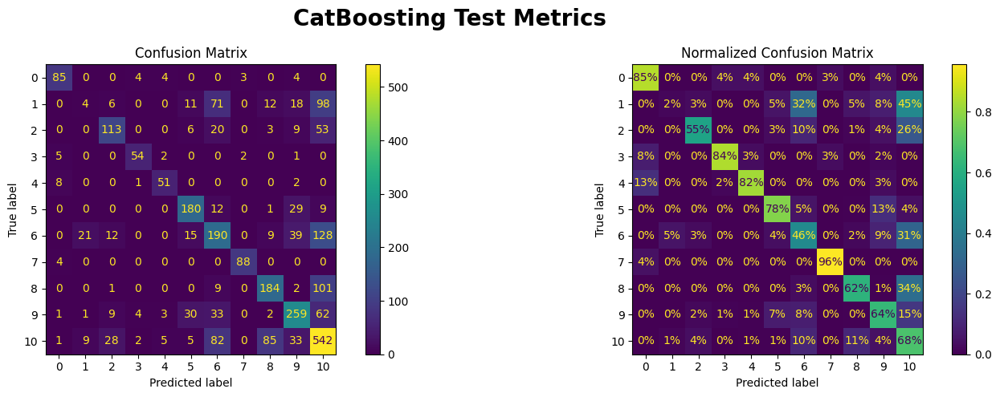


 CatBoosting Classification Report: 
               precision    recall  f1-score   support

           0       0.82      0.85      0.83       100
           1       0.11      0.02      0.03       220
           2       0.67      0.55      0.61       204
           3       0.83      0.84      0.84        64
           4       0.78      0.82      0.80        62
           5       0.73      0.78      0.75       231
           6       0.46      0.46      0.46       414
           7       0.95      0.96      0.95        92
           8       0.62      0.62      0.62       297
           9       0.65      0.64      0.65       404
          10       0.55      0.68      0.61       792

    accuracy                           0.61      2880
   macro avg       0.65      0.66      0.65      2880
weighted avg       0.58      0.61      0.59      2880



In [ ]:
catPreds = cat.predict(X_test)

make_classification_plots(catPreds, 'CatBoosting')

## **Boosting Fine-Tuned Models**

In [ ]:
from sklearn.ensemble import VotingClassifier, StackingClassifier

In [ ]:
lr = LogisticRegression(random_state=0, max_iter=500, C = 10, penalty= 'l2', solver= 'newton-cg')

mlp = MLPClassifier(random_state=0, hidden_layer_sizes = (512,) , max_iter=100, early_stopping=True,
                    solver='adam', learning_rate = 'adaptive', alpha=0.001, activation='relu', batch_size=128)

gb = GradientBoostingClassifier(random_state=0, learning_rate=0.1, n_estimators=100)

hgb = HistGradientBoostingClassifier(random_state=0, learning_rate=0.01, l2_regularization=0.001)

lgbm = LGBMClassifier(random_state=0, learning_rate=0.01, n_estimators=1000, num_leaves=10)

cat = CatBoostClassifier(n_estimators=1500, learning_rate=0.05, random_state=0, eval_metric= 'MultiClass')

In [ ]:
estimators = [
              ('gb', gb),
              ('lgbm', lgbm),
              ('cat', cat),
             ]

stack_model = StackingClassifier(estimators=estimators, final_estimator = lr
                                 ,n_jobs =-1, verbose = False, passthrough=True)

stack_model.fit(X_train, y_train)

StackingClassifier(estimators=[('gb',
                                GradientBoostingClassifier(random_state=0)),
                               ('lgbm',
                                LGBMClassifier(learning_rate=0.01,
                                               n_estimators=1000, num_leaves=10,
                                               random_state=0)),
                               ('cat',
                                <catboost.core.CatBoostClassifier object at 0x79ae7c2a20b0>)],
                   final_estimator=LogisticRegression(C=10, max_iter=500,
                                                      random_state=0,
                                                      solver='newton-cg'),
                   n_jobs=-1, passthrough=True, verbose=False)

[Summary Statistics]
Accuracy = 61.94% | Balanced Accuracy = 66.52% | Precision = 60.06% | Recall = 61.94% | F1-Score = 60.12%


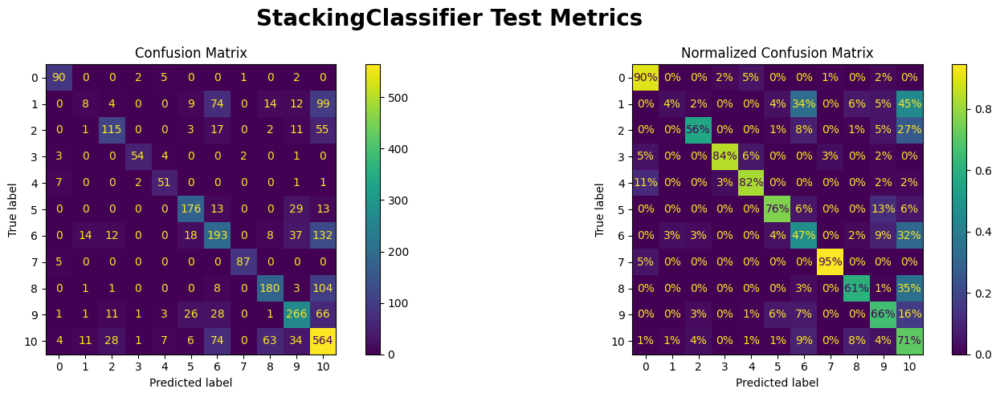


 StackingClassifier Classification Report: 
               precision    recall  f1-score   support

           0       0.82      0.90      0.86       100
           1       0.22      0.04      0.06       220
           2       0.67      0.56      0.61       204
           3       0.90      0.84      0.87        64
           4       0.73      0.82      0.77        62
           5       0.74      0.76      0.75       231
           6       0.47      0.47      0.47       414
           7       0.97      0.95      0.96        92
           8       0.67      0.61      0.64       297
           9       0.67      0.66      0.66       404
          10       0.55      0.71      0.62       792

    accuracy                           0.62      2880
   macro avg       0.67      0.67      0.66      2880
weighted avg       0.60      0.62      0.60      2880



In [ ]:
StackPreds = stack_model.predict(X_test)

make_classification_plots(StackPreds, 'StackingClassifier')

In [ ]:
estimators = [
              ('hgb', hgb),
              ('gb', gb),
              ('lgbm', lgbm),
              ('cat', cat),
             ]

voting_model = VotingClassifier(estimators=estimators, n_jobs =-1, verbose = False, voting = 'soft')

voting_model.fit(X_train,y_train)

VotingClassifier(estimators=[('hgb',
                              HistGradientBoostingClassifier(l2_regularization=0.001,
                                                             learning_rate=0.01,
                                                             random_state=0)),
                             ('gb', GradientBoostingClassifier(random_state=0)),
                             ('lgbm',
                              LGBMClassifier(learning_rate=0.01,
                                             n_estimators=1000, num_leaves=10,
                                             random_state=0)),
                             ('cat',
                              <catboost.core.CatBoostClassifier object at 0x79ae7c2a20b0>)],
                 n_jobs=-1, voting='soft')

[Summary Statistics]
Accuracy = 61.98% | Balanced Accuracy = 66.04% | Precision = 60.72% | Recall = 61.98% | F1-Score = 59.72%


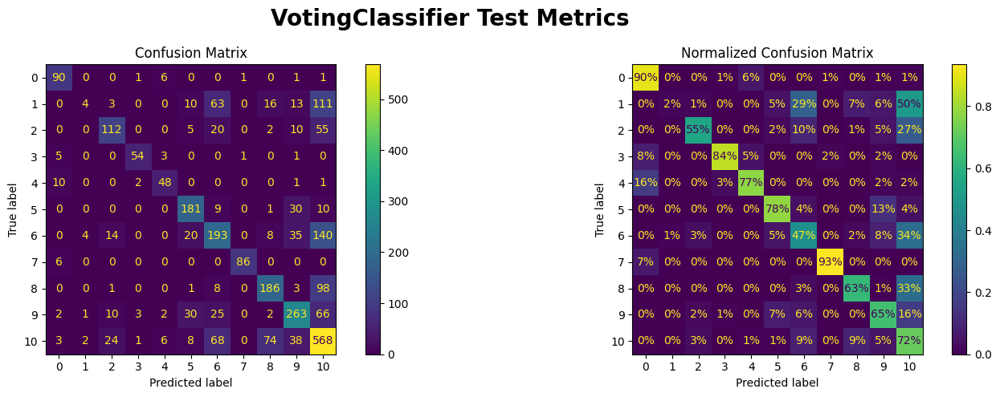


 VotingClassifier Classification Report: 
               precision    recall  f1-score   support

           0       0.78      0.90      0.83       100
           1       0.36      0.02      0.03       220
           2       0.68      0.55      0.61       204
           3       0.89      0.84      0.86        64
           4       0.74      0.77      0.76        62
           5       0.71      0.78      0.74       231
           6       0.50      0.47      0.48       414
           7       0.98      0.93      0.96        92
           8       0.64      0.63      0.63       297
           9       0.67      0.65      0.66       404
          10       0.54      0.72      0.62       792

    accuracy                           0.62      2880
   macro avg       0.68      0.66      0.65      2880
weighted avg       0.61      0.62      0.60      2880



In [ ]:
votingPreds = voting_model.predict(X_test)

make_classification_plots(votingPreds, 'VotingClassifier')

In [ ]:
modeling_pipeline = Pipeline([
    ("Preprocessing_Pipeline", preprocessing_pipeline),
    ("Classifier", stack_model),
])

In [ ]:
X_all = makeNewFeatures(pd.DataFrame(nullImputer.fit_transform(X), columns= nullImputer.get_feature_names_out()))

modeling_pipeline.fit(X_all, y)

/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/process_executor.py:752: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.



Pipeline(steps=[('Preprocessing_Pipeline',
                 Pipeline(steps=[('Target Encoding',
                                  Pipeline(steps=[('leaveoneoutencoder',
                                                   LeaveOneOutEncoder(cols=['Artist '
                                                                            'Name',
                                                                            'Track '
                                                                            'Name']))])),
                                 ('Categorical Encoder',
                                  ColumnTransformer(remainder='passthrough',
                                                    transformers=[('onehotencoder',
                                                                   OneHotEncoder(sparse_output=False),
                                                                   ['key',
                                                                    'time_signature',
                                                                    'Relevancy',
                                                                    'mood',
                                                                    'ty...
                 StackingClassifier(estimators=[('gb',
                                                 GradientBoostingClassifier(random_state=0)),
                                                ('lgbm',
                                                 LGBMClassifier(learning_rate=0.01,
                                                                n_estimators=1000,
                                                                num_leaves=10,
                                                                random_state=0)),
                                                ('cat',
                                                 <catboost.core.CatBoostClassifier object at 0x79ae7c2a20b0>)],
                                    final_estimator=LogisticRegression(C=10,
                                                                       max_iter=500,
                                                                       random_state=0,
                                                                       solver='newton-cg'),
                                    n_jobs=-1, passthrough=True,
                                    verbose=False))])

In [ ]:
modeling_pipeline.score(X_all,y)

0.7380522367324257

## **Categorical Boosting Modeling**

- **We tried various target encoding techniques, now let's try CatBoost Internal Ordered Target Encoding that can be used when fitting the model.**

In [ ]:
catboost_train = org_df.copy()

catboost_train

,Artist Name,Track Name,Popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_in min/ms,time_signature,Class
0,Marina Maximilian,Not Afraid,37.0,0.334,0.536,9.0,-6.649,0,0.0381,0.378000,NaN,0.1060,0.235,152.429,204947.000000,4,9
1,The Black Keys,Howlin' for You,67.0,0.725,0.747,11.0,-5.545,1,0.0876,0.027200,0.046800,0.1040,0.380,132.921,191956.000000,4,6
2,Royal & the Serpent,phuck u,NaN,0.584,0.804,7.0,-6.094,1,0.0619,0.000968,0.635000,0.2840,0.635,159.953,161037.000000,4,10
3,Detroit Blues Band,Missing You,12.0,0.515,0.308,NaN,-14.711,1,0.0312,0.907000,0.021300,0.3000,0.501,172.472,298093.000000,3,2
4,Coast Contra,My Lady,48.0,0.565,0.777,6.0,-5.096,0,0.2490,0.183000,NaN,0.2110,0.619,88.311,254145.000000,4,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14391,NOISY,I Wish I Was A...,47.0,0.607,0.946,1.0,-2.965,1,0.1500,0.005480,0.000390,0.2780,0.653,120.011,195181.000000,4,10
14392,BLOODSPOT,Deadline Story (feat. Patrick Boos),27.0,0.435,0.951,8.0,-7.475,1,0.0576,0.000005,0.550000,0.0952,0.203,135.034,282043.000000,4,8
14393,Cold Years,Too Far Gone,22.0,0.415,0.941,11.0,-4.300,1,0.0524,0.001810,0.000004,0.3370,0.572,167.978,176529.000000,4,10
14394,The Jaded Hearts Club,Reach Out I'll Be There,37.0,0.493,0.986,1.0,-2.279,1,0.0917,0.000967,0.006620,0.1230,0.567,122.036,186307.000000,4,10


In [ ]:
catFeatures = ['Artist Name','Track Name']

for col in catFeatures:
  catboost_train[col] = catboost_train[col].astype('str')

catboost_train.dtypes

Artist Name            object
Track Name             object
Popularity            float64
danceability          float64
energy                float64
key                   float64
loudness              float64
mode                    int64
speechiness           float64
acousticness          float64
instrumentalness      float64
liveness              float64
valence               float64
tempo                 float64
duration_in min/ms    float64
time_signature          int64
Class                   int64
dtype: object

In [ ]:
catCols_transformer = make_column_transformer((OneHotEncoder(sparse_output=False), ['key','time_signature','Relevancy','mood','type']),
                                               (PowerTransformer(copy=False), skewedFeatures),
                                              remainder = 'passthrough', verbose_feature_names_out=False
                                            )

catboost_pipeline = Pipeline([
                            ("Categorical Encoder", catCols_transformer),
                            ("Scaler", RobustScaler())
                            ])

In [ ]:
X = catboost_train.drop(columns='Class')

y = catboost_train['Class']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, stratify= y, random_state=0)

y_train.reset_index(drop=True, inplace=True)
y_test.reset_index(drop=True, inplace=True)

X_train.shape, y_train.shape, X_test.shape, y_test.shape

((12956, 16), (12956,), (1440, 16), (1440,))

In [ ]:
X_train = makeNewFeatures(pd.DataFrame(nullImputer.fit_transform(X_train), columns= nullImputer.get_feature_names_out()))

X_train

,Popularity,danceability,energy,key,loudness,modality,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_in min/ms,time_signature,Artist Name,Track Name,duration_ms,Relevancy,type,mood,instrumental,live,ArtistName_Lenght,TracktName_Lenght,ArtistName_Words,TracktName_Words,ArtistPopularity,ArtistTracksDuration,ArtistTracksAcousticness,ArtistTracksSpeechiness,ArtistTracksMood
0,32.0,0.248,0.461,6.0,-10.009,0.0,0.0404,0.0339,0.738,0.114,0.0372,127.615,383920.0,4.0,Mogwai,Donuts,383920.0,Comman,Music,Sad,1,0,6,6,1,1,38.000000,340035.666667,0.022732,0.037567,0.062133
1,26.0,0.117,0.976,9.0,-6.008,1.0,0.124,0.000008,0.787,0.0839,0.118,80.044,397707.0,1.0,Old Man's Child,Seeds Of The Ancient Gods,397707.0,Comman,Music,Sad,1,0,15,25,3,5,26.000000,397707.000000,0.000008,0.124000,0.118000
2,47.0,0.419,0.573,8.0,-9.166,1.0,0.0321,0.00026,0.609,0.597,0.165,145.637,392000.0,4.0,Monster Magnet,Look To Your Orb For The Warning,392000.0,Comman,Music,Sad,1,1,14,32,2,7,47.625000,323155.250000,0.000565,0.040975,0.328250
3,34.0,0.415,0.245,2.0,-13.207,1.0,0.0282,0.496,0.00402,0.157,0.612,90.861,5.841117,4.0,"Sushma Shrestha, Padmini Kolhapure, R. D. Burman",Teri Hai Zameen Tera Aasman,350467.00002,Comman,Music,Normal,0,0,48,27,7,5,34.000000,350467.000020,0.496000,0.028200,0.612000
4,39.0,0.654,0.616,9.0,-9.803,1.0,0.0569,0.0704,0.297,0.198,0.759,123.437,317820.0,4.0,Joe Louis Walker,Old Time Used to Be,317820.0,Comman,Music,Happy,0,0,16,19,3,5,29.333333,272764.000000,0.104567,0.082500,0.792333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12951,45.0,0.754,0.497,4.0,-11.14,1.0,0.039,0.368,0.00402,0.193,0.789,95.502,2.82245,4.0,Merle Haggard,The Fightin' Side Of Me,169347.0,Comman,Music,Happy,0,0,13,23,2,5,44.000000,218338.800000,0.455580,0.033720,0.608800
12952,12.0,0.426,0.426,7.0,-10.955,0.0,0.0545,0.455,0.00402,0.256,0.506,115.618,3.680217,4.0,Mohammed Rafi,Khush Rahe Tu Sada,220813.00002,Uncomman,Music,Normal,0,0,13,18,2,4,15.500000,305057.071436,0.788429,0.068800,0.658143
12953,79.0,0.691,0.814,1.0,-3.788,0.0,0.117,0.0164,0.00402,0.366,0.509,132.012,145611.0,4.0,SyKo,#BrooklynBloodPop!,145611.0,Trendy,Music,Normal,0,0,4,18,1,1,79.000000,145611.000000,0.016400,0.117000,0.509000
12954,37.0,0.426,0.787,7.0,-6.053,1.0,0.0408,0.000279,0.154,0.0614,0.477,138.19,218720.0,4.0,Fu Manchu,Time Is Going On,218720.0,Comman,Music,Normal,0,0,9,16,2,4,42.500000,196843.250000,0.000215,0.073800,0.459250


In [ ]:
X_test = makeNewFeatures(pd.DataFrame(nullImputer.transform(X_test), columns= nullImputer.get_feature_names_out()))

X_test

,Popularity,danceability,energy,key,loudness,modality,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_in min/ms,time_signature,Artist Name,Track Name,duration_ms,Relevancy,type,mood,instrumental,live,ArtistName_Lenght,TracktName_Lenght,ArtistName_Words,TracktName_Words,ArtistPopularity,ArtistTracksDuration,ArtistTracksAcousticness,ArtistTracksSpeechiness,ArtistTracksMood
0,46.0,0.78,0.733,1.0,-5.958,1.0,0.0781,0.033,0.00402,0.231,0.746,129.938,140445.0,4.0,Skrizzly Adams,Bad Desires,140445.0,Comman,Music,Happy,0,0,14,11,2,2,46.000000,140445.000000,0.033000,0.078100,0.7460
1,73.0,0.875,0.649,6.0,-5.754,1.0,0.0433,0.429,0.00237,0.0704,0.833,140.031,194693.0,4.0,Dayglow,Close To You,194693.0,Popular,Music,Happy,0,0,7,12,1,3,53.666667,210817.666667,0.156300,0.037367,0.7110
2,38.0,0.486,0.908,2.0,-4.43,1.0,0.0369,0.0023,0.24,0.389,0.241,89.991,216667.0,4.0,Amber Run,Neon Circus,216667.0,Comman,Music,Sad,0,0,9,11,2,2,38.000000,216667.000000,0.002300,0.036900,0.2410
3,24.0,0.19,0.0748,2.0,-20.995,1.0,0.0452,0.937,0.697,0.169,0.0366,112.111,8.978,3.0,"Pyotr Ilyich Tchaikovsky, The Russian Virtuosi...","Serenade for String Orchestra in C Major, Op. ...",538680.0,Uncomman,Music,Sad,1,0,70,68,10,13,24.000000,538680.000000,0.937000,0.045200,0.0366
4,56.0,0.384,0.366,7.0,-10.65,1.0,0.0329,0.371,0.000092,0.101,0.199,138.134,4.356167,4.0,"Rhiannon Giddens, Iron & Wine",Forever Young - From NBC's Parenthood,261370.0002,Popular,Music,Sad,0,0,29,37,5,6,56.000000,261370.000200,0.371000,0.032900,0.1990
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1435,55.0,0.42,0.949,7.0,-6.214,1.0,0.189,0.000181,0.00498,0.101,0.171,77.064,227379.0,4.0,Solence,Deafening,227379.0,Popular,Music,Sad,0,0,7,9,1,1,55.000000,227379.000000,0.000181,0.189000,0.1710
1436,19.0,0.551,0.616,6.0,-10.415,0.0,0.0533,0.0179,0.228,0.321,0.443,111.127,145307.0,4.0,Los Lobos,Two Dogs And A Bone,145307.0,Uncomman,Music,Normal,0,0,9,19,2,5,19.000000,145307.000000,0.017900,0.053300,0.4430
1437,30.0,0.169,0.0612,3.0,-22.327,1.0,0.0397,0.846,0.719,0.0976,0.0337,74.525,2.535117,4.0,"Calum Martin, Craig Armstrong, Cecilia Weston,...",Ballantyne - Movement 5 Your Shadow,152107.00002,Comman,Music,Sad,1,0,78,35,10,6,30.000000,152107.000020,0.846000,0.039700,0.0337
1438,37.0,0.571,0.639,9.0,-6.242,1.0,0.0481,0.101,0.428,0.121,0.341,94.946,234424.0,4.0,Gemma Griffiths,Ndinewe,234424.0,Comman,Music,Normal,0,0,15,7,2,1,37.000000,234424.000000,0.101000,0.048100,0.3410


In [ ]:
X_train_cat = catboost_pipeline.fit_transform(X_train.drop(columns=catFeatures))

X_train_cat = pd.DataFrame(X_train_cat, columns= catboost_pipeline[0].get_feature_names_out())

X_train_cat[catFeatures] = X_train[catFeatures].reset_index(drop=True)

X_train_cat

,key_1.0,key_2.0,key_3.0,key_4.0,key_5.0,key_6.0,key_7.0,key_8.0,key_9.0,key_10.0,key_11.0,time_signature_1.0,time_signature_3.0,time_signature_4.0,time_signature_5.0,Relevancy_Comman,Relevancy_Popular,Relevancy_Trendy,Relevancy_Uncomman,mood_Happy,mood_Normal,mood_Sad,type_Mix,type_Music,type_Speech,...,duration_ms,ArtistTracksDuration,ArtistTracksSpeechiness,speechiness,ArtistName_Words,liveness,TracktName_Lenght,TracktName_Words,instrumentalness,ArtistTracksAcousticness,acousticness,loudness,Popularity,danceability,energy,modality,valence,tempo,duration_in min/ms,instrumental,live,ArtistPopularity,ArtistTracksMood,Artist Name,Track Name
0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,1.538747,1.328381,-0.380433,-0.174058,-1.000000,-0.128664,-0.996650,-1.547600,2.530282,-0.396112,-0.181320,-0.594292,-0.521739,-1.320000,-0.674221,-1.0,-1.184450,0.179634,2.024864,1.0,0.0,-0.278146,-1.443084,Mogwai,Donuts
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,1.628250,1.784687,1.052492,1.068334,0.545301,-0.428659,0.681230,0.719767,2.535413,-0.504406,-0.333964,0.249685,-0.782609,-1.902222,0.784703,0.0,-0.967828,-0.951004,2.184456,1.0,0.0,-0.834437,-1.253061,Old Man's Child,Seeds Of The Ancient Gods
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,1.591691,1.175506,-0.274488,-0.423494,0.000000,1.296007,0.967004,1.162027,2.507737,-0.501634,-0.332745,-0.444432,0.130435,-0.560000,-0.356941,0.0,-0.841823,0.607969,2.118395,1.0,1.0,0.168046,-0.537925,Monster Magnet,Look To Your Orb For The Warning
3,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,1.303297,1.418029,-0.707027,-0.553890,1.461617,0.209235,0.770665,0.719767,0.000000,0.665595,0.742111,-1.076923,-0.434783,-0.577778,-1.286119,0.0,0.356568,-0.693912,-2.419152,0.0,0.0,-0.463576,0.427211,"Sushma Shrestha, Padmini Kolhapure, R. D. Burman",Teri Hai Zameen Tera Aasman
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,1.043936,0.649753,0.615199,0.226415,0.545301,0.456080,0.360159,0.719767,2.262848,-0.075451,-0.039340,-0.558720,-0.217391,0.484444,-0.235127,0.0,0.750670,0.080334,1.259721,0.0,0.0,-0.679912,1.040590,Joe Louis Walker,Old Time Used to Be
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12951,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,-0.808931,-0.081370,-0.507980,-0.213627,0.000000,0.429222,0.584015,0.719767,0.000000,0.622648,0.609377,-0.778842,0.043478,0.928889,-0.572238,0.0,0.831099,-0.583608,-2.419187,0.0,0.0,0.000000,0.416327,Merle Haggard,The Fightin' Side Of Me
12952,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.012438,0.999690,0.389032,0.175028,0.000000,0.715093,0.296570,0.410993,0.000000,0.874112,0.704996,-0.749820,-1.391304,-0.528889,-0.773371,-1.0,0.072386,-0.105503,-2.419177,0.0,0.0,-1.321192,0.584159,Mohammed Rafi,Khush Rahe Tu Sada
12953,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,-1.304581,-1.541071,0.998226,1.017583,-1.000000,1.021376,0.296570,-1.547600,0.000000,-0.425324,-0.257397,0.950922,1.521739,0.648889,0.325779,-1.0,0.080429,0.284139,-0.733693,0.0,0.0,1.622517,0.076871,SyKo,#BrooklynBloodPop!
12954,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,-0.015987,-0.438466,0.477799,-0.162929,0.000000,-0.696190,0.157750,0.410993,1.769386,-0.503375,-0.332653,0.237820,-0.304348,-0.528889,0.249292,0.0,-0.005362,0.430974,0.112584,0.0,0.0,-0.069536,-0.092347,Fu Manchu,Time Is Going On


In [ ]:
X_test_cat = catboost_pipeline.transform(X_test)

X_test_cat = pd.DataFrame(X_test_cat, columns= catboost_pipeline[0].get_feature_names_out())

X_test_cat[catFeatures] = X_test[catFeatures].reset_index(drop=True)

X_test_cat

,key_1.0,key_2.0,key_3.0,key_4.0,key_5.0,key_6.0,key_7.0,key_8.0,key_9.0,key_10.0,key_11.0,time_signature_1.0,time_signature_3.0,time_signature_4.0,time_signature_5.0,Relevancy_Comman,Relevancy_Popular,Relevancy_Trendy,Relevancy_Uncomman,mood_Happy,mood_Normal,mood_Sad,type_Mix,type_Music,type_Speech,...,duration_ms,ArtistTracksDuration,ArtistTracksSpeechiness,speechiness,ArtistName_Words,liveness,TracktName_Lenght,TracktName_Words,instrumentalness,ArtistTracksAcousticness,acousticness,loudness,Popularity,danceability,energy,modality,valence,tempo,duration_in min/ms,instrumental,live,ArtistPopularity,ArtistTracksMood,Artist Name,Track Name
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,-1.426310,-1.679847,0.548267,0.599354,0.000000,0.614316,-0.285326,-0.589007,0.000000,-0.350241,-0.185097,0.262954,0.086957,1.044444,0.096317,0.0,0.715818,0.234845,-0.793492,0.0,0.0,0.092715,0.882993,Skrizzly Adams,Bad Desires
1,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,-0.369556,-0.200939,-0.386851,-0.095107,-1.000000,-0.584223,-0.182372,0.000000,-0.035850,0.083208,0.679022,0.318064,1.260870,1.466667,-0.141643,0.0,0.949062,0.474729,-0.165542,0.0,0.0,0.448124,0.763946,Dayglow,Close To You
2,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,-0.044210,-0.107483,-0.401916,-0.274831,0.000000,1.065205,-0.285326,-0.589007,2.127581,-0.493037,-0.322931,0.720362,-0.260870,-0.262222,0.592068,0.0,-0.638070,-0.714590,0.088819,0.0,0.0,-0.278146,-0.834694,Amber Run,Neon Circus
3,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-1.0,0.0,-1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,...,2.362205,2.610949,-0.151740,-0.045504,1.746559,0.288118,1.816261,1.885310,2.524801,0.937008,0.963526,-1.914475,-0.869565,-1.577778,-1.768272,0.0,-1.186059,-0.188855,-2.419116,1.0,0.0,-0.927152,-1.529932,"Pyotr Ilyich Tchaikovsky, The Russian Virtuosi...","Serenade for String Orchestra in C Major, Op. ..."
4,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.503258,0.513251,-0.536320,-0.397837,1.138270,-0.250896,1.133473,0.963276,-0.086280,0.515677,0.613119,-0.701013,0.521739,-0.715556,-0.943343,0.0,-0.750670,0.429643,-2.419170,0.0,0.0,0.556291,-0.977551,"Rhiannon Giddens, Iron & Wine",Forever Young - From NBC's Parenthood
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1435,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.099417,0.055487,1.346929,1.345715,-1.000000,-0.250896,-0.522397,-1.547600,0.020603,-0.503543,-0.333127,0.195960,0.478261,-0.555556,0.708215,0.0,-0.825737,-1.021830,0.212816,0.0,0.0,0.509934,-1.072789,Solence,Deafening
1436,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,-1.311590,-1.549060,0.059478,0.148527,0.000000,0.918195,0.360159,0.719767,2.090897,-0.418339,-0.250654,-0.662560,-1.086957,0.026667,-0.235127,-1.0,-0.096515,-0.212243,-0.737212,0.0,0.0,-1.158940,-0.147619,Los Lobos,Two Dogs And A Bone
1437,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,-1.159149,-1.375343,-0.313371,-0.193721,1.746559,-0.284640,1.069905,0.963276,2.527895,0.900881,0.935243,-2.028152,-0.608696,-1.671111,-1.806799,0.0,-1.193834,-1.082176,-2.419191,1.0,0.0,-0.649007,-1.539796,"Calum Martin, Craig Armstrong, Cecilia Weston,...",Ballantyne - Movement 5 Your Shadow
1438,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.189230,0.157350,-0.072636,0.027115,0.000000,-0.067052,-0.817459,-1.547600,2.425563,-0.087500,0.064586,0.188772,-0.304348,0.115556,-0.169972,0.0,-0.369973,-0.596822,0

> **We will pass the high cardanilty features that needs to be target encoded for catboost to encode them.**

In [ ]:
cat = CatBoostClassifier(n_estimators=1500, random_state=0, learning_rate=0.05,
                         eval_metric= 'MultiClass', cat_features = catFeatures)

cat.fit(X_train_cat, y_train, early_stopping_rounds=50, eval_set=(X_test_cat, y_test), use_best_model=True)

[Summary Statistics]
Accuracy = 70.07% | Balanced Accuracy = 73.70% | Precision = 69.85% | Recall = 70.07% | F1-Score = 68.82%


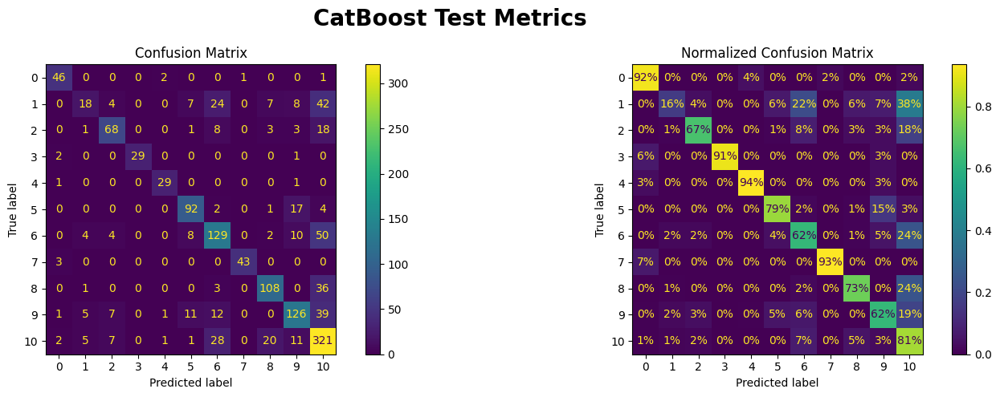


 CatBoost Classification Report: 
               precision    recall  f1-score   support

           0       0.84      0.92      0.88        50
           1       0.53      0.16      0.25       110
           2       0.76      0.67      0.71       102
           3       1.00      0.91      0.95        32
           4       0.88      0.94      0.91        31
           5       0.77      0.79      0.78       116
           6       0.63      0.62      0.62       207
           7       0.98      0.93      0.96        46
           8       0.77      0.73      0.75       148
           9       0.71      0.62      0.66       202
          10       0.63      0.81      0.71       396

    accuracy                           0.70      1440
   macro avg       0.77      0.74      0.74      1440
weighted avg       0.70      0.70      0.69      1440



In [ ]:
catPreds = cat.predict(X_test_cat)

make_classification_plots(catPreds, 'CatBoost')

- **Outstandingly, the performence increased nearly 10% from our best model!.**

In [ ]:
X_all = makeNewFeatures(pd.DataFrame(nullImputer.fit_transform(X), columns= nullImputer.get_feature_names_out()))

X_cat = catboost_pipeline.fit_transform(X_all.drop(columns=catFeatures), y)

X_cat = pd.DataFrame(X_cat, columns= catboost_pipeline[0].get_feature_names_out())

X_cat[catFeatures] = X_all[catFeatures].reset_index(drop=True)

X_cat

,key_1.0,key_2.0,key_3.0,key_4.0,key_5.0,key_6.0,key_7.0,key_8.0,key_9.0,key_10.0,key_11.0,time_signature_1.0,time_signature_3.0,time_signature_4.0,time_signature_5.0,Relevancy_Comman,Relevancy_Popular,Relevancy_Trendy,Relevancy_Uncomman,mood_Happy,mood_Normal,mood_Sad,type_Mix,type_Music,type_Speech,...,duration_ms,ArtistTracksDuration,ArtistTracksSpeechiness,speechiness,ArtistName_Words,liveness,TracktName_Lenght,TracktName_Words,instrumentalness,ArtistTracksAcousticness,acousticness,loudness,Popularity,danceability,energy,modality,valence,tempo,duration_in min/ms,instrumental,live,ArtistPopularity,ArtistTracksMood,Artist Name,Track Name
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,-0.210008,-0.080174,-0.376003,-0.240195,0.000000,-0.202039,-0.398261,-0.589219,0.000000,0.319503,0.624478,0.086697,-0.304348,-0.933628,-0.461756,-1.0,-0.658177,0.767233,-0.046013,0.0,0.0,-0.715385,-0.836696,Marina Maximilian,Not Afraid
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,-0.410354,-0.037117,-0.056379,0.719610,0.544607,-0.221095,0.081529,0.000000,0.769268,-0.011093,-0.210459,0.376282,1.000000,0.796460,0.135977,0.0,-0.269437,0.304841,-0.195677,0.0,0.0,0.738462,0.185615,The Black Keys,Howlin' for You
2,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,-0.966342,-1.193821,1.331389,0.321909,0.892445,0.809393,-0.818524,-0.589219,2.520744,0.073264,-0.330614,0.226773,0.000000,0.172566,0.297450,0.0,0.414209,0.945573,-0.551881,1.0,0.0,0.715385,0.200489,Royal & the Serpent,phuck u
3,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-1.0,0.0,-1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.867630,0.938142,-0.604240,-0.451752,0.544607,0.857957,-0.285445,-0.589219,0.349208,0.924848,0.958237,-1.264658,-1.391304,-0.132743,-1.107649,0.0,0.054960,1.242307,1.027082,0.0,0.0,-1.476923,0.047743,Detroit Blues Band,Missing You
4,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.422748,-0.492548,1.496168,1.429585,0.000000,0.520636,-0.818524,-0.589219,0.000000,0.069052,0.291093,0.507956,0.173913,0.088496,0.220963,-1.0,0.371314,-0.752538,0.520776,0.0,0.0,-0.300000,0.657011,Coast Contra,My Lady
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14391,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,-0.359029,-0.489823,1.354038,1.202131,-1.000000,0.790012,0.229143,0.719181,-0.078218,-0.498205,-0.308977,1.300117,0.130435,0.274336,0.699717,0.0,0.462466,-0.001161,-0.158523,0.0,0.0,0.138462,0.404722,NOISY,I Wish I Was A...
14392,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.715523,0.763860,0.155601,0.236681,-1.000000,-0.308016,1.067837,0.719181,2.497802,-0.512514,-0.335286,-0.104406,-0.739130,-0.486726,0.713881,0.0,-0.743968,0.354925,0.842177,1.0,0.0,-0.784615,-0.975140,BLOODSPOT,Deadline Story (feat. Patrick Boos)
14393,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,-0.672137,-0.833241,0.032555,0.124829,0.000000,0.954910,-0.182416,0.000000,-0.086942,-0.503502,-0.326544,0.766553,-0.956522,-0.575221,0.685552,0.0,0.245308,1.135787,-0.373405,0.0,0.0,-1.015385,0.291450,Cold Years,Too Far Gone
14394,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,-0.502978,-0.637890,0.737809,0.768607,0.892445,-0.049812,0.583387,0.719181,0.058080,-0.507704,-0.330619,1.647388,-0.304348,-0.230088,0.813031,0.0,0.231903,0.046837,-0.260757,0.0,0.0,-0.323077,0.274287,The Jaded Hearts Club,Reach Out I'll Be There


In [ ]:
for col in catFeatures:
  X_cat[col] = X_cat[col].astype('str')

X_cat.dtypes

In [ ]:
cat.fit(X_cat, y)

cat.score(X_cat, y)

0.772645179216449

# **Making Submission**


## **Preparing Test Set**

In [ ]:
test_comp_df = pd.read_csv('/content/shai-music-genre-classification-2/test (2).csv')

test_comp_df

,Id,Artist Name,Track Name,Popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_in min/ms,time_signature
0,14397,Juan Pablo Vega,Matando (feat. Vic Mirallas),NaN,0.691,0.670,2.0,-7.093,0,0.0941,0.075700,0.035200,0.1970,0.635,89.965,200000.0,4
1,14398,Kappi Kat,Baarish,14.0,0.461,0.777,2.0,-7.469,1,0.0306,0.388000,0.923000,0.2910,0.525,163.043,283909.0,4
2,14399,Plain White T's,Hey There Delilah,80.0,0.656,0.291,2.0,-10.572,1,0.0293,0.872000,NaN,0.1140,0.298,103.971,232533.0,4
3,14400,WALK THE MOON,Different Colors,52.0,0.480,0.826,NaN,-4.602,1,0.0397,0.000797,0.000001,0.1250,0.687,96.000,222053.0,4
4,14401,Peled,◊ß◊®◊ô◊ñ,23.0,0.734,0.729,1.0,-6.381,0,0.2830,0.147000,NaN,0.0672,0.805,76.030,118439.0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3595,17992,Within Temptation,Stand My Ground,55.0,0.271,0.866,5.0,-4.072,0,0.0578,0.048900,0.000762,0.1160,0.127,175.665,267987.0,4
3596,17993,Dikla,◊©◊ë◊ï◊¢◊ô◊ô◊ù,38.0,0.598,0.690,5.0,-4.758,0,0.3030,0.363000,NaN,0.0519,0.653,187.934,198300.0,4
3597,17994,Cut Copy,Hearts On Fire - Calvin Harris Remix,18.0,0.783,0.820,1.0,-6.102,1,0.0489,0.000540,0.499000,0.0628,0.235,129.015,339213.0,4
3598,17995,Jethro Tull,Thick as a Brick - Edit #1,38.0,0.443,0.401,5.0,-13.997,1,0.0426,0.263000,NaN,0.1680,0.751,168.209,182587.0,3


In [ ]:
test_comp_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3600 entries, 0 to 3599
Data columns (total 17 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Id                  3600 non-null   int64  
 1   Artist Name         3600 non-null   object 
 2   Track Name          3600 non-null   object 
 3   Popularity          3505 non-null   float64
 4   danceability        3600 non-null   float64
 5   energy              3600 non-null   float64
 6   key                 3195 non-null   float64
 7   loudness            3600 non-null   float64
 8   mode                3600 non-null   int64  
 9   speechiness         3600 non-null   float64
 10  acousticness        3600 non-null   float64
 11  instrumentalness    2764 non-null   float64
 12  liveness            3600 non-null   float64
 13  valence             3600 non-null   float64
 14  tempo               3600 non-null   float64
 15  duration_in min/ms  3600 non-null   float64
 16  time_s

In [ ]:
test_comp_df = makeNewFeatures(pd.DataFrame(nullImputer.transform(test_comp_df), columns= nullImputer.get_feature_names_out()))

test_comp_df

,Popularity,danceability,energy,key,loudness,modality,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_in min/ms,time_signature,Artist Name,Track Name,duration_ms,Relevancy,type,mood,instrumental,live,ArtistName_Lenght,TracktName_Lenght,ArtistName_Words,TracktName_Words,ArtistPopularity,ArtistTracksDuration,ArtistTracksAcousticness,ArtistTracksSpeechiness,ArtistTracksMood
0,44.0,0.691,0.67,2.0,-7.093,0.0,0.0941,0.0757,0.0352,0.197,0.635,89.965,200000.0,4.0,Juan Pablo Vega,Matando (feat. Vic Mirallas),200000.0,Comman,Music,Normal,0,0,15,28,3,4,44.0,200000.0,0.075700,0.09410,0.6350
1,14.0,0.461,0.777,2.0,-7.469,1.0,0.0306,0.388,0.923,0.291,0.525,163.043,283909.0,4.0,Kappi Kat,Baarish,283909.0,Uncomman,Music,Normal,1,0,9,7,2,1,14.0,283909.0,0.388000,0.03060,0.5250
2,80.0,0.656,0.291,2.0,-10.572,1.0,0.0293,0.872,0.00412,0.114,0.298,103.971,232533.0,4.0,Plain White T's,Hey There Delilah,232533.0,Trendy,Music,Sad,0,0,15,17,3,3,80.0,232533.0,0.872000,0.02930,0.2980
3,52.0,0.48,0.826,6.0,-4.602,1.0,0.0397,0.000797,0.000001,0.125,0.687,96.0,222053.0,4.0,WALK THE MOON,Different Colors,222053.0,Popular,Music,Happy,0,0,13,16,3,2,52.0,222053.0,0.000797,0.03970,0.6870
4,23.0,0.734,0.729,1.0,-6.381,0.0,0.283,0.147,0.00412,0.0672,0.805,76.03,118439.0,4.0,Peled,◊ß◊®◊ô◊ñ,118439.0,Uncomman,Music,Happy,0,0,5,8,1,1,29.0,145119.0,0.246500,0.16330,0.6855
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3595,55.0,0.271,0.866,5.0,-4.072,0.0,0.0578,0.0489,0.000762,0.116,0.127,175.665,267987.0,4.0,Within Temptation,Stand My Ground,267987.0,Popular,Music,Sad,0,0,17,15,2,3,55.0,239516.0,0.024685,0.04905,0.3620
3596,38.0,0.598,0.69,5.0,-4.758,0.0,0.303,0.363,0.00412,0.0519,0.653,187.934,198300.0,4.0,Dikla,◊©◊ë◊ï◊¢◊ô◊ô◊ù,198300.0,Comman,Music,Normal,0,0,5,14,1,1,38.0,198300.0,0.363000,0.30300,0.6530
3597,18.0,0.783,0.82,1.0,-6.102,1.0,0.0489,0.00054,0.499,0.0628,0.235,129.015,339213.0,4.0,Cut Copy,Hearts On Fire - Calvin Harris Remix,339213.0,Uncomman,Music,Sad,0,0,8,36,2,7,18.0,339213.0,0.000540,0.04890,0.2350
3598,38.0,0.443,0.401,5.0,-13.997,1.0,0.0426,0.263,0.00412,0.168,0.751,168.209,182587.0,3.0,Jethro Tull,Thick as a Brick - Edit #1,182587.0,Comman,Music,Happy,0,0,11,26,2,7,38.0,182587.0,0.263000,0.04260,0.7510


In [ ]:
test_comp_df.isnull().sum()

Popularity                  0
danceability                0
energy                      0
key                         0
loudness                    0
modality                    0
speechiness                 0
acousticness                0
instrumentalness            0
liveness                    0
valence                     0
tempo                       0
duration_in min/ms          0
time_signature              0
Artist Name                 0
Track Name                  0
duration_ms                 0
Relevancy                   0
type                        0
mood                        0
instrumental                0
live                        0
ArtistName_Lenght           0
TracktName_Lenght           0
ArtistName_Words            0
TracktName_Words            0
ArtistPopularity            0
ArtistTracksDuration        0
ArtistTracksAcousticness    0
ArtistTracksSpeechiness     0
ArtistTracksMood            0
dtype: int64

## **Predicting Test Set**

In [ ]:
for col in catFeatures:
  test_comp_df[col] = test_comp_df[col].astype('str')

test_comp_df.dtypes

Popularity                    object
danceability                  object
energy                        object
key                           object
loudness                      object
modality                      object
speechiness                   object
acousticness                  object
instrumentalness              object
liveness                      object
valence                       object
tempo                         object
duration_in min/ms            object
time_signature                object
Artist Name                   object
Track Name                    object
duration_ms                   object
Relevancy                   category
type                        category
mood                        category
instrumental                   int64
live                           int64
ArtistName_Lenght              int64
TracktName_Lenght              int64
ArtistName_Words               int64
TracktName_Words               int64
ArtistPopularity             float64
A

In [ ]:
stack_comp_preds = modeling_pipeline.predict(test_comp_df)

In [ ]:
test_comp_data = catboost_pipeline.transform(test_comp_df)

test_comp_data = pd.DataFrame(test_comp_data, columns= catboost_pipeline[0].get_feature_names_out())

test_comp_data[catFeatures] = test_comp_df[catFeatures].reset_index(drop=True)

test_comp_data

,key_1.0,key_2.0,key_3.0,key_4.0,key_5.0,key_6.0,key_7.0,key_8.0,key_9.0,key_10.0,key_11.0,time_signature_1.0,time_signature_3.0,time_signature_4.0,time_signature_5.0,Relevancy_Comman,Relevancy_Popular,Relevancy_Trendy,Relevancy_Uncomman,mood_Happy,mood_Normal,mood_Sad,type_Mix,type_Music,type_Speech,...,duration_ms,ArtistTracksDuration,ArtistTracksSpeechiness,speechiness,ArtistName_Words,liveness,TracktName_Lenght,TracktName_Words,instrumentalness,ArtistTracksAcousticness,acousticness,loudness,Popularity,danceability,energy,modality,valence,tempo,duration_in min/ms,instrumental,live,ArtistPopularity,ArtistTracksMood,Artist Name,Track Name
0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,-0.284329,-0.385650,0.767379,0.795772,0.544607,0.449427,0.811623,0.410781,0.590378,-0.183828,-0.020170,-0.018397,0.000000,0.646018,-0.082153,-1.0,0.414209,-0.713333,-0.103005,0.0,0.0,0.000000,0.507697,Juan Pablo Vega,Matando (feat. Vic Mirallas)
1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.733771,0.784777,-0.625994,-0.471391,0.000000,0.831183,-0.818524,-1.549305,2.550516,0.536718,0.636470,-0.103084,-1.304348,-0.371681,0.220963,0.0,0.119303,1.018814,0.863674,1.0,0.0,-1.384615,0.130123,Kappi Kat,Baarish
2,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.166029,0.132937,-0.673939,-0.514663,0.544607,-0.128284,0.229143,0.000000,0.004353,0.910870,0.947323,-0.687739,1.565217,0.491150,-1.155807,0.0,-0.489276,-0.381353,0.271793,0.0,0.0,1.661538,-0.649053,Plain White T's,Hey There Delilah
3,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.030257,-0.023266,-0.319859,-0.194690,0.544607,-0.032992,0.157697,-0.589219,-0.087000,-0.508553,-0.331442,0.664241,0.347826,-0.287611,0.359773,0.0,0.553619,-0.570287,0.151058,0.0,0.0,0.369231,0.686187,WALK THE MOON,Different Colors
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,-2.007789,-1.570354,1.264323,1.456422,-1.000000,-0.621420,-0.661726,-1.549305,0.004353,0.297347,0.200478,0.153053,-0.913043,0.836283,0.084986,-1.0,0.869973,-1.043631,-1.042635,0.0,0.0,-0.692308,0.681038,Peled,◊ß◊®◊ô◊ñ
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3595,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.572899,0.232028,-0.052874,0.240786,0.000000,-0.110444,0.081529,0.000000,-0.069851,-0.394661,-0.120617,0.847638,0.478261,-1.212389,0.473088,-1.0,-0.947721,1.317990,0.680244,0.0,0.0,0.507692,-0.429374,Within Temptation,Stand My Ground
3596,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,-0.310415,-0.415728,1.487308,1.467103,-1.000000,-0.819767,0.000000,-1.549305,0.004353,0.501438,0.605770,0.613481,-0.260870,0.234513,-0.025496,-1.0,0.462466,1.608798,-0.122590,0.0,0.0,-0.276923,0.569482,Dikla,◊©◊ë◊ï◊¢◊ô◊ô◊ù
3597,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,...,1.213651,1.333998,-0.056818,0.043686,0.000000,-0.676332,1.099961,1.160553,2.477078,-0.509837,-0.332689,0.224679,-1.130435,1.053097,0.342776,0.0,-0.658177,0.212258,1.500808,0.0,0.0,-1.200000,-0.865301,Cut Copy,Hearts On Fire - Calvin Harris Remix
3598,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,-0.565962,-0.710606,-0.232274,-0.115387,0.000000,0.280931,0.725881,1.160553,0.004353,0.330895,0.454876,-1.176630,-0.260870,-0.451327,-0.844193,0.0,0.725201,1.141262,-0.303613,0.0,0.0,-0.276923,0.905866,Jethro Tull,Thick as a Brick - Edit #1


In [ ]:
cat_comp_preds = cat.predict(test_comp_data)

cat_comp_preds

array([[ 6],
       [ 6],
       [ 9],
       ...,
       [ 6],
       [10],
       [ 9]])

In [ ]:
sumission = pd.read_csv('/content/shai-music-genre-classification-2/sample_submission (2).csv')

sumission

,Id,Class
0,14397,6
1,14398,6
2,14399,9
3,14400,10
4,14401,5
...,...,...
3595,17992,10
3596,17993,5
3597,17994,1
3598,17995,10


In [ ]:
sumission['Class'] = cat_comp_preds.astype('int')

sumission

,Id,Class
0,14397,10
1,14398,6
2,14399,9
3,14400,10
4,14401,5
...,...,...
3595,17992,10
3596,17993,9
3597,17994,6
3598,17995,10


In [ ]:
sumission.to_csv('CatBoost_Submission.csv', index=False)